In [1]:
# interactive figure
%matplotlib widget

# auto reload modules
%load_ext autoreload
%autoreload 2

In [2]:
import os
# import gc
import cmocean
import warnings
import gcm_filters
import numpy as np
import xarray as xr
import matplotlib.pyplot as plt
import matplotlib.colors as mcl
import matplotlib.ticker as mtick
import matplotlib.gridspec as gridspec
from scipy import integrate
from dask_jobqueue import PBSCluster
from dask.distributed import LocalCluster, Client
from matplotlib.colors import Normalize
from matplotlib.collections import LineCollection
from sys import platform
from xgcm import Grid
from viztool import pcolor_center, pcolor_limits, config_colorbar, create_register_cmaps, set_font, get_pdf_of_icdf
# from spectrum import Gaussian_filter_2d
from mixdiag import double_front_boundary, get_bld_Rib, get_mld_PE_anomaly, interp_to_zi

In [3]:
create_register_cmaps()
# set_font('Myriad Pro')
set_font('Helvetica')

In [4]:
if platform == 'linux' or platform == 'linux2':
    # data_dir = '/glade/derecho/scratch/zhihuaz/TracerInversion/Output/regular-res/'
    data_dir = '/glade/campaign/univ/umcp0020/zhihuaz/tracer-subduction/Lf1000/regular-res/'
elif platform == 'darwin':
    data_dir = '/Users/zhihua/Documents/Work/Research/Projects/TRACE-SEAS/TracerInversion/Data/'
else:
    print('OS not supported.')

In [4]:
def config_PBSCluster(mem_per_worker, hostname=None):
    if hostname is None: hostname = os.environ.get('NCAR_HOST')
    job_directives = ['-j oe', '-A UMCP0020']
    if hostname == 'derecho':
        queue_type = 'develop'
        job_directives = job_directives.append('-l job_priority=economy')
    elif hostname == 'casper':
        queue_type = 'casper'
    SCRATCH = os.getenv('SCRATCH')
    TMPDIR  = f'{SCRATCH}/temp'
    job_script_prologue = [f'export TMPDIR={TMPDIR}', 'mkdir -p $TMPDIR']
    cluster_kw = dict(job_name='dask_worker_derecho',
                      cores=1,
                      memory=f'{mem_per_worker}GiB',
                      processes=1,
                      local_directory=f'{SCRATCH}/dask/derecho/local-dir',
                      log_directory=f'{SCRATCH}/dask/derecho/logs',
                      job_extra_directives=job_directives,
                      job_script_prologue=job_script_prologue,
                      resource_spec=f'select=1:ncpus=1:mem={mem_per_worker}GB',
                      scheduler_options={'dashboard_address': ':8787'},
                      queue=queue_type,
                      walltime='02:00:00',
                      interface='hsn0')
    return cluster_kw

In [4]:
def Ifske_budget_without_VSPuv(ds, filter_taper, dxF, dyF, dzF, grid):
    uu = ds.u * ds.u
    uv = ds.u * ds.v
    uw = ds.u * ds.w
    vv = ds.v * ds.v
    vw = ds.v * ds.w
    ww = ds.w * ds.w
    wb = ds.w * ds.b
    wc = ds.w * ds.c
    vc = ds.v * ds.c
    uc = ds.u * ds.c

    uu.name = 'uu'
    uv.name = 'uv'
    uw.name = 'uw'
    vv.name = 'vv'
    vw.name = 'vw'
    ww.name = 'ww'
    wb.name = 'wb'
    wc.name = 'wc'
    vc.name = 'vc'
    uc.name = 'uc'
    dsf = xr.merge([uu, uv, uw, vv, vw, ww, wb, wc, vc, uc])

    dsl = filter_taper.apply(ds,  dims=['yC', 'xC'])
    dsf = filter_taper.apply(dsf, dims=['yC', 'xC'])
    dsf['uu'] = dsf.uu - (dsl.u * dsl.u)
    dsf['uv'] = dsf.uv - (dsl.u * dsl.v)
    dsf['uw'] = dsf.uw - (dsl.u * dsl.w)
    dsf['vv'] = dsf.vv - (dsl.v * dsl.v)
    dsf['vw'] = dsf.vw - (dsl.v * dsl.w)
    dsf['ww'] = dsf.ww - (dsl.w * dsl.w)
    dsf['wb'] = dsf.wb - (dsl.w * dsl.b)
    dsf['wc'] = dsf.wc - (dsl.w * dsl.c)
    dsf['vc'] = dsf.vc - (dsl.v * dsl.c)
    dsf['uc'] = dsf.uc - (dsl.u * dsl.c)
    dsf['fske'] = (dsf.uu + dsf.vv + dsf.ww) / 2

    with warnings.catch_warnings():
        warnings.simplefilter('ignore')
        b_xf = grid.interp(dsl.b, axis='x').transpose(..., 'xF')
        b_yf = grid.interp(dsl.b, axis='y').transpose(..., 'yF')
        u_xf = grid.interp(dsl.u, axis='x').transpose(..., 'xF')
        u_yf = grid.interp(dsl.u, axis='y').transpose(..., 'yF')
        v_xf = grid.interp(dsl.v, axis='x').transpose(..., 'xF')
        v_yf = grid.interp(dsl.v, axis='y').transpose(..., 'yF')
        w_xf = grid.interp(dsl.w, axis='x').transpose(..., 'xF')
        w_yf = grid.interp(dsl.w, axis='y').transpose(..., 'yF')

        dbdx = grid.diff(b_xf, axis='x') / dxF
        dbdy = grid.diff(b_yf, axis='y') / dyF

        dudx = grid.diff(u_xf, axis='x') / dxF
        dudy = grid.diff(u_yf, axis='y') / dyF

        dvdx = grid.diff(v_xf, axis='x') / dxF
        dvdy = grid.diff(v_yf, axis='y') / dyF

        dwdx = grid.diff(w_xf, axis='x') / dxF
        dwdy = grid.diff(w_yf, axis='y') / dyF

    dsl['δ']  = dudx + dvdy
    dsl['σₛ'] = dvdx + dudy
    dsl['σₙ'] = dudx - dvdy
    dsl['M²'] = np.sqrt(dbdx**2 + dbdy**2)

    dsf['HSP_δ'] = - (dsf.uu + dsf.vv) * dsl['δ']  / 2
    dsf['HSP_σ'] = - (dsf.uu - dsf.vv) * dsl['σₙ'] / 2 - dsf.uv * dsl['σₛ']
    dsf['VSP_w'] = -  dsf.uw * dwdx - dsf.vw * dwdy + dsf.ww * dsl['δ']

    M2l = dsl['M²'].where(dsl.zC >= -dsl.Hm).mean('zC')/dsl.attrs['M²']
    dsl['mask_fz'] = double_front_boundary(M2l, Mc=0.2, in_km=0, out_km=0)

    dsf['Ifske'] = (dsf.fske.transpose(..., 'zC') * dzF).sum('zC')
    dsf['IVBP']  = (dsf.wb.transpose(..., 'zC')   * dzF).sum('zC')
    dsf['IHSP_δ'] = (dsf['HSP_δ'].transpose(..., 'zC') * dzF).sum('zC')
    dsf['IHSP_σ'] = (dsf['HSP_σ'].transpose(..., 'zC') * dzF).sum('zC')
    dsf['IVSP_w'] = (dsf['VSP_w'].transpose(..., 'zC') * dzF).sum('zC')

    var_dsl_to_save   = ['u', 'v', 'w', 'b', 'c', 'mask_fz', 'xF', 'yF', 'zF']
    var3d_dsf_to_save = ['uw', 'vw', 'wb', 'wc', 'vc', 'uc']
    var2d_dsf_to_save = ['Ifske', 'IVBP', 'IHSP_δ', 'IHSP_σ', 'IVSP_w']

    dsl_save = xr.merge([dsl[var_dsl_to_save], dsf[var3d_dsf_to_save]])
    dsf_save = dsf[var2d_dsf_to_save]
    return dsl_save, dsf_save

def Ifske_budget_VSPuv(dsl, coords):
    grid = Grid(dsl, coords=coords)
    with warnings.catch_warnings():
        warnings.simplefilter('ignore')
        u_zf = grid.interp(dsl.u, axis='z', boundary='extend').transpose(..., 'zF')
        v_zf = grid.interp(dsl.v, axis='z', boundary='extend').transpose(..., 'zF')
        du = grid.diff(u_zf, axis='z')
        dv = grid.diff(v_zf, axis='z')
    IVSP_uv = (-dsl.uw.transpose(..., 'zC') * du).sum('zC') + (-dsl.vw.transpose(..., 'zC') * dv).sum('zC')
    return IVSP_uv

### Load data

In [6]:
cluster = LocalCluster(n_workers=128, threads_per_worker=1, memory_limit='1.8GB',
                       local_directory='/glade/derecho/scratch/zhihuaz/temp', dashboard_address=':8787')
client = Client(cluster)

In [7]:
# cname = 'd11_M003_Ri020_em01_Q000_W000_D000_St0_init-tracer-fluxed'
cname = 'd11_M003_Ri020_em01_Q001_W000_D000_St0_init-tracer-fluxed'
# cname = 'd11_M003_Ri020_em01_Q004_W000_D000_St0_init-tracer-fluxed'

# cname = 'd11_M009_Ri020_em01_Q001_W000_D000_St0_init-tracer-fluxed'
# cname = 'd11_M009_Ri020_em01_Q000_W000_D000_St0_init-tracer-fluxed'

isubset_z_time = dict(zC=slice(19,None), zF=slice(19,None), time=slice(2,146,3))
hr = 1
ihr = int(hr - 1)
ds = xr.open_dataset(data_dir+cname+'_state.nc', decode_timedelta=True).isel(isubset_z_time).isel(time=slice(ihr,ihr+2)).chunk(time=1, zC=5)
ds.close()

ds = ds.drop_vars(['c7'])
ds = ds.rename_vars({'c8': 'c'})
ds

<xarray.Dataset> Size: 4GB
Dimensions:  (zC: 45, zF: 46, xC: 2000, yF: 1000, xF: 2000, yC: 1000, time: 2)
Coordinates:
  * zC       (zC) float32 180B -75.6 -73.9 -72.19 ... -4.246 -2.548 -0.8492
  * zF       (zF) float32 184B -76.46 -74.75 -73.05 -71.34 ... -3.397 -1.698 0.0
  * xC       (xC) float32 8kB -3.998e+03 -3.994e+03 ... 3.994e+03 3.998e+03
  * yF       (yF) float32 4kB 0.0 4.0 8.0 12.0 ... 3.988e+03 3.992e+03 3.996e+03
  * xF       (xF) float32 8kB -4e+03 -3.996e+03 ... 3.992e+03 3.996e+03
  * yC       (yC) float32 4kB 2.0 6.0 10.0 14.0 ... 3.99e+03 3.994e+03 3.998e+03
  * time     (time) timedelta64[ns] 16B 6 days 01:00:00 6 days 02:00:00
Data variables:
    v        (time, zC, yC, xC) float32 720MB dask.array<chunksize=(1, 5, 1000, 2000), meta=np.ndarray>
    c        (time, zC, yC, xC) float32 720MB dask.array<chunksize=(1, 5, 1000, 2000), meta=np.ndarray>
    w        (time, zC, yC, xC) float32 720MB dask.array<chunksize=(1, 5, 1000, 2000), meta=np.ndarray>
    b        (time, zC, yC, xC) float32 720MB dask.array<chunksize=(1, 5, 1000, 2000), meta=np.ndarray>
    u        (time, zC, yC, xC) float32 720MB dask.array<chunksize=(1, 5, 1000, 2000), meta=np.ndarray>
Attributes: (12/80)
    σ_wind:                 0
    Ly:                     4000.0
    init_tracer:            1
    use_Stokes:             0
    n_per_set:              3.0
    save_ckp_interval:      86400.0
    ...                     ...
    tracer_reset_interval:  1
    Ny:                     1000
    output_prefix:          d11_M003_Ri020_em01_Q001_W000_D000_St0_init-trace...
    Oceananigans:           This file was generated using Oceananigans v0.95.12
    RiB₁:                   20.0
    ckp_prefix:             with-tracer-fluxed

In [8]:
dxF = (ds.xF[1] - ds.xF[0]).data
dyF = (ds.yF[1] - ds.yF[0]).data
dzF = ds.zF.diff('zF').data
periodic_coords = {dim : dict(left=f'{dim}F', center=f'{dim}C') for dim in 'xy'}
bounded_coords = {dim : dict(outer=f'{dim}F', center=f'{dim}C') for dim in 'z'}
coords = {dim : periodic_coords[dim] if tpl=='P' else bounded_coords[dim] for dim, tpl in zip('xyz', 'PPN')}
grid = Grid(ds, coords=coords)

In [9]:
filter_taper = gcm_filters.Filter(filter_scale=100,
                                  dx_min=dxF,
                                  filter_shape=gcm_filters.FilterShape.TAPER,
                                  transition_width=np.pi*4,
                                  grid_type=gcm_filters.GridType.REGULAR,
                                 )

In [10]:
%%time
# with LocalCluster(**cluster_kw) as cluster, Client(cluster) as client:
dsl, dsf = Ifske_budget_without_VSPuv(ds, filter_taper, dxF, dyF, dzF, grid)
dsf = dsf.persist()

delayed_nc_dsl = dsl.to_netcdf(data_dir + cname + f'/hr{hr:02d}_filtered.nc', compute=False)
delayed_nc_dsl.compute()

dsl = xr.open_dataset(data_dir + cname + f'/hr{hr:02d}_filtered.nc', decode_timedelta=True).chunk(xC=200, yC=200, time=1)
dsl.close()

with warnings.catch_warnings():
    warnings.simplefilter('ignore')
    b_zf = grid.interp(dsl.b, axis='z', boundary='extend').transpose(..., 'zF')
    u_zf = grid.interp(dsl.u, axis='z', boundary='extend').transpose(..., 'zF')
    v_zf = grid.interp(dsl.v, axis='z', boundary='extend').transpose(..., 'zF')

    dbdz = grid.diff(b_zf, axis='z') / dzF
    du   = grid.diff(u_zf, axis='z')
    dv   = grid.diff(v_zf, axis='z')

dsf['IVSP_uv'] = - (dsl.uw.transpose(..., 'zC') * du + dsl.vw.transpose(..., 'zC') * dv).sum('zC')
dsf['bld'] = get_bld_Rib(dsl.zF, dzF, dsl.b, dsl.u, dsl.v, dbdz, dsl.attrs, Ribc=0.3)

uniform_zF  = np.arange(np.ceil(dsl.zF[0]), 1)
uniform_zC  = (uniform_zF[:-1] + uniform_zF[1:]) / 2
uniform_dzF = np.diff(uniform_zF)
dsf['mld']  = get_mld_PE_anomaly(uniform_dzF,
                                 dsl.b.interp(zC=uniform_zC, kwargs={'fill_value': 'extrapolate'}),
                                 dsl.attrs, energy=0.1)

delayed_nc_dsf = dsf.to_netcdf(data_dir + cname + f'/hr{hr:02d}_Ifske_budget.nc', compute=False)
delayed_nc_dsf.compute()

CPU times: user 1min 57s, sys: 2min 59s, total: 4min 56s
Wall time: 5min 4s


In [ ]:
%%time
a, b = Ifske_budget_without_VSPuv(ds.isel(time=slice(0,2)), filter_taper, dxF, dyF, dzF, coords)
delayed_nc_dsli = a.to_netcdf(data_dir + cname + f'/hr{1:02d}_filtered.nc', compute=False)
delayed_nc_dsli.compute()

In [11]:
cluster_kw = config_PBSCluster(3)

In [12]:
%%time
with PBSCluster(**cluster_kw) as cluster, Client(cluster) as client:
    cluster.scale(64)
    
    a, b = Ifske_budget_without_VSPuv(ds.isel(time=slice(2,4)), filter_taper, dxF, dyF, dzF, coords)
    delayed_nc_dsli = a.to_netcdf(data_dir + cname + f'/hr{2:02d}_filtered.nc', compute=False)
    delayed_nc_dsli.compute()

CPU times: user 36.4 s, sys: 2.32 s, total: 38.7 s
Wall time: 8min 54s


In [ ]:
%%time
for itime in range(0, 48, 2):# 48
    ihr = int(itime + 1)
    print(f'Hour {ihr:02d}...')
    dsi = ds.isel(time=slice(itime, itime+2))
    dsli_save, dsfi_save = Ifske_budget_without_VSPuv(dsi, filter_taper, dxF, dyF, dzF, coords)
    dsfi_save = dsfi_save.persist()

    delayed_nc_dsli = dsli_save.to_netcdf(data_dir + cname + f'/hr{ihr:02d}_filtered.nc', compute=False)
    delayed_nc_dsli.compute()

    print('Adding integrated VSP\n')
    dsli = xr.open_dataset(data_dir + cname + f'/hr{ihr:02d}_filtered.nc', decode_timedelta=True).chunk(xC=200, yC=200)
    dsli.close()

    dsfi_save['IVSP_uv'] = Ifske_budget_VSPuv(dsli, coords)
    delayed_nc_dsfi = dsfi_save.to_netcdf(data_dir + cname + f'/hr{ihr:02d}_Ifske_budget.nc', compute=False)
    delayed_nc_dsfi.compute()

Hour 01...


### Load processed data

In [5]:
cluster = LocalCluster(n_workers=10, threads_per_worker=1, memory_limit='16GB',
                       local_directory='/glade/derecho/scratch/zhihuaz/temp', dashboard_address=':8787')
client = Client(cluster)

/glade/work/zhihuaz/conda-envs/trace-seas/lib/python3.12/site-packages/distributed/node.py:187: UserWarning: Port 8787 is already in use.
Perhaps you already have a cluster running?
Hosting the HTTP server on port 43505 instead
  warnings.warn(


In [6]:
cname0 = 'd11_M006_Ri020_em01_Q000_W000_D000_St0_surf-tracer'
cname1 = 'd11_M006_Ri020_em01_Q001_W000_D000_St0_surf-tracer'
cname3 = 'd11_M006_Ri020_em01_Q010_W000_D000_St0_surf-tracer'

# cname0 = 'd22_M006_Ri020_em01_Q000_W000_D000_St0_surf-tracer'
# cname1 = 'd22_M006_Ri020_em01_Q001_W000_D000_St0_surf-tracer'
# cname3 = 'd22_M006_Ri020_em01_Q010_W000_D000_St0_surf-tracer'

periodic_coords = {dim : dict(left=f'{dim}F', center=f'{dim}C') for dim in 'xy'}
bounded_coords = {dim : dict(outer=f'{dim}F', center=f'{dim}C') for dim in 'z'}
coords = {dim : periodic_coords[dim] if tpl=='P' else bounded_coords[dim] for dim, tpl in zip('xyz', 'PPN')}

In [7]:
dsf0 = xr.open_mfdataset(data_dir + cname0 + '/hr*_GIfske_budget.nc', decode_timedelta=False, combine='nested', concat_dim='time').chunk(time=1)
dsf0.close()

dsf1 = xr.open_mfdataset(data_dir + cname1 + '/hr*_GIfske_budget.nc', decode_timedelta=False, combine='nested', concat_dim='time').chunk(time=1)
dsf1.close()

dsf3 = xr.open_mfdataset(data_dir + cname3 + '/hr*_GIfske_budget.nc', decode_timedelta=False, combine='nested', concat_dim='time').chunk(time=1)
dsf3.close()

In [8]:
isubset_z_time = dict(zC=slice(5,None), zF=slice(5,None), time=slice(1,120,2))

ds0 = xr.open_dataset(data_dir+cname0+'_state.nc', decode_timedelta=False).isel(isubset_z_time).chunk(time=1)\
        .rename_vars({'c8': 'c'})
ds0.close()
ds0['time'] = np.round(ds0.time)

ds1 = xr.open_dataset(data_dir+cname1+'_state.nc', decode_timedelta=False).isel(isubset_z_time).chunk(time=1)\
        .rename_vars({'c8': 'c'})
ds1.close()
ds1['time'] = np.round(ds1.time)

ds3 = xr.open_dataset(data_dir+cname3+'_state.nc', decode_timedelta=False).isel(isubset_z_time).chunk(time=1)\
        .rename_vars({'c8': 'c'})
ds3.close()
ds3['time'] = np.round(ds3.time)

In [9]:
depth_bmin = 70
bmin = np.floor((ds0.Lz - depth_bmin)*ds0.attrs['N₁²'] * 1e6) / 1e2
bsrf = np.floor(((depth_bmin - ds0.Hm)*ds0.attrs['N₁²'] + ds0.Hm*ds0.attrs['N₀²'] + ds0.Lf*ds0.attrs['M²']) * 1e6) / 1e2 + bmin

nlev = 30#15
delb0 = np.floor((bsrf - bmin)/nlev * 1e2) / 1e2
blines_upper = np.arange(bmin, bsrf, delb0)*1e-4

In [ ]:
dxF = ds.xF.diff('xF').data[0]
dyF = ds.yF.diff('yF').data[0]
dzF = ds.zF.diff('zF').data
grid = Grid(ds, coords=coords)
with warnings.catch_warnings():
    warnings.simplefilter('ignore')
    b_xf = grid.interp(ds.b, axis='x').transpose(..., 'xF')
    b_yf = grid.interp(ds.b, axis='y').transpose(..., 'yF')
    b_zf = grid.interp(ds.b, axis='z', boundary='extend').transpose(..., 'zF')

    c_xf = grid.interp(ds.c, axis='x').transpose(..., 'xF')
    c_yf = grid.interp(ds.c, axis='y').transpose(..., 'yF')
    c_zf = grid.interp(ds.c, axis='z', boundary='extend').transpose(..., 'zF')

    ds['dbdx'] = grid.diff(b_xf, axis='x') / dxF
    ds['dbdy'] = grid.diff(b_yf, axis='y') / dyF
    ds['dbdz'] = grid.diff(b_zf, axis='z') / dzF

    ds['dcdx'] = grid.diff(c_xf, axis='x') / dxF
    ds['dcdy'] = grid.diff(c_yf, axis='y') / dyF
    ds['dcdz'] = grid.diff(c_zf, axis='z') / dzF

ds['mGb']  = np.sqrt(ds.dbdx**2 + ds.dbdy**2 + ds.dbdz**2)
ds['nGbx'] = ds.dbdx / ds.mGb
ds['nGby'] = ds.dbdy / ds.mGb
ds['nGbz'] = ds.dbdz / ds.mGb

ds['mGc']  = np.sqrt(ds.dcdx**2 + ds.dcdy**2 + ds.dcdz**2)
ds['nGcx'] = ds.dcdx / ds.mGc
ds['nGcy'] = ds.dcdy / ds.mGc
ds['nGcz'] = ds.dcdz / ds.mGc

In [10]:
dsl0 = xr.open_mfdataset(data_dir + cname0 + '/hr*_Gfiltered.nc', decode_timedelta=False, combine='nested', concat_dim='time').chunk(time=1, xC=440, yC=220)
# dsl = xr.open_mfdataset(data_dir + cname + '/hr*_filtered.nc', decode_timedelta=False, combine='nested', concat_dim='time').chunk(zC=15)
dsl0.close()

dsl1 = xr.open_mfdataset(data_dir + cname1 + '/hr*_Gfiltered.nc', decode_timedelta=False, combine='nested', concat_dim='time').chunk(time=1, xC=440, yC=220)
dsl1.close()

dsl3 = xr.open_mfdataset(data_dir + cname3 + '/hr*_Gfiltered.nc', decode_timedelta=False, combine='nested', concat_dim='time').chunk(time=1, xC=440, yC=220)
dsl3.close()

In [11]:
filter_taper = gcm_filters.Filter(filter_scale=100,
                                  dx_min=3.64,
                                  filter_shape=gcm_filters.FilterShape.TAPER,
                                  # transition_width=np.pi*4,
                                  grid_type=gcm_filters.GridType.REGULAR,
                                 )

filter_gauss = gcm_filters.Filter(filter_scale=100,
                                  dx_min=3.64,
                                  filter_shape=gcm_filters.FilterShape.GAUSSIAN,
                                  grid_type=gcm_filters.GridType.REGULAR,
                                  )

In [11]:
def compute_diagnostics(ds, dsl, dsf, coords):
    # u_yp = dsl.u - dsl.u.mean('yC')
    # v_yp = dsl.v - dsl.v.mean('yC')
    # w_yp = dsl.w - dsl.w.mean('yC')
    # c_yp = dsl.c - dsl.c.mean('yC')
    # n_yp = dsl.n - dsl.n.mean('yC')
    # b_yp = dsl.b - dsl.b.mean('yC')

    # dsl['u_c'] = u_yp * c_yp
    # dsl['v_c'] = v_yp * c_yp
    # dsl['w_c'] = w_yp * c_yp

    # dsl['u_n'] = u_yp * n_yp
    # dsl['v_n'] = v_yp * n_yp
    # dsl['w_n'] = w_yp * n_yp

    # dsl['u_b'] = u_yp * b_yp
    # dsl['v_b'] = v_yp * b_yp
    # dsl['w_b'] = w_yp * b_yp

    dsl['u_c'] = dsl.u * dsl.c
    dsl['v_c'] = dsl.v * dsl.c
    dsl['w_c'] = dsl.w * dsl.c
    dsl['u_n'] = dsl.u * dsl.n
    dsl['v_n'] = dsl.v * dsl.n
    dsl['w_n'] = dsl.w * dsl.n
    dsl['u_b'] = dsl.u * dsl.b
    dsl['v_b'] = dsl.v * dsl.b
    dsl['w_b'] = dsl.w * dsl.b
    
    dsl['sske'] = (dsl.u**2 + dsl.v**2 + dsl.w**2) / 2
    dsl['sscc'] = (dsl.c**2) / 2
    dsl['ssnn'] = (dsl.n**2) / 2
    # dsl['uh']   = np.sqrt(dsl.u**2 + dsl.v**2)

    # mean_bld_nf = dsf.bld.where(np.abs(dsf.xC) >= 3500).mean(['xC', 'yC'])
    dsf['wstar'] = (dsl.attrs['B₀']*dsf.mld)**(1/3)
    dsl['wwn']   = dsl.ww / (dsl.wstar**2)
    dsl['anisotropy'] = dsl.ww / (dsl.uu + dsl.vv)
    # dsl['ani'] = dsl.ww.where(dsl.zC >= -dsf.mld).mean('zC') / (dsl.uu + dsl.vv).where(dsl.zC >= -dsf.mld).mean('zC')

    dsf['IHSP']  = dsf['IHSP_δ'] + dsf['IHSP_σ']
    dsf['IVSP']  = dsf['IVSP_w'] + dsf['IVSP_uv']
    dsf['ISP']   = dsf['IHSP']   + dsf['IVSP']
    dsf['IccSP'] = dsf['IccHSP'] + dsf['IccVSP']
    dsf['InnSP'] = dsf['InnHSP'] + dsf['InnVSP']
    dsf['hour']  = (dsf.time - dsf.time[0])/3600 + 1

    dxF = dsl.xF.diff('xF').data[0]
    dyF = dsl.yF.diff('yF').data[0]
    dzF = dsl.zF.diff('zF').rename({'zF': 'zC'}).assign_coords(zC=dsl.zC).data
    grid = Grid(dsl, coords=coords)

    with warnings.catch_warnings():
        warnings.simplefilter('ignore')
        # blym_xf = grid.interp(dsl.b.mean('yC'), axis='x').transpose(..., 'xF')
        # clym_xf = grid.interp(dsl.c.mean('yC'), axis='x').transpose(..., 'xF')
        # clym_zf = grid.interp(dsl.c.mean('yC'), axis='z', boundary='extend').transpose(..., 'zF')

        bl_xf = grid.interp(dsl.b, axis='x').transpose(..., 'xF')
        bl_yf = grid.interp(dsl.b, axis='y').transpose(..., 'yF')
        bl_zf = grid.interp(dsl.b, axis='z', boundary='extend').transpose(..., 'zF')

        cl_xf = grid.interp(dsl.c, axis='x').transpose(..., 'xF')
        cl_yf = grid.interp(dsl.c, axis='y').transpose(..., 'yF')
        cl_zf = grid.interp(dsl.c, axis='z', boundary='extend').transpose(..., 'zF')

        ul_xf = grid.interp(dsl.u, axis='x').transpose(..., 'xF')
        ul_yf = grid.interp(dsl.u, axis='y').transpose(..., 'yF')
        ul_zf = grid.interp(dsl.u, axis='z', boundary='extend').transpose(..., 'zF')

        vl_xf = grid.interp(dsl.v, axis='x').transpose(..., 'xF')
        vl_yf = grid.interp(dsl.v, axis='y').transpose(..., 'yF')
        vl_zf = grid.interp(dsl.v, axis='z', boundary='extend').transpose(..., 'zF')

        wl_xf = grid.interp(dsl.w, axis='x').transpose(..., 'xF')
        wl_yf = grid.interp(dsl.w, axis='y').transpose(..., 'yF')

        # dsl['dbymdx'] = grid.diff(blym_xf, axis='x') / dxF
        # dsl['dcymdx'] = grid.diff(clym_xf, axis='x') / dxF
        # dsl['dcymdz'] = grid.diff(clym_zf, axis='z') / dzF

        dsl['dbdx'] = grid.diff(bl_xf, axis='x') / dxF
        dsl['dbdy'] = grid.diff(bl_yf, axis='y') / dyF
        dsl['dbdz'] = grid.diff(bl_zf, axis='z') / dzF

        dsl['dcdx'] = grid.diff(cl_xf, axis='x') / dxF
        dsl['dcdy'] = grid.diff(cl_yf, axis='y') / dyF
        dsl['dcdz'] = grid.diff(cl_zf, axis='z') / dzF

        dsl['dudx'] = grid.diff(ul_xf, axis='x') / dxF
        dsl['dudy'] = grid.diff(ul_yf, axis='y') / dyF
        dsl['dudz'] = grid.diff(ul_zf, axis='z') / dzF

        dsl['dvdx'] = grid.diff(vl_xf, axis='x') / dxF
        dsl['dvdy'] = grid.diff(vl_yf, axis='y') / dyF
        dsl['dvdz'] = grid.diff(vl_zf, axis='z') / dzF

        dsl['dwdx'] = grid.diff(wl_xf, axis='x') / dxF
        dsl['dwdy'] = grid.diff(wl_yf, axis='y') / dyF

        # using unfiltered velocity
        # u_xf = grid.interp(ds.u, axis='x').transpose(..., 'xF')
        # u_yf = grid.interp(ds.u, axis='y').transpose(..., 'yF')
        # u_zf = grid.interp(ds.u, axis='z', boundary='extend').transpose(..., 'zF')

        # v_xf = grid.interp(ds.v, axis='x').transpose(..., 'xF')
        # v_yf = grid.interp(ds.v, axis='y').transpose(..., 'yF')
        # v_zf = grid.interp(ds.v, axis='z', boundary='extend').transpose(..., 'zF')

        # w_xf = grid.interp(ds.w, axis='x').transpose(..., 'xF')
        # w_yf = grid.interp(ds.w, axis='y').transpose(..., 'yF')
        
        # ds['dudx'] = grid.diff(u_xf, axis='x') / dxF
        # ds['dudy'] = grid.diff(u_yf, axis='y') / dyF
        # ds['dudz'] = grid.diff(u_zf, axis='z') / dzF

        # ds['dvdx'] = grid.diff(v_xf, axis='x') / dxF
        # ds['dvdy'] = grid.diff(v_yf, axis='y') / dyF
        # ds['dvdz'] = grid.diff(v_zf, axis='z') / dzF

        # ds['dwdx'] = grid.diff(w_xf, axis='x') / dxF
        # ds['dwdy'] = grid.diff(w_yf, axis='y') / dyF

    # ds['ωy'] = ds.dudz - ds.dwdx
    # ds['ωx'] = ds.dwdy - ds.dvdz
    # ds['ωz'] = ds.dvdx - ds.dudy

    dsl['mGb']  = np.sqrt(dsl.dbdx**2 + dsl.dbdy**2 + dsl.dbdz**2)
    dsl['nGbx'] = dsl.dbdx / dsl.mGb
    dsl['nGby'] = dsl.dbdy / dsl.mGb
    dsl['nGbz'] = dsl.dbdz / dsl.mGb
    
    dsl['FFc_dia'] = dsl.uc * dsl.nGbx + dsl.vc * dsl.nGby + dsl.wc * dsl.nGbz
    dsl['wc_dia']  = (dsl.FFc_dia * dsl.nGbz)#.where(dsl.mGb >= 1e-8)
    dsl['wc_iso']  = dsl.wc - dsl.wc_dia

    dsl['SFc_dia'] = dsl.u_c * dsl.nGbx + dsl.v_c * dsl.nGby + dsl.w_c * dsl.nGbz
    dsl['w_c_dia'] = (dsl.SFc_dia * dsl.nGbz)#.where(dsl.mGb >= 1e-8)
    dsl['w_c_iso'] = dsl.w_c - dsl.w_c_dia

    # dsl['mGc']  = np.sqrt(dsl.dcdx**2 + dsl.dcdy**2 + dsl.dcdz**2)
    # dsl['nGcx'] = dsl.dcdx / dsl.mGc
    # dsl['nGcy'] = dsl.dcdy / dsl.mGc
    # dsl['nGcz'] = dsl.dcdz / dsl.mGc

    # dsl['mFFc']  = np.sqrt(dsl.uc**2  + dsl.vc**2 +  dsl.wc**2)
    # dsl['mSFc']  = np.sqrt(dsl.u_c**2 + dsl.v_c**2 + dsl.w_c**2)
    # dsl['nFFcz'] = (dsl.wc  / dsl.mFFc).where(dsl.mFFc >= 1e-5, other=0)
    # dsl['nSFcz'] = (dsl.w_c / dsl.mSFc).where(dsl.mSFc >= 1e-5, other=0)

    dsl['δ']  = dsl.dudx + dsl.dvdy
    dsl['σₙ'] = dsl.dudx - dsl.dvdy
    dsl['σₛ'] = dsl.dvdx + dsl.dudy
    dsl['ζ']  = dsl.dvdx - dsl.dudy
    dsl['σ']  = np.sqrt(dsl['σₙ']**2 + dsl['σₛ']**2)

    # dsl['ωx'] = dsl.dwdy - dsl.dvdz
    # dsl['ωy'] = dsl.dudz - dsl.dwdx
    # dsl['EPV'] = dsl['ωx'] * dsl.dbdx + dsl['ωy'] * dsl.dbdy + (dsl.f + dsl['ζ']) * dsl.dbdz

    # dsl['HSP_δ'] = - (dsl.uu + dsl.vv) * dsl['δ']  / 2
    # dsl['HSP_σ'] = - (dsl.uu - dsl.vv) * dsl['σₙ'] / 2 - dsl.uv * dsl['σₛ']
    # dsl['HSP']   =   dsl['HSP_σ'] + dsl['HSP_δ']
    # dsl['VSP']   = - dsl.uw * (dsl.dudz + dsl.dwdx) - dsl.vw * (dsl.dvdz + dsl.dwdy) + dsl.ww * dsl['δ']
    # dsl['SP']    =   dsl.HSP + dsl.VSP
    # dsl['fske']  =  (dsl.uu + dsl.vv + dsl.ww) / 2
    # dsl['fsken'] =   dsl.fske / (dsl.wstar**2)

    # dsl['ccHSP'] = - dsl.uc * dsl.dcdx - dsl.vc * dsl.dcdy
    # dsl['ccVSP'] = - dsl.wc * dsl.dcdz
    # dsl['ccSP']  =   dsl.ccHSP + dsl.ccVSP

    dsl['M²']   = np.sqrt(dsl['dbdx']**2 + dsl['dbdy']**2)
    # dsl['MlM²'] = dsl['M²'].where(dsl.zC >= -dsf.mld).mean('zC')
    # dsl['MmM²'] = dsl['M²'].where(dsl.zC >= -dsf.mld).max('zC')
    # dsl['Mlδ']  = np.abs(dsl['δ']).where(dsl.zC >= -dsf.mld).mean('zC')
    # dsl['Mpδ']  = dsl['δ'].where(dsl['δ'] > 0).mean('zC')
    # dsl['Mnδ']  = dsl['δ'].where(dsl['δ'] < 0).mean('zC')
    # dsl['Mlσ']  = dsl['σ'].sel(zC=slice(-60, 0)).mean('zC')
    # dsl['Mmσ']  = dsl['σ'].sel(zC=slice(-60, 0)).max('zC')
    # dsl['Mlζ']  = dsl['ζ'].where(dsl.zC >= -dsf.mld).mean('zC')
    # dsl['MlOW'] = dsl['Mlσ']**2 - dsl['Mlζ']**2

    dsl['HTb_δ'] = - dsl['M²']**2 * dsl['δ'] / 2
    dsl['HTb_σ'] = - (dsl.dbdx**2 - dsl.dbdy**2) * dsl['σₙ'] / 2 - dsl.dbdx * dsl.dbdy * dsl['σₛ']
    dsl['VTb']   = - dsl.dbdz * (dsl.dwdx * dsl.dbdx + dsl.dwdy * dsl.dbdy)
    dsl['Tb']    = dsl['HTb_δ'] + dsl['HTb_σ'] + dsl['VTb']
    # dsl['Tb_HMX'] = dbHMXdx * dsl.dbdx + dbHMXdy * dsl.dbdy

    # dsf['Ifsken'] = dsf.Ifske / np.abs(dsl.zF[0].data) / (dsf.wstar**2)
    # dsf['Iwwn']   = dsf.Iww   / np.abs(dsl.zF[0].data) / (dsf.wstar**2)
    # dsf['Iw_b']   = (dsl.w_b.transpose(..., 'zC')*dzF).sum('zC')
    # dsf['Isske']  = (dsl.sske.transpose(..., 'zC')*dzF).sum('zC')
    # dsf['Isscc']  = (dsl.sscc.transpose(..., 'zC')*dzF).sum('zC')
    # dsf['Issnn']  = (dsl.ssnn.transpose(..., 'zC')*dzF).sum('zC')
    # dsf['Iuh']    = (np.sqrt(dsl.u**2 + dsl.v**2).transpose(..., 'zC')*dzF).sum('zC')
    return ds, dsl, dsf

In [12]:
ds0, dsl0, dsf0 = compute_diagnostics(ds0, dsl0, dsf0, coords)
ds1, dsl1, dsf1 = compute_diagnostics(ds1, dsl1, dsf1, coords)
ds3, dsl3, dsf3 = compute_diagnostics(ds3, dsl3, dsf3, coords)

### Overturning streamfunction

In [12]:
dsl = dsl3.copy()
dsf = dsf3.copy()

# maskL = dsl['dbymdx'].isel(time=itime).where(dsl.zC >= -60).mean(['zC']) >=  1e-8
# maskR = dsl['dbymdx'].isel(time=itime).where(dsl.zC >= -60).mean(['zC']) <= -1e-8
# psiR = -dsl.w_b.isel(time=itime).mean(['yC']).where(maskR).mean(['xC']) / dsl['dbymdx'].isel(time=itime).where(maskR).mean(['xC'])
# psiL =  dsl.w_b.isel(time=itime).mean(['yC']).where(maskL).mean(['xC']) / dsl['dbymdx'].isel(time=itime).where(maskL).mean(['xC'])

flipper_x  = xr.ufuncs.sign(dsl.xC)
dbymdx_mag = dsl.dbymdx * flipper_x
dcymdx_mag = dsl.dcymdx * flipper_x
mask = (np.abs(dbymdx_mag.where(dsl.zC >= -60).mean(['zC'])) >= dsl.attrs['M²']/5).compute()

mean_b_flux = dsl.w_b.mean(['yC']).where(mask).mean(['xC'])
mean_b_grad = dbymdx_mag.where(mask).mean(['xC'])
mean_b_grad_ML = mean_b_grad.where(dsl.zC >= -60).mean(['zC'])

mean_c_flux = (dsl.w_c.mean(['yC']).where(mask).mean(['xC'])).compute()
mean_c_gradx = (dcymdx_mag.where(mask).mean(['xC'])).compute()
mean_c_gradz = (dsl.dcymdz.where(mask).mean(['xC'])).compute()

psi = - mean_b_flux / mean_b_grad
psi_scaling = - 60**2 * mean_b_grad_ML / dsl.f
psi_nondim = (psi / psi_scaling).compute()

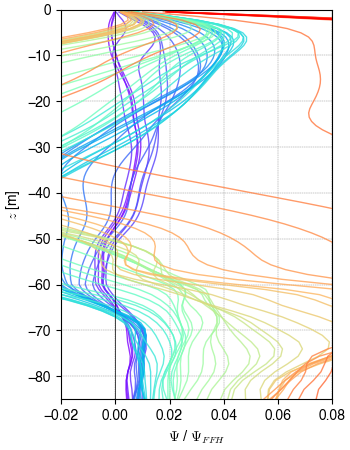

In [13]:
plt.close()
_,ax = plt.subplots(figsize=(3.5,4.5), constrained_layout=True, sharex=True, sharey=True)

ntime = dsl.time.size

lines = [np.column_stack([psi_nondim.isel(time=i), dsl.zC]) for i in range(ntime)]
line_collection = LineCollection(lines, array=dsf.hour[:ntime], cmap='rainbow', linewidths=1, alpha=0.8)
ax.add_collection(line_collection)

plt.grid(True, c='gray', ls='--', lw=0.3)
plt.axvline(0, c='k', lw=0.5)
ax.set_ylim(-85, 0)
ax.set_xlim(-0.02, 0.08)
ax.set_ylabel(r'z [m]')
ax.set_xlabel(r'$\Psi$ / $\Psi_{FFH}$');

In [14]:
psi_from_b = - dsl.w_b.mean('yC') / dsl.dbymdx.where(mask)
mean_c_flux_from_psi = (-0.05 * dsl.dcymdx).where(mask).mean('xC')

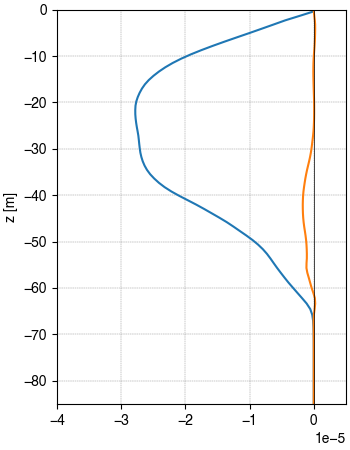

In [16]:
plt.close()
_,ax = plt.subplots(figsize=(3.5,4.5), constrained_layout=True, sharex=True, sharey=True)

ntime = dsl.time.size

# lines = [np.column_stack([mean_c_gradx.isel(time=i), dsl.zC]) for i in range(ntime)]
# line_collection = LineCollection(lines, array=dsf.hour[:ntime], cmap='rainbow', linewidths=1, alpha=0.8)
# ax.add_collection(line_collection)

# plt.plot(mean_c_gradx.isel(time=36), dsl.zC)
plt.plot(mean_c_flux.isel(time=36), dsl.zC)
plt.plot(mean_c_flux_from_psi.isel(time=36), dsl.zC)
plt.grid(True, c='gray', ls='--', lw=0.3)
plt.axvline(0, c='k', lw=0.5)
ax.ticklabel_format(axis='x', style='sci', scilimits=(0, 0))
ax.set_ylim(-85, 0)
# ax.set_xlim(-4e-10, 18e-10)
ax.set_xlim(-4e-5, 0.5e-5)
# ax.set_xlim(-7.2e-5, 13.2e-5)
# ax.set_xlim(-0.2e-2, 3.2e-2)
ax.set_ylabel(r'z [m]');

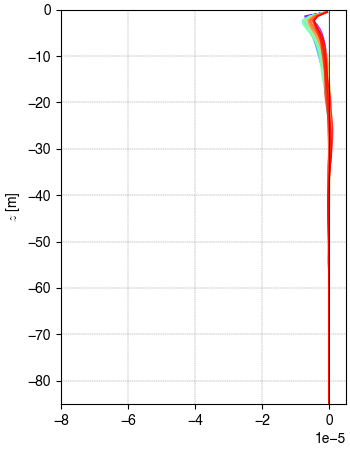

In [17]:
plt.close()
_,ax = plt.subplots(figsize=(3.5,4.5), constrained_layout=True, sharex=True, sharey=True)

dsl = dsl1.copy()
mask = (np.abs(dsl.dbymdx.where(dsl.zC >= -60).mean(['zC'])) >= dsl.attrs['M²']/5).compute()
ntime = dsl.time.size

lines = [np.column_stack([dsl.wc.mean('yC').where(mask).isel(time=i).mean('xC'), dsl.zC]) for i in range(ntime)]
line_collection = LineCollection(lines, array=dsf.hour[:ntime], cmap='rainbow', linewidths=1, alpha=0.8)
ax.add_collection(line_collection)

# plt.plot(dsl.wc.mean('yC').where(mask).isel(time=36).mean('xC'), dsl.zC)
plt.grid(True, c='gray', ls='--', lw=0.3)
plt.axvline(0, c='k', lw=0.5)
ax.ticklabel_format(axis='x', style='sci', scilimits=(0, 0))
ax.set_ylim(-85, 0)
ax.set_xlim(-8e-5, 0.5e-5)
ax.set_ylabel(r'z [m]', fontsize=12);

### Testing MLD from PE anomaly 

In [11]:
uniform_zF  = np.arange(np.ceil(dsl.zF[0]), 1)
uniform_zC  = (uniform_zF[:-1] + uniform_zF[1:])/2
uniform_dzF = np.diff(uniform_zF)

In [12]:
dsl['mld'] = get_mld_PE_anomaly(uniform_dzF,
                                dsl.b.interp(zC=uniform_zC, kwargs={'fill_value': 'extrapolate'}),
                                dsl.attrs,
                                energy=0.92).compute()

In [18]:
0.115*4*2

0.92

In [113]:
# b  = dsl.attrs['N₀²'] * (zC - zC[0])
# dbdz = np.ones_like(b) * dsl.attrs['N₀²']

b = dsl.b.isel(time=-1, yC=10, xC=10).load().interp(zC=zC, kwargs={"fill_value": "extrapolate"})

# with warnings.catch_warnings():
#     warnings.simplefilter('ignore')
#     b_zf = grid.interp(b, axis='z', boundary='extend').transpose(..., 'zF')
#     dbdz = grid.diff(b_zf, axis='z') / dsl.dzF.data

In [24]:
from mixdiag import get_mld_PE_anomaly_interp_ufunc, get_mld_PE_anomaly_bisection_ufunc, get_mld_PE_anomaly_Newton_ufunc, PE_Kernel_linear,\
                    reversed_cumsum, MixLayers, PE_Kernel_constant

In [50]:
mld1 = get_mld_PE_anomaly_interp_ufunc(b.zC, dsl.dzF, b, dbdz, energy=0.5, rho0=1026, grav=9.81)
mld2 = get_mld_PE_anomaly_bisection_ufunc(b.zC, dsl.dzF, b, dbdz, energy=0.5, rho0=1026, grav=9.81)
# mld3 = get_mld_PE_anomaly_Newton_ufunc(b.zC, dsl.dzF, b, energy=0.5, rho0=1026, grav=9.81)

iteration not converged, remaining profiles: 1


In [114]:
rho    = 1026 - b * 1026 / 9.81
# drhodz = - dbdz * 1026 / 9.81
zu = zC + dzF/2
zl = zC - dzF/2
# pe_layer = PE_Kernel_linear(rho, drhodz, zu, zl)
pe_layer = PE_Kernel_constant(rho, zu, zl)

pe = reversed_cumsum(pe_layer)
pe_mixed = np.zeros_like(pe)
for k in reversed(range(b.size)):
    rho_mixed,_ = MixLayers(rho[k:], dzF[k:])
    pe_mixed[k] = PE_Kernel_constant(rho_mixed*np.ones_like(rho[k:]), zu[k:], zl[k:]).sum()

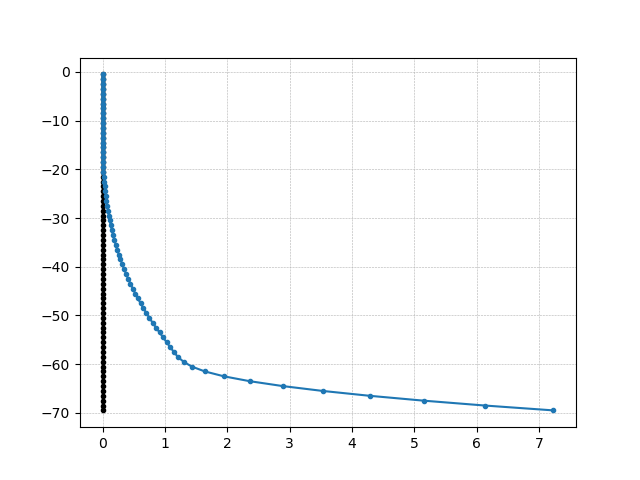

In [116]:
plt.close()
plt.figure()

# plt.plot(b, zC, '.-k')
# plt.plot(pe, zC, '.-')
plt.plot(pe_mixed - pe, zC, '.-')
plt.grid(ls='--', lw=0.4);
# plt.axhline(-mld1, ls='--', c='C0')
# plt.axhline(-mld2, ls='--', c='C1')
# plt.axhline(-mld3, ls='--', c='C2')
# plt.ylim(-70, 0);

### Visualize slices

In [ ]:
plt.close()
plt.figure(figsize=(2.9,4), constrained_layout=True)

itime = 48 - 1
y0 = slice(0,4000)
# x0 = slice(-3000, -1000)
x0 = slice(-4000, -3700)

# mask = np.abs(wc_mld) >= 1e-5

# mean_bld_box = dsf.bld.isel(time=itime).sel(xC=x0, yC=y0).mean(['xC', 'yC'])
# plt.plot(-dsl.wc.isel(time=itime).sel(xC=x0, yC=y0).mean(['xC', 'yC']) / \
#          dsl.dcdz.isel(time=itime).sel(xC=x0, yC=y0).mean(['xC', 'yC']) / ((4.8e-10*mean_bld_box)**(1/3)*mean_bld_box), dsl.zC)

# mean_bld_mask = dsf.bld.isel(time=itime).where(mask).mean(['xC', 'yC'])
# plt.plot(-dsl.wc.isel(time=itime).where(mask).mean(['xC', 'yC']) / \
#          dsl.dcdz.isel(time=itime).where(mask).mean(['xC', 'yC']) / ((4.8e-10*mean_bld_mask)**(1/3)*mean_bld_mask), dsl.zC, '--C0')

# plt.plot(dsl.b.isel(time=itime).sel(yC=y0, xC=x0, method='nearest'), ds.zC);
# plt.plot(dsl.c.isel(time=itime).sel(yC=y0, xC=x0, method='nearest'), ds.zC);
# plt.plot(dsl.c.isel(time=itime).sel(yC=y0, xC=x0+200, method='nearest'), ds.zC);

# plt.plot(dsl.u.isel(time=itime).sel(yC=y0, xC=x0, method='nearest'), ds.zC);
# plt.plot(dsl.v.isel(time=itime).sel(yC=y0, xC=x0, method='nearest'), ds.zC);

# plt.plot(dsl.EPV.isel(time=itime).sel(yC=y0, xC=x0).mean(['xC', 'yC']), ds.zC);
plt.plot(dsl.EPV.isel(time=itime).sel(yC=1450, xC=-2250, method='nearest'), ds.zC);

# plt.axhline(-dsf.mld.isel(time=itime).sel(xC=x0, yC=y0).mean(['xC', 'yC']), c='xkcd:scarlet')
# plt.axhline(-dsf.mld.isel(time=itime).where(mask).mean(['xC', 'yC']), c='xkcd:scarlet', ls='--')
# plt.axhline(-dsf.bld.isel(time=itime).sel(xC=x0, yC=y0).mean(['xC', 'yC']), c='xkcd:marine', ls='--', lw=1)
# plt.xlabel(r'$\mathcal{K}_v$ / $w_* h$')
plt.ylim(-70, 0);

In [ ]:
plt.close()
plt.figure(figsize=(13,2.8), constrained_layout=True)

itime = 48 - 1
x0 = -2550
rolly = int(0/dyF)

# pcm,_ = pcolor_limits(ds.c.isel(time=itime).sel(xC=x0, method='nearest').roll(yC=-rolly), cmap=plt.get_cmap('Spectral_r',20), clim=[0,1])
# pcm,_ = pcolor_center(ds.w.isel(time=itime).sel(xC=x0, method='nearest').roll(yC=-rolly), cmap=plt.get_cmap('w_ds', 20))
# pcm,_ = pcolor_center(dsl.wc.isel(time=itime).sel(xC=x0, method='nearest').roll(yC=-rolly), cmap=plt.get_cmap('cp_ds', 20), cupr=2)
# pcm,_ = pcolor_center(dsl.w_c.isel(time=itime).sel(xC=x0, method='nearest').roll(yC=-rolly), cmap=plt.get_cmap('cp_ds', 20), cupr=2)

# pcm,_ = pcolor_center(dsl['δ'].isel(time=itime).sel(xC=x0, method='nearest').roll(yC=-rolly)/dsl.f, cmap=plt.get_cmap('RdBu_r_ds', 20), cupr=2)
# pcm,_ = pcolor_limits(dsl.ww.isel(time=itime).sel(xC=x0, method='nearest').roll(yC=-rolly), cmap=plt.get_cmap('cmo.tempo', 20), cupr=2)
# pcm,_ = pcolor_center(dsl['HSP_σ'].isel(time=itime).sel(xC=x0, method='nearest').roll(yC=-rolly), cmap=plt.get_cmap('RdBu_r_ds', 20), cupr=2)
# pcm,_ = pcolor_center(dsl.dcdz.isel(time=itime).sel(xC=x0, method='nearest').roll(yC=-rolly), cmap=plt.get_cmap('RdBu_r_ds', 20))
# pcm,_ = pcolor_center((-dsl.wc/dsl.dcdz).isel(time=itime).sel(xC=x0, method='nearest').roll(yC=-rolly), cmap=plt.get_cmap('RdBu_r_ds', 20))

config_colorbar(pcm)

plt.plot(dsl.yC/1e3, -dsf.mld.isel(time=itime).sel(xC=x0, method='nearest').roll(yC=-rolly), 'xkcd:scarlet')#, ls='--')
plt.plot(dsl.yC/1e3, -dsf.bld.isel(time=itime).sel(xC=x0, method='nearest').roll(yC=-rolly), 'xkcd:marine', ls='--', lw=1)

plt.contour(ds.yC/1e3, ds.zC, ds.b.isel(time=itime).sel(xC=x0, method='nearest').roll(yC=-rolly), blines_upper, colors='k', linewidths=0.4)
plt.ylim(-75, 0);
# plt.xlim(-3.2, -0.8);

In [ ]:
plt.close()
plt.figure(figsize=(13.5,3.5), constrained_layout=True)

ds  = ds1.copy()
dsl = dsl1.copy()
dsf = dsf1.copy()

# itime = 48 - 1
# y0 = 1450
itime = 24 - 1
y0 = 1000
# pcm,_ = pcolor_limits((ds.n).isel(time=itime).sel(yC=y0, method='nearest'), cmap='Spectral_r', clim=[0,1])
pcm,_ = pcolor_limits((ds.c).isel(time=itime).sel(yC=y0, method='nearest'), cmap='Spectral_r', clim=[0,1])
# pcm,_ = pcolor_center((ds.w).isel(time=itime).sel(yC=y0, method='nearest'), cmap='w_ds', cupr=2)
# pcm,_ = pcolor_center((ds.u-dsl.u).isel(time=itime).sel(yC=y0, method='nearest'), cmap='w_ds', cupr=1)

# pcm,_ = pcolor_center(dsl['δ'].isel(time=itime).sel(yC=y0, method='nearest')/dsl.f, cmap=plt.get_cmap('RdBu_r_ds', 20), cupr=3)
# pcm,_ = pcolor_center(dsl['EPV'].isel(time=itime).sel(yC=y0, method='nearest'), cmap=plt.get_cmap('RdBu_r', 20), cupr=1)
# pcm,_ = pcolor_limits(dsl.fske.isel(time=itime).sel(yC=y0, method='nearest'), cmap=plt.get_cmap('cmo.tempo', 20), cupr=2)
# pcm,_ = pcolor_center(dsl['HSP'].isel(time=itime).sel(yC=y0, method='nearest'), cmap='RdBu_r_ds', cupr=6)
# pcm,_ = pcolor_center(dsl['HSP_δ'].isel(time=itime).sel(yC=y0, method='nearest'), cmap='RdBu_r_ds', cupr=6)
# pcm,_ = pcolor_center(dsl['w_b'].isel(time=itime).sel(yC=y0, method='nearest'), cmap='RdBu_r_ds', cupr=6)
# pcm,_ = pcolor_center(dsl.dcdx.isel(time=itime).sel(yC=y0, method='nearest'), cmap='cp')

# pcm,_ = pcolor_center((dsl.wc).isel(time=itime).sel(yC=y0, method='nearest'), cmap='cp_ds', smag=2e-4)
# pcm,_ = pcolor_limits(np.abs(dsl.nFFcz.isel(time=itime).sel(yC=y0, method='nearest').where(np.abs(dsl.wc).isel(time=itime).sel(yC=y0, method='nearest') >= 1e-5)),
#                       cmap=plt.get_cmap('YlGnBu', 10), clim=[0,1])
# pcm,_ = pcolor_center(dsl.w_c_dia.isel(time=itime).sel(yC=y0, method='nearest'), cmap='cp')
# pcm,_ = pcolor_center((dsl.w_c).isel(time=itime).sel(yC=y0, method='nearest'), cmap='cp_ds', smag=4e-4)

plt.plot(dsl.xC/1e3, -dsf.mld.isel(time=itime).sel(yC=y0, method='nearest'), 'xkcd:cyan')#, ls='--')
# plt.plot(dsl.xC/1e3, -dsf.bld.isel(time=itime).sel(yC=y0, method='nearest'), 'xkcd:marine', ls='--', lw=1)
config_colorbar(pcm)

plt.contour(ds.xC/1e3, ds.zC, ds.b.isel(time=itime).sel(yC=y0, method='nearest'), blines_upper, colors='k', linewidths=0.4)
# plt.contour(dsl.xC/1e3, dsl.zC, dsl.b.isel(time=itime).sel(yC=y0, method='nearest'), blines_upper, colors='k', linewidths=0.4)
# plt.contour(dsl.xC/1e3, dsl.zC, dsl.c.isel(time=itime).sel(yC=y0, method='nearest'), np.arange(0.2,1,0.1), colors='gray', linewidths=0.4)
plt.ylim(-70, 0);
plt.xlim(-3.4, -0.6);
# plt.xlim(-1.95, -1.35);

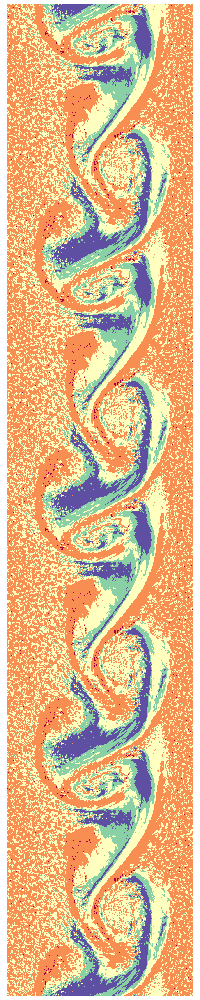

In [95]:
xslice = slice(500, 3500)
btop0 = ds3.c.isel(zC=-20,time=55).sel(xC=xslice)
btop1 = btop0.copy().assign_coords(yC=btop0.yC+4004)
btop2 = btop1.copy().assign_coords(yC=btop1.yC+4004)
btop3 = btop2.copy().assign_coords(yC=btop2.yC+4004)
btop  = xr.concat([btop0, btop1, btop2, btop3], dim='yC')#.rename({'xC': 'yC', 'yC': 'xC'})

plt.close()
plt.figure(figsize=(2,10), constrained_layout=True)

pcolor_limits(btop, cmap=plt.get_cmap('Spectral_r', 5), clim=[0,1])
plt.gca().axis('off')
plt.gca().set_aspect('equal')
plt.savefig(f'../Figures/elongated_banner.png', dpi=900, transparent=True);

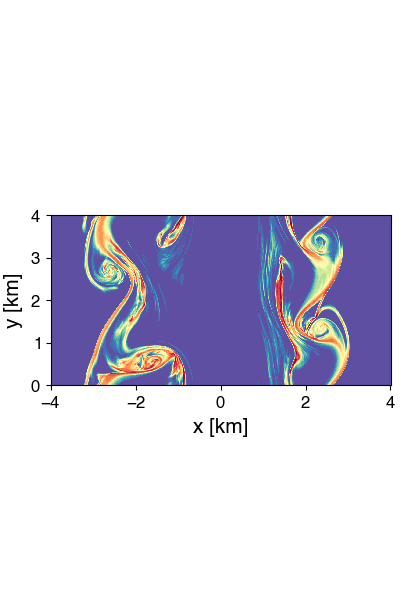

In [17]:
plt.close()
plt.figure(figsize=(4,6), constrained_layout=True)
# plt.figure(figsize=(3.2,4), constrained_layout=True)

ds  = ds0.copy()
# dsl = dsl1.copy()
# dsf = dsf1.copy()

itime = 60 - 1
depth = 5

# pcm,_ = pcolor_limits(dsl.mld.isel(time=itime), cmap='viridis_r')#, clim=[10, 30])
# pcm,_ = pcolor_center(dsl.mld.isel(time=itime) - dsf.bld.isel(time=itime), cmap='RdBu_r')

# pcm,_ = pcolor_center(dsl.nFFcz.isel(time=itime).sel(zC=-depth, method='nearest'), cmap=plt.get_cmap('flux', 11), smag=1)
# pcm,_ = pcolor_limits(np.abs(dsl.nFFcz.isel(time=itime).sel(zC=-depth, method='nearest')), cmap=plt.get_cmap('YlGnBu', 10), clim=[0, 1])
# pcm,_ = pcolor_center(dsl.nSFcz.isel(time=itime).sel(zC=-depth, method='nearest'), cmap=plt.get_cmap('flux', 11), smag=1)
# pcm,_ = pcolor_limits(np.abs(dsl.nSFcz.isel(time=itime).sel(zC=-depth, method='nearest').where(np.abs(dsl.w*dsl.c).isel(time=itime).sel(zC=-depth, method='nearest') >= 1e-4)),
#                       cmap=plt.get_cmap('cmo.tempo', 10), clim=[0, 1])

# pcm,_ = pcolor_center(dsl['ζ'].isel(time=itime).sel(zC=-depth, method='nearest').roll(yC=-200)/1e-4, cmap=plt.get_cmap('cmo.curl',32), smag=4)
# pcm,_ = pcolor_center(dsl['δ'].isel(time=itime).sel(zC=-depth, method='nearest')/1e-4, cmap=plt.get_cmap('cmo.balance',32), smag=4)
# pcm,_ = pcolor_limits(dsl['σ'].isel(time=itime).sel(zC=-depth, method='nearest')/1e-4, cmap=plt.get_cmap('positive_curl',32), clim=[0,4])
# pcm,_ = pcolor_center(dsl['M²'].isel(time=itime).sel(zC=-depth, method='nearest'), cmap=plt.get_cmap('cmo.balance',12))

# pcm,_ = pcolor_limits(dsl.anisotropy.isel(time=itime).sel(zC=-depth, method='nearest'), cmap=plt.get_cmap('cmo.amp',10), clim=[0,1])
# pcm,_ = pcolor_limits(dsl.ani.isel(time=itime), cmap=plt.get_cmap('cmo.amp',10), clim=[0,1])

# pcm,_ = pcolor_center(ds.v.isel(time=itime).sel(zC=-depth, method='nearest').roll(yC=-200), cmap=plt.get_cmap('RdBu_r',20), cupr=1)
# pcm,_ = pcolor_center((ds.w - dsl.w).isel(time=itime).sel(zC=-depth, method='nearest'), cmap=plt.get_cmap('RdBu_r',20), cupr=1)
pcm,_ = pcolor_limits(ds.c.isel(time=itime).sel(zC=-depth, method='nearest'), cmap=plt.get_cmap('Spectral_r',20), clim=[0,1])
# pcm,_ = pcolor_limits(ds.n.isel(time=itime).sel(zC=-depth, method='nearest'), cmap=plt.get_cmap('Spectral_r',20), clim=[0,1])
# pcm,_ = pcolor_limits(ds.b.isel(time=itime).sel(zC=-depth, method='nearest'), cmap='RdYlBu_r')
# pcm,_ = pcolor_limits(ds.cflux0.isel(time=itime), cmap='Blues_r')
# pcm,_ = pcolor_center(dsl.wc.isel(time=itime).sel(zC=-depth, method='nearest'), cmap=plt.get_cmap('cp_ds', 20), cupr=2)
# pcm,_ = pcolor_center(interp_to_zi(dsl.wc.isel(time=itime), -dsf.mld.isel(time=itime)), cmap=plt.get_cmap('cp_ds', 20), smag=1e-4)
# pcm,_ = pcolor_center(dsl.w_c.isel(time=itime).sel(zC=-depth, method='nearest'), cmap=plt.get_cmap('cp_ds', 20), cupr=2)
# pcm,_ = pcolor_center(interp_to_zi(dsl.w_c.isel(time=itime), -dsf.mld.isel(time=itime)), cmap=plt.get_cmap('cp_ds', 20), smag=4e-4)
# pcm,_ = pcolor_center(interp_to_zi(dsl.w.isel(time=itime), -dsf.mld.isel(time=itime)), cmap=plt.get_cmap('w_ds', 20))

# pcm,_ = pcolor_limits(interp_to_zi(dsl.fske.isel(time=itime), -dsf.mld.isel(time=itime)), cmap=plt.get_cmap('cmo.tempo',12))
# pcm,_ = pcolor_limits(interp_to_zi(dsl.ww.isel(time=itime), -dsf.mld.isel(time=itime)), cmap=plt.get_cmap('cmo.amp',12))

# config_colorbar(pcm)
# config_colorbar(pcm, sci_notation=False)

# plt.contour(dsl.xC/1e3, dsl.yC/1e3, dsl.b.isel(time=itime).sel(zC=0, method='nearest'), blines_upper, colors='k', linewidths=0.4)
# plt.contour(dsl.xC/1e3, dsl.yC/1e3, dsl.mask_fz.isel(time=itime), [0.5, 1.5], colors='xkcd:mauve')
# plt.gca().clabel(CS, inline=True, fontsize=10)
# plt.contour(dsl.xC/1e3, dsl.yC/1e3, dsl.b.isel(time=itime).sel(zC=-depth, method='nearest'), [6.92e-4, 7.13e-4], colors='m', linewidths=1)
# plt.contour(dsl.xC/1e3, dsl.yC/1e3,dsl['M²'].isel(time=itime).sel(zC=-depth, method='nearest'), [5e-8], colors='m', linewidths=1)

# plt.contour(dsl.xC/1e3, dsl.yC/1e3, dsl.anisotropy.isel(time=itime).sel(zC=-depth, method='nearest'), [0.1], colors='c', linewidths=1)
# plt.contour(dsl.xC/1e3, dsl.yC/1e3, dsl.ani.isel(time=itime), [0.1], colors='c', linewidths=1)

# plt.contour(dsl.xC/1e3, dsl.yC/1e3, dsl['δ'].isel(time=itime).sel(zC=-depth, method='nearest')/1e-4, [-0.5, 0.5], colors='b', linewidths=1)
# plt.contour(dsl.xC/1e3, dsl.yC/1e3, dsl['σ'].isel(time=itime).sel(zC=-depth, method='nearest')/1e-4, [2], colors='r', linewidths=1)

# idx1, idx2 = np.argwhere(np.diff(dsl.mask_fz.isel(time=itime, xC=slice(None,1000)), axis=-1).min(axis=0) < 0)[[0, -1]]
# plt.axvline(dsl.xC[idx1+1]/1e3, c='gray')
# plt.axvline(dsl.xC[idx2]/1e3, c='gray')

# idx3, idx4 = np.argwhere(np.diff(dsl.mask_fz.isel(time=itime, xC=slice(1000,None)), axis=-1).max(axis=0) > 0)[[0, -1]]
# plt.axvline(dsl.xC[idx3+1000+1]/1e3, c='gray')
# plt.axvline(dsl.xC[idx4+1000]/1e3, c='gray')

# import matplotlib.patches as patches
# rect = patches.Rectangle((-2450/1e3, 2250/1e3), 1.1, 1.1, linewidth=1, edgecolor='r', facecolor='none')
# plt.gca().add_patch(rect)

plt.gca().set_yticks(np.linspace(0,4,5))
plt.gca().set_aspect('equal')
plt.gca().set_xlabel(r'x [km]')
plt.gca().set_ylabel(r'y [km]');

# plt.xlim(0.7, 3.3);
# plt.xlim(-3.4, -1);
# plt.xlim(0, 4);
# plt.xlim(-3.42, -0.82);

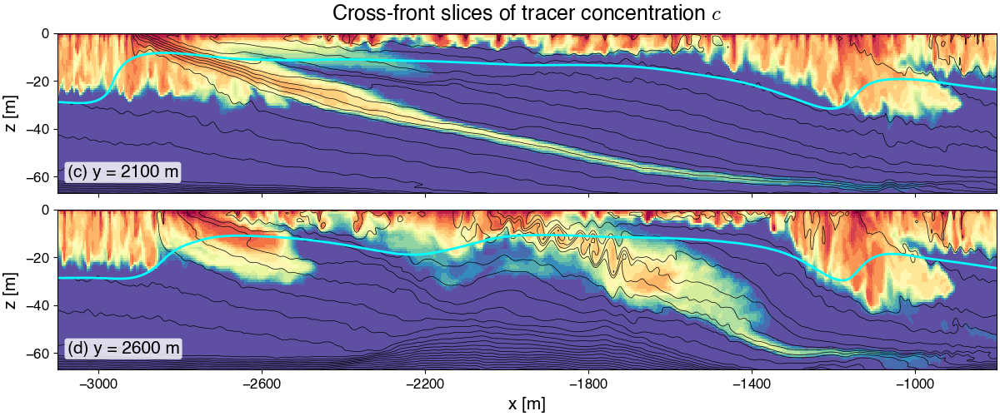

In [15]:
plt.close()
_,ax = plt.subplots(2,1, figsize=(12,5), constrained_layout=True, sharex=True, sharey=True)

ds  = ds1.copy()
dsf = dsf1.copy()
itime = 41 - 1
yslices = [2100, 2600]
txt_str = 'cd'

for i in range(2):
    pcm,_ = pcolor_limits(ds.c.isel(time=itime).sel(yC=yslices[i], method='nearest'), ax[i], cmap=plt.get_cmap('Spectral_r', 20), clim=[0,1], hori_km=False)
    ax[i].contour(ds.xC, ds.zC, ds.b.isel(time=itime).sel(yC=yslices[i], method='nearest'), blines_upper, colors='k', linewidths=0.5)
    ax[i].plot(dsf.xC, -dsf.mld.isel(time=itime).sel(yC=yslices[i], method='nearest'), 'xkcd:cyan', lw=2)
    ax[i].set_ylabel('z [m]', fontsize=15)
    ax[i].text(0.01, 0.08, f'({txt_str[i]}) y = {yslices[i]} m', fontsize=15, ha='left',  va='bottom', transform=ax[i].transAxes,
               bbox=dict(facecolor='w', edgecolor='none', alpha=0.8, boxstyle='round,pad=0.15'))
    # pcm,_= pcolor_center(ds.w.isel(time=itime).sel(yC=y0, method='nearest'), cmap=plt.get_cmap('w_ds', 20))

plt.ylim(-67, 0);
plt.xlim(-3100, -800)
plt.xticks([-3000, -2600, -2200, -1800, -1400, -1000])
ax[0].set_title('Cross-front slices of tracer concentration $c$', fontsize=18, pad=12)
plt.xlabel('x [m]', fontsize=15);

plt.savefig(f'../Figures/{cname1}_yslices.png', dpi=600);

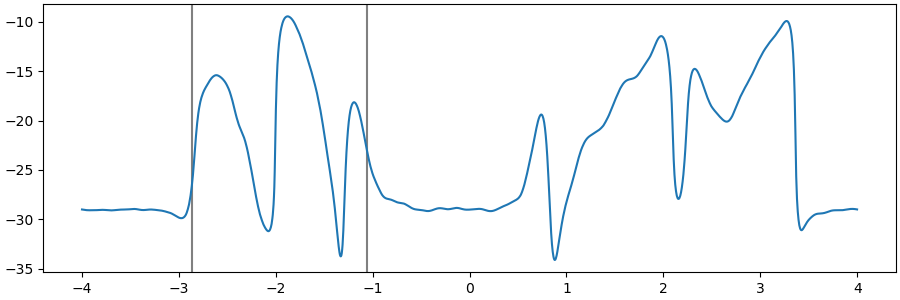

In [69]:
plt.close()
plt.figure(figsize=(9,3), constrained_layout=True)

idx1, idx2 = np.argwhere(np.diff(dsl.mask_fz.isel(time=itime, xC=slice(None,1000)).sel(yC=3617, method='nearest'), axis=-1) < 0)[[0, -1]]
plt.axvline(ds.xC[idx1+1]/1e3, c='gray')
plt.axvline(ds.xC[idx2]/1e3, c='gray')

plt.plot(ds.xC/1e3, -dsl.mld.isel(time=itime).sel(yC=3617, method='nearest'));

### Joint PDF of submesoscale fluxes

In [ ]:
varlist = ['u', 'v', 'w', 'b', 'c', 'xF', 'yF', 'zF']
dsl = filter_taper.apply(ds1[varlist].isel(time=slice(20 - 1, 44 - 1)).sel(zC=[0,-15], method='nearest'),  dims=['yC', 'xC'])
dsl

In [ ]:
dxF = dsl.xF.diff('xF').data[0]
dyF = dsl.yF.diff('yF').data[0]
grid = Grid(dsl, coords=coords)

with warnings.catch_warnings():
    warnings.simplefilter('ignore')

    ul_xf = grid.interp(dsl.u, axis='x').transpose(..., 'xF')
    ul_yf = grid.interp(dsl.u, axis='y').transpose(..., 'yF')

    vl_xf = grid.interp(dsl.v, axis='x').transpose(..., 'xF')
    vl_yf = grid.interp(dsl.v, axis='y').transpose(..., 'yF')

    dsl['dudx'] = grid.diff(ul_xf, axis='x') / dxF
    dsl['dudy'] = grid.diff(ul_yf, axis='y') / dyF

    dsl['dvdx'] = grid.diff(vl_xf, axis='x') / dxF
    dsl['dvdy'] = grid.diff(vl_yf, axis='y') / dyF

dsl['δ']  = dsl.dudx + dsl.dvdy
dsl['σₙ'] = dsl.dudx - dsl.dvdy
dsl['σₛ'] = dsl.dvdx + dsl.dudy
dsl['ζ']  = dsl.dvdx - dsl.dudy
dsl['σ']  = np.sqrt(dsl['σₙ']**2 + dsl['σₛ']**2)
dsl['w_c'] = dsl.w * dsl.c

In [12]:
ds  = ds1.sel(xC=slice(None, 0))
dsl = dsl1.sel(xC=slice(None, 0))
dsf = dsf1.sel(xC=slice(None, 0))

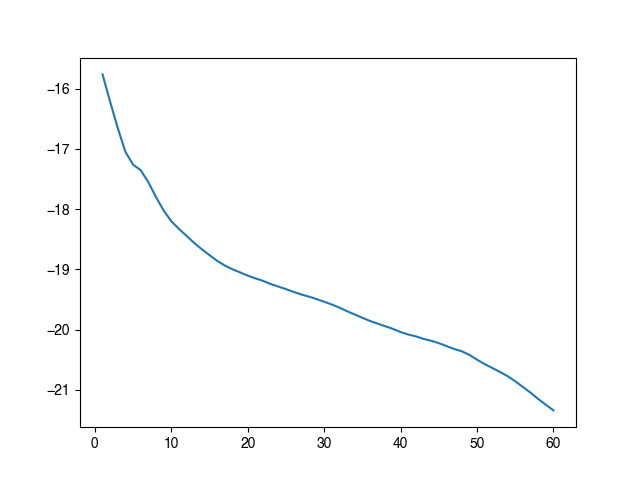

In [24]:
tmp = dsf.mld.where(dsl.is_fz).mean(['xC', 'yC'])
#.isel(time=slice(15-1, 32-1))    
plt.close()
plt.figure()
plt.plot(dsf.hour, -tmp);

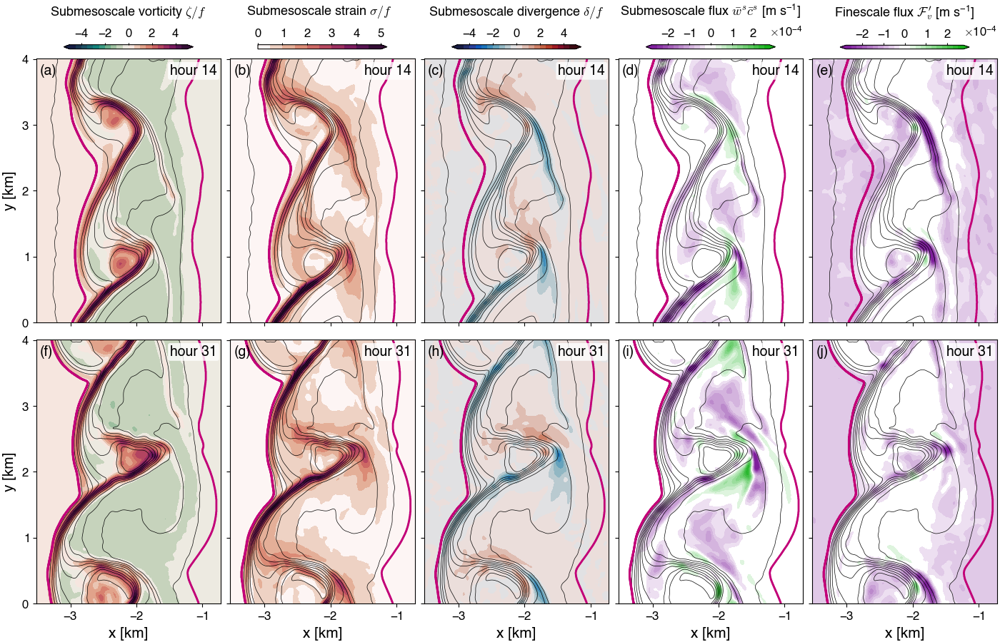

In [16]:
plt.close()
fig,ax = plt.subplots(2,5, figsize=(14,9.2), sharex=True, sharey=True, constrained_layout=True)

itime = [14 - 1, 31 - 1]
vsdd  = 0
depth = 10
txt_str = 'abcdefghij'
count = 0

for i in range(2):
    pcm0,_ = pcolor_center(dsl['ζ'].isel(time=itime[i]).sel(zC=-vsdd, method='nearest')/ds.f, ax[i,0], cmap=plt.get_cmap('cmo.curl',20), smag=5)
    pcm1,_ = pcolor_limits(dsl['σ'].isel(time=itime[i]).sel(zC=-vsdd, method='nearest')/ds.f, ax[i,1], cmap=plt.get_cmap('positive_curl',10), clim=[0,5])
    pcm2,_ = pcolor_center(dsl['δ'].isel(time=itime[i]).sel(zC=-vsdd, method='nearest')/ds.f, ax[i,2], cmap=plt.get_cmap('cmo.balance',20), smag=5)
    
    mask = (dsl.is_fz.isel(time=itime[i]) == 1).compute()
    
    wl = dsl.w.isel(time=itime[i]).sel(zC=-depth, method='nearest').where(mask)
    cl = dsl.c.isel(time=itime[i]).sel(zC=-depth, method='nearest').where(mask)
    w_c = (wl - wl.mean(['xC', 'yC'])) * (cl - cl.mean(['xC', 'yC']))
    pcm3,_ = pcolor_center(w_c, ax[i,3], cmap=plt.get_cmap('cp_ds',22), smag=2.75e-4)
    # pcm3,_ = pcolor_center(dsl.w_c.isel(time=itime[i]).sel(zC=-depth, method='nearest'), ax[i,2], cmap=plt.get_cmap('cp_ds',22), smag=2.75e-4)

    pcm4,_ = pcolor_center(dsl.wc.isel(time=itime[i]).sel(zC=-depth, method='nearest'), ax[i,4], cmap=plt.get_cmap('cp_ds',22), smag=2.75e-4)

    # pcm,_ = pcolor_center((wl - wl.where(mask).mean(['xC', 'yC'])), ax[0,0], cmap=plt.get_cmap('w_ds',32))
    # cbar = config_colorbar(pcm, ax=ax[0,0], sci_notation=True, location='top', shrink=0.6, aspect=35, pad=0.02, nbins=6, extend='both')
    # cbar.set_label(label=r'submesoscale vertical velocity $\bar{w}$', size=10, labelpad=10)
    
    # pcm,_ = pcolor_center((cl - cl.where(mask).mean(['xC', 'yC'])), ax[0,1], cmap=plt.get_cmap('flux',21))
    # cbar = config_colorbar(pcm, ax=ax[0,1], sci_notation=True, location='top', shrink=0.6, aspect=35, pad=0.02, nbins=6)
    # cbar.set_label(label=r'submesoscale tracer concentration $\bar{c}$', size=10, labelpad=10)

    if i == 0:
        cbar = config_colorbar(pcm0, ax=ax[i,0], sci_notation=True, location='top', shrink=0.7, aspect=30, pad=0.02, nbins=6, extend='both')
        cbar.set_label(label=r'Submesoscale vorticity $\zeta / f$', size=13, labelpad=12)

        cbar = config_colorbar(pcm1, ax=ax[i,1], sci_notation=True, location='top', shrink=0.7, aspect=30, pad=0.02, nbins=6, extend='max')
        cbar.set_label(label=r'Submesoscale strain $\sigma / f$', size=13, labelpad=12)

        cbar = config_colorbar(pcm2, ax=ax[i,2], sci_notation=True, location='top', shrink=0.7, aspect=30, pad=0.02, nbins=6, extend='both')
        cbar.set_label(label=r'Submesoscale divergence $\delta / f$', size=13, labelpad=12)

        cbar = config_colorbar(pcm3, ax=ax[i,3], sci_notation=True, location='top', shrink=0.7, aspect=30, pad=0.02, nbins=6, extend='both')
        cbar.set_label(label=r'Submesoscale flux $\bar{w}^s \bar{c}^s$ [m s$\mathregular{^{-1}}$]', size=13, labelpad=12)

        cbar = config_colorbar(pcm4, ax=ax[i,4], sci_notation=True, location='top', shrink=0.7, aspect=34, pad=0.02, nbins=6, extend='both')
        cbar.set_label(label=r'Finescale flux $\mathcal{F}_v^{\,\prime}$ [m s$\mathregular{^{-1}}$]', size=13, labelpad=12)

    for j in range(5):
        ax[i,j].text(0.02, 0.98, f'({txt_str[count]})', fontsize=14, ha='left',  va='top', transform=ax[i,j].transAxes)
        ax[i,j].text(0.98, 0.98, f'hour {itime[i]+1}',  fontsize=14, ha='right', va='top', transform=ax[i,j].transAxes,
                     bbox=dict(facecolor='w', edgecolor='none', alpha=0.8, boxstyle='round,pad=0.15'))
        ax[i,j].contour(ds.xC/1e3, ds.yC/1e3, dsl.b.isel(time=itime[i]).isel(zC=-1), blines_upper, colors='k', linewidths=0.5)
        ax[i,j].contour(ds.xC/1e3, ds.yC/1e3, dsl['is_fz'].isel(time=itime[i]), [0.5, 1.5], colors='xkcd:magenta', linewidths=2)
        ax[i,j].set_aspect('equal')
        if i == 1:
            ax[i,j].set_xlabel(r'x [km]', fontsize=15)
        if j == 0:
            ax[i,j].set_ylabel(r'y [km]', fontsize=15)
        count += 1

ax[0,0].set_yticks(np.linspace(0,4,5))
ax[0,0].set_xticks(np.linspace(-3,-1,3))
plt.xlim(-3.52, -0.72);
# plt.xlim(0.62, 3.45);

plt.savefig(f'../Figures/{cname1}_vort_strain_fluxes_map.png', dpi=300);

In [ ]:
plt.close()
fig,ax = plt.subplots(1,4, figsize=(12,4.5), sharex=True, sharey=True, constrained_layout=True)

itime = 30 - 1
vsdd  = 0
depth = 10
txt_str = 'abcde'

pcm0,_ = pcolor_center(dsl['ζ'].isel(time=itime).sel(zC=-vsdd, method='nearest')/ds.f, ax[0], cmap=plt.get_cmap('cmo.curl',20), smag=5)
pcm1,_ = pcolor_limits(dsl['σ'].isel(time=itime).sel(zC=-vsdd, method='nearest')/ds.f, ax[1], cmap=plt.get_cmap('positive_curl',10), clim=[0,5])

# pcm,_ = pcolor_center(dsl['δ'].isel(time=itime).sel(zC=-vsdd, method='nearest')/ds.f, ax[3], cmap=plt.get_cmap('cmo.balance',40), smag=5)
# cbar = config_colorbar(pcm, ax=ax[3], sci_notation=True, location='top', shrink=0.8, aspect=35, pad=0.02, nbins=6, extend='both')
# cbar.set_label(label=r'Surface divergence, $\bar{\delta} / f$', size=12, labelpad=10)

# mask = (dsl['M²'].isel(time=itime[i]).sel(zC=slice(-60, 0)).mean('zC') >= 1e-8).compute()

wl = dsl.w.isel(time=itime).sel(zC=-depth, method='nearest')
cl = dsl.c.isel(time=itime).sel(zC=-depth, method='nearest')
w_c = (wl - wl.mean(['xC', 'yC'])) * (cl - cl.mean(['xC', 'yC']))
pcm2,_ = pcolor_center(w_c, ax[2], cmap=plt.get_cmap('cp_ds',22), smag=2.75e-4)
# pcm2,_ = pcolor_center(dsl.w_c.isel(time=itime).sel(zC=-depth, method='nearest'), ax[2], cmap=plt.get_cmap('cp_ds',22), smag=2.75e-4)

pcm3,_ = pcolor_center(dsl.wc.isel(time=itime).sel(zC=-depth, method='nearest'), ax[3], cmap=plt.get_cmap('cp_ds',22), smag=2.75e-4)

cbar = config_colorbar(pcm0, ax=ax[0], sci_notation=True, location='top', shrink=0.8, aspect=35, pad=0.02, nbins=6, extend='both')
cbar.set_label(label=r'Surface vorticity $\zeta / f$', size=12, labelpad=10)

cbar = config_colorbar(pcm1, ax=ax[1], sci_notation=True, location='top', shrink=0.8, aspect=35, pad=0.02, nbins=6, extend='max')
cbar.set_label(label=r'Surface strain $\sigma / f$', size=12, labelpad=10)

cbar = config_colorbar(pcm2, ax=ax[2], sci_notation=True, location='top', shrink=0.8, aspect=35, pad=0.02, nbins=6, extend='both')
cbar.set_label(label=r'Submesoscale tracer flux $\bar{w}^s \bar{c}^s$ [m s$\mathregular{^{-1}}$]', size=12, labelpad=10)

cbar = config_colorbar(pcm3, ax=ax[3], sci_notation=True, location='top', shrink=0.8, aspect=35, pad=0.02, nbins=6, extend='both')
cbar.set_label(label=r'Finescale tracer flux $\mathcal{F}_v^{\,\prime}$ [m s$\mathregular{^{-1}}$]', size=12, labelpad=10)

for j in range(4):
    ax[j].text(0.02, 0.98, f'({txt_str[j]})',  fontsize=12, ha='left',  va='top', transform=ax[j].transAxes)
    ax[j].text(0.98, 0.98, f'hour {itime+1}',  fontsize=12, ha='right', va='top', transform=ax[j].transAxes,
                 bbox=dict(facecolor='w', edgecolor='none', alpha=0.8, boxstyle='round,pad=0.15'))
    ax[j].contour(ds.xC/1e3, ds.yC/1e3, dsl.b.isel(time=itime).isel(zC=-1), blines_upper, colors='k', linewidths=0.3)
    ax[j].contour(ds.xC/1e3, ds.yC/1e3, dsl['is_fz'].isel(time=itime), [0.5, 1.5], colors='xkcd:magenta', linewidths=1.2)
    ax[j].set_aspect('equal')
    ax[j].set_xlabel(r'x [km]', fontsize=12)

ax[0].set_ylabel(r'y [km]', fontsize=12)
ax[0].set_yticks(np.linspace(0,4,5))
ax[0].set_xticks(np.linspace(-3,-1,3))
plt.xlim(-3.52, -0.72);
# plt.xlim(0.62, 3.45);

# plt.savefig(f'../Figures/{cname1}_vort_strain_fluxes_map.png', dpi=900);

In [13]:
dvort = 0.1
dstrn = 0.1
ddivg = 0.1

min_vort, max_vort = -2, 6
min_strn, max_strn =  0, 6
min_divg, max_divg = -2, 2

vort_bin_edges = np.arange(min_vort, max_vort+dvort, dvort)
strn_bin_edges = np.arange(min_strn, max_strn+dstrn, dstrn)
divg_bin_edges = np.arange(min_divg, max_divg+ddivg, ddivg)
vort_binc = (vort_bin_edges[:-1] + vort_bin_edges[1:])/2
strn_binc = (strn_bin_edges[:-1] + strn_bin_edges[1:])/2
divg_binc = (divg_bin_edges[:-1] + divg_bin_edges[1:])/2

itime = slice(14 - 1, 48 - 1)
vsdd  = 0
depth = 10

# bl_surf = dsl.b.isel(time=itime).sel(zC=0, method='nearest')
# mask = ((bl_surf >= 6.65e-4) & (bl_surf <= 7.2e-4)).compute()# & (dsl.xC < 0)
# mask = (dsl['M²'].isel(time=itime).sel(zC=slice(-60, 0)).mean('zC') >= 1e-8).compute()
mask = (dsl.is_fz.isel(time=itime) == 1).compute()

vort = dsl['ζ'].isel(time=itime).sel(zC=-vsdd, method='nearest').where(mask,drop=True).data.flatten()/ds.f
strn = dsl['σ'].isel(time=itime).sel(zC=-vsdd, method='nearest').where(mask,drop=True).data.flatten()/ds.f
divg = dsl['δ'].isel(time=itime).sel(zC=-vsdd, method='nearest').where(mask,drop=True).data.flatten()/ds.f

count_vort_strn,_,_ = np.histogram2d(vort, strn, bins=(vort_bin_edges, strn_bin_edges), density=False)
# count_vort_divg,_,_ = np.histogram2d(vort, divg, bins=(vort_bin_edges, divg_bin_edges), density=False)
pdf_vort_strn = count_vort_strn / (dvort*dstrn) / mask.sum().data
pdf_vort_strn = pdf_vort_strn.compute()
# pdf_vort_divg = count_vort_divg / (dvort*ddivg) / mask.sum().data
ipdf_vort_strn = get_pdf_of_icdf(pdf_vort_strn, dvort*dstrn, icdf=[0.6, 0.9, 0.99])
# ipdf_vort_divg = get_pdf_of_icdf(pdf_vort_divg, dvort*ddivg, icdf=[0.6, 0.9, 0.99])

# surface divergence
divg_count_vort_strn,_,_ = np.histogram2d(vort, strn, weights=divg, bins=(vort_bin_edges, strn_bin_edges), density=False)
divg_vort_strn = divg_count_vort_strn / np.where(count_vort_strn < 5*34, np.nan, count_vort_strn)
divg_vort_strn = divg_vort_strn.compute()

# submesoscale
wl  = dsl.w.isel(time=itime).sel(zC=-depth, method='nearest').where(mask)
cl  = dsl.c.isel(time=itime).sel(zC=-depth, method='nearest').where(mask)
w_c = ((wl - wl.mean(['xC', 'yC'])) * \
       (cl - cl.mean(['xC', 'yC']))).where(mask,drop=True).data.flatten()
# w_c  = dsl['w_c'].isel(time=itime).sel(zC=-depth, method='nearest').where(mask,drop=True).data.flatten()
w_c_count_vort_strn,_,_ = np.histogram2d(vort, strn, weights=w_c, bins=(vort_bin_edges, strn_bin_edges), density=False)
# w_c_count_vort_divg,_,_ = np.histogram2d(vort, divg, weights=w_c, bins=(vort_bin_edges, divg_bin_edges), density=False)
w_c_vort_strn = w_c_count_vort_strn / np.where(count_vort_strn < 5*34, np.nan, count_vort_strn)
w_c_vort_strn = w_c_vort_strn.compute()
# w_c_vort_divg = w_c_count_vort_divg / np.where(pdf_vort_divg < ipdf_vort_divg[0]*0.5, np.nan, count_vort_divg)

# finescale
wc = dsl['wc'].isel(time=itime).sel(zC=-depth, method='nearest').where(mask,drop=True).data.flatten()
wc_count_vort_strn,_,_ = np.histogram2d(vort, strn, weights=wc, bins=(vort_bin_edges, strn_bin_edges), density=False)
wc_vort_strn = wc_count_vort_strn / np.where(count_vort_strn < 5*34, np.nan, count_vort_strn)
wc_vort_strn = wc_vort_strn.compute()

# surface flux
# Fc0 = -1e-3 * (1 - ds.c.isel(time=itime, zC=-1).where(mask,drop=True)).data.flatten()
# Fc0_count_vort_strn,_,_ = np.histogram2d(vort, strn, weights=Fc0, bins=(vort_bin_edges, strn_bin_edges), density=False)
# Fc0_vort_strn = Fc0_count_vort_strn / np.where(pdf_vort_strn < ipdf_vort_strn[0]*0.5, np.nan, count_vort_strn)
# Fc0_vort_strn = Fc0_vort_strn.compute()

/glade/work/zhihuaz/conda-envs/trace-seas/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 31.60 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/glade/work/zhihuaz/conda-envs/trace-seas/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 32.03 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/glade/work/zhihuaz/conda-envs/trace-seas/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large gr

In [ ]:
plt.close()
_,ax = plt.subplots(1,1, figsize=(5, 3), sharex=True, constrained_layout=True)

pcm = ax.pcolormesh(vort_binc, strn_binc, pdf_vort_strn.T, cmap='pdf', norm=mcl.LogNorm(8e-4,3e-1))
ax.contour(vort_binc, strn_binc, pdf_vort_strn.T, levels=ipdf_vort_strn, colors='k', linewidths=0.5)
ax.plot([0, 7], [0, 7], 'k', ls=(0, (5, 5)), lw=0.8)
ax.plot([0,-4], [0, 4], 'k', ls=(0, (5, 5)), lw=0.8)
ax.axvline(0, c='k', ls=(0, (5, 5)), lw=0.8)

# pcm = ax[1].pcolormesh(vort_binc, divg_binc, pdf_vort_divg.T, cmap='pdf', norm=mcl.LogNorm(2e-3,4e-1))
# ax[1].contour(vort_binc, divg_binc, pdf_vort_divg.T, levels=ipdf_vort_divg, colors='k', linewidths=0.5)
# ax[1].axvline(0, c='k', ls='--', lw=1)
# ax[1].axhline(0, c='k', ls='--', lw=1)
# cbar = plt.colorbar(pcm, ax=ax, location='right', shrink=0.6, aspect=60, pad=0.02, extend='min')
# cbar.ax.tick_params(labelsize=8, length=2)
# cbar.set_label(label='Joint PDF', size=10)

ax.set_xlim(-4, 7)
ax.set_ylim( 0, 7)
ax.set_aspect('equal')
# ax[1].set_aspect('equal')
ax.set_yticks(np.linspace(0,6,4))
# ax[1].set_yticks(np.linspace(-2,2,5))
ax.set_xlabel(r'surface vorticity $\zeta$ / $f$')
ax.set_ylabel(r'surface strain $\sigma$ / $f$');
# ax[1].set_ylabel(r'surface divergence $\bar{\delta}$ / $f$');

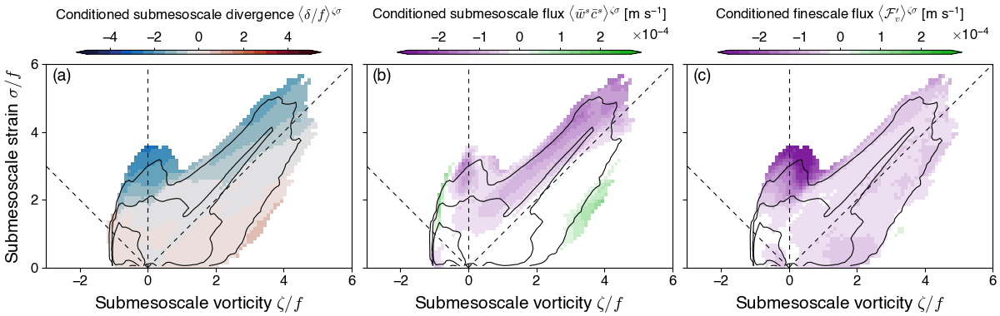

In [16]:
plt.close()
_,ax = plt.subplots(1,3, figsize=(12, 3.8), sharex=True, sharey=True, constrained_layout=True)

mag = 5
pcm = ax[0].pcolormesh(vort_binc, strn_binc, divg_vort_strn.T, cmap=plt.get_cmap('cmo.balance', 20), vmin=-mag, vmax=mag)
cbar = config_colorbar(pcm, ax=ax[0], sci_notation=False, location='top', shrink=0.8, aspect=60, pad=0.02, nbins=6, extend='both')
cbar.set_label(label=r'Conditioned submesoscale divergence $\langle \delta/f \rangle^{\zeta\sigma}$', size=12, labelpad=10)

mag = 2.75e-4
pcm = ax[1].pcolormesh(vort_binc, strn_binc, w_c_vort_strn.T, cmap=plt.get_cmap('cp_ds', 22), vmin=-mag, vmax=mag)
# pcm = ax.pcolormesh(vort_binc, strn_binc, (w_c_vort_strn*pdf_vort_strn).T / np.nansum(w_c_vort_strn*pdf_vort_strn), cmap=plt.get_cmap('cp', 20),
#                     norm=mcl.SymLogNorm(linthresh=1e-2, vmin=-1, vmax=1))
cbar = config_colorbar(pcm, ax=ax[1], sci_notation=True, location='top', shrink=0.8, aspect=60, pad=0.02, nbins=6, extend='both')
cbar.set_label(label=r'Conditioned submesoscale flux $\langle \bar{w}^s \bar{c}^s \rangle^{\zeta\sigma}$ [m s$\mathregular{^{-1}}$]', size=12, labelpad=10)

mag = 2.75e-4
pcm = ax[2].pcolormesh(vort_binc, strn_binc, wc_vort_strn.T, cmap=plt.get_cmap('cp_ds', 22), vmin=-mag, vmax=mag)
cbar = config_colorbar(pcm, ax=ax[2], sci_notation=True, location='top', shrink=0.8, aspect=60, pad=0.02, nbins=6, extend='both')
cbar.set_label(label=r'Conditioned finescale flux $\langle \mathcal{F}_v^{\,\prime} \rangle^{\zeta\sigma}$ [m s$\mathregular{^{-1}}$]', size=12, labelpad=10)

txt_str = 'abc'
for j in range(3):
    ax[j].contour(vort_binc, strn_binc, pdf_vort_strn.T, levels=ipdf_vort_strn, colors='k', linewidths=0.8)
    ax[j].plot([0,  6], [0, 6], 'k', ls=(0, (5, 5)), lw=0.8)
    ax[j].plot([0, -3], [0, 3], 'k', ls=(0, (5, 5)), lw=0.8)
    ax[j].axvline(0, c='k', ls=(0, (5, 5)), lw=0.8)
    ax[j].text(0.02, 0.98, f'({txt_str[j]})', fontsize=14, ha='left', va='top', transform=ax[j].transAxes)
    ax[j].set_yticks(np.linspace(0,6,4))
    ax[j].set_aspect('equal')
    ax[j].set_xlabel(r'Submesoscale vorticity $\zeta / f$', fontsize=15)
ax[0].set_xlim(-3, 6)
ax[0].set_ylim( 0, 6)
ax[0].set_ylabel(r'Submesoscale strain $\sigma / f$', fontsize=15);

plt.savefig(f'../Figures/{cname1}_conditional_mean_flux.png', dpi=300);

In [ ]:
plt.close()
_,ax = plt.subplots(1,1, figsize=(5, 3), sharex=True, constrained_layout=True)

mag = 2.75e-4
pcm = ax.pcolormesh(vort_binc, strn_binc, Fc0_vort_strn.T, cmap=plt.get_cmap('cp', 22), vmin=-mag, vmax=mag)
cbar = config_colorbar(pcm, sci_notation=True, location='top', shrink=0.8, aspect=60, pad=0.02, nbins=6, extend='both')
cbar.set_label(label=r'Conditional mean surface flux, $\langle \mathcal{F}_0^c \rangle^{\zeta\sigma}$', size=12, labelpad=10)

ax.contour(vort_binc, strn_binc, pdf_vort_strn.T, levels=ipdf_vort_strn, colors='k', linewidths=0.5)
ax.plot([0, 7.5], [0, 7.5], 'k', ls=(0, (5, 5)), lw=0.8)
ax.plot([0,  -4], [0,   4], 'k', ls=(0, (5, 5)), lw=0.8)
ax.axvline(0, c='k', ls=(0, (5, 5)), lw=0.8)

ax.set_xlim(-4, 7.5)
ax.set_ylim( 0, 7.5)
ax.set_aspect('equal')
ax.set_yticks(np.linspace(0,6,4))
ax.set_ylabel(r'Surface strain, $\sigma / f$', fontsize=12)
ax.set_xlabel(r'Surface vorticity, $\zeta / f$', fontsize=12);

### Joint PDF of finescale fluxes

In [12]:
# ybox1 = slice( 2150,  2770)
# xbox1 = slice(-3550, -2930)
# ybox2 = slice( 2250,  3350)
# xbox2 = slice(-2450, -1350)

ybox1 = slice( 1700,  2500)
xbox1 = slice(-3900, -3100)
box1  = dict(xC=xbox1, yC=ybox1)
ybox2 = slice( 1300,  2900)
xbox2 = slice(-2800, -1200)
box2  = dict(xC=xbox2, yC=ybox2)

itime = 31 - 1
depth = 10

ds  = ds3.sel(xC=slice(None, 0))
dsl = dsl3.sel(xC=slice(None, 0))
dsf = dsf3.sel(xC=slice(None, 0))

wp = ds.w.isel(time=itime).sel(zC=-depth, method='nearest') - dsl.w.isel(time=itime).sel(zC=-depth, method='nearest').compute()
cp = ds.c.isel(time=itime).sel(zC=-depth, method='nearest') - dsl.c.isel(time=itime).sel(zC=-depth, method='nearest').compute()

wp_std = wp.std().compute().item()
cp_std = cp.std().compute().item()

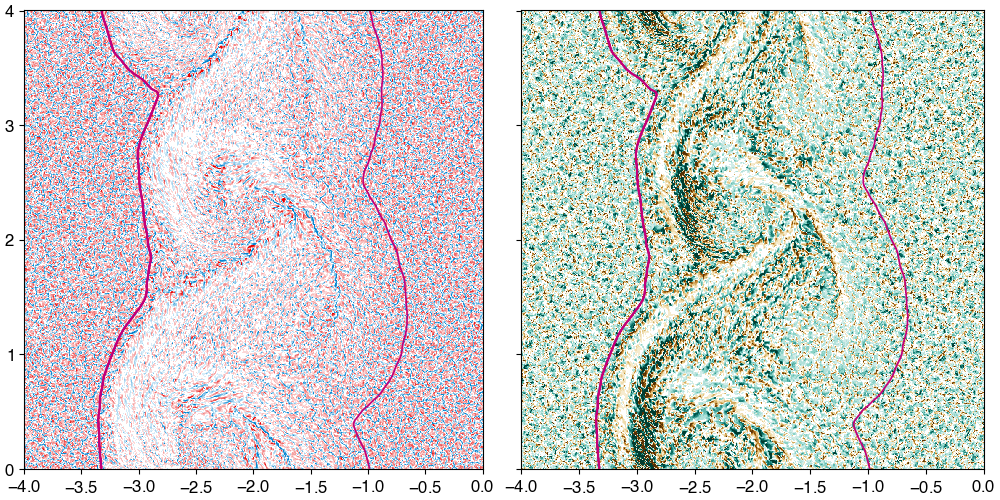

In [13]:
plt.close()
_,ax = plt.subplots(1,2, figsize=(10,5), constrained_layout=True, sharex=True, sharey=True)

itime = 31 -1
depth = 10

pcolor_center((ds3.w - dsl3.w).isel(time=itime).sel(zC=-depth, method='nearest'), ax[0], cmap=plt.get_cmap('w_ds', 20))#, smag=3.6e-3)
pcolor_limits((ds3.c - dsl3.c).isel(time=itime).sel(zC=-depth, method='nearest'), ax[1], cmap=plt.get_cmap('BrBG_r_ds', 20))#, smag=3.6e-3)
ax[0].contour(ds3.xC/1e3, ds3.yC/1e3, dsl3['is_fz'].isel(time=itime), [0.5, 1.5], colors='xkcd:magenta', linewidths=1.2)
ax[1].contour(ds3.xC/1e3, ds3.yC/1e3, dsl3['is_fz'].isel(time=itime), [0.5, 1.5], colors='xkcd:magenta', linewidths=1.2)

ax[0].set_yticks(np.linspace(0,4,5))
ax[0].set_aspect('equal')
plt.xlim(-4, 0);
# plt.xlim(-4, -3.2)
# plt.ylim(2.3, 3.1);

In [14]:
w_bin_edges = np.linspace(-6, 6, 61)
c_bin_edges = np.linspace(-6, 6, 61)
w_binc = (w_bin_edges[:-1] + w_bin_edges[1:])/2
c_binc = (c_bin_edges[:-1] + c_bin_edges[1:])/2
dw = w_bin_edges[1] - w_bin_edges[0]
dc = c_bin_edges[1] - c_bin_edges[0]

wp1 = wp.sel(box1)
cp1 = cp.sel(box1)
count_wc1,_,_ = np.histogram2d(wp1.data.flatten()/wp_std, cp1.data.flatten()/cp_std, bins=(w_bin_edges, c_bin_edges), density=False)
pdf_wc1 = count_wc1 / (dw*dc) / (wp1.xC.size*wp1.yC.size)
ipdf_wc1 = get_pdf_of_icdf(pdf_wc1, dw*dc, icdf=[0.3, 0.6, 0.9, 0.99])

# mask = (dsl['M²'].isel(time=itime).sel(box2).sel(zC=-depth, method='nearest') >= 5e-8).compute()
# mask = (dsl.is_fz.isel(time=itime).sel(box2) == 1).compute()
wp2 = wp.sel(box2)#.where(mask, drop=True)
cp2 = cp.sel(box2)#.where(mask, drop=True)
count_wc2,_,_ = np.histogram2d(wp2.data.flatten()/wp_std, cp2.data.flatten()/cp_std, bins=(w_bin_edges, c_bin_edges), density=False)
pdf_wc2  = count_wc2 / (dw*dc) / (wp2.xC.size*wp2.yC.size)
#pdf_wc2  = count_wc2 / (dw*dc) / mask.sum().data
ipdf_wc2 = get_pdf_of_icdf(pdf_wc2, dw*dc, icdf=[0.3, 0.6, 0.9, 0.99])

In [15]:
count_w1,_ = np.histogram(wp1.data.flatten()/wp_std, bins=w_bin_edges, density=False)
pdf_w1 = count_w1 / dw / (wp1.xC.size*wp1.yC.size)

count_c1,_ = np.histogram(cp1.data.flatten()/cp_std, bins=c_bin_edges, density=False)
pdf_c1 = count_c1 / dc / (cp1.xC.size*wp1.yC.size)


count_w2,_ = np.histogram(wp2.data.flatten()/wp_std, bins=w_bin_edges, density=False)
pdf_w2 = count_w2 / dw / (cp2.xC.size*wp2.yC.size) #mask.sum().data

count_c2,_ = np.histogram(cp2.data.flatten()/cp_std, bins=c_bin_edges, density=False)
pdf_c2 = count_c2 / dc / (cp2.xC.size*wp2.yC.size) #mask.sum().data

In [16]:
cBinc, wBinc = np.meshgrid(c_binc, w_binc)

pdf_wc1_sum = pdf_wc1.sum().compute()
pp1_Q1 = np.around(pdf_wc1[(cBinc > 0) & (wBinc > 0)].sum() / pdf_wc1_sum, 2).compute().item()
pp1_Q2 = np.around(pdf_wc1[(cBinc < 0) & (wBinc > 0)].sum() / pdf_wc1_sum, 2).compute().item()
pp1_Q3 = np.around(pdf_wc1[(cBinc < 0) & (wBinc < 0)].sum() / pdf_wc1_sum, 2).compute().item()
pp1_Q4 = np.around(pdf_wc1[(cBinc > 0) & (wBinc < 0)].sum() / pdf_wc1_sum, 2).compute().item()
wc1_Q1 = (cp1.where(cp1 > 0) * wp1.where(wp1 > 0)).mean().compute().data.item()
wc1_Q2 = (cp1.where(cp1 < 0) * wp1.where(wp1 > 0)).mean().compute().data.item()
wc1_Q3 = (cp1.where(cp1 < 0) * wp1.where(wp1 < 0)).mean().compute().data.item()
wc1_Q4 = (cp1.where(cp1 > 0) * wp1.where(wp1 < 0)).mean().compute().data.item()
eta1   = np.around((wc1_Q1 + wc1_Q2 + wc1_Q3 + wc1_Q4) / (wc1_Q2 + wc1_Q4), 2)

pdf_wc2_sum = pdf_wc2.sum().compute()
pp2_Q1 = np.around(pdf_wc2[(cBinc > 0) & (wBinc > 0)].sum() / pdf_wc2_sum, 2).compute().item()
pp2_Q2 = np.around(pdf_wc2[(cBinc < 0) & (wBinc > 0)].sum() / pdf_wc2_sum, 2).compute().item()
pp2_Q3 = np.around(pdf_wc2[(cBinc < 0) & (wBinc < 0)].sum() / pdf_wc2_sum, 2).compute().item()
pp2_Q4 = np.around(pdf_wc2[(cBinc > 0) & (wBinc < 0)].sum() / pdf_wc2_sum, 2).compute().item()
wc2_Q1 = (cp2.where(cp2 > 0) * wp2.where(wp2 > 0)).mean().compute().data.item()
wc2_Q2 = (cp2.where(cp2 < 0) * wp2.where(wp2 > 0)).mean().compute().data.item()
wc2_Q3 = (cp2.where(cp2 < 0) * wp2.where(wp2 < 0)).mean().compute().data.item()
wc2_Q4 = (cp2.where(cp2 > 0) * wp2.where(wp2 < 0)).mean().compute().data.item()
eta2   = np.around((wc2_Q1 + wc2_Q2 + wc2_Q3 + wc2_Q4) / (wc2_Q2 + wc2_Q4), 2)

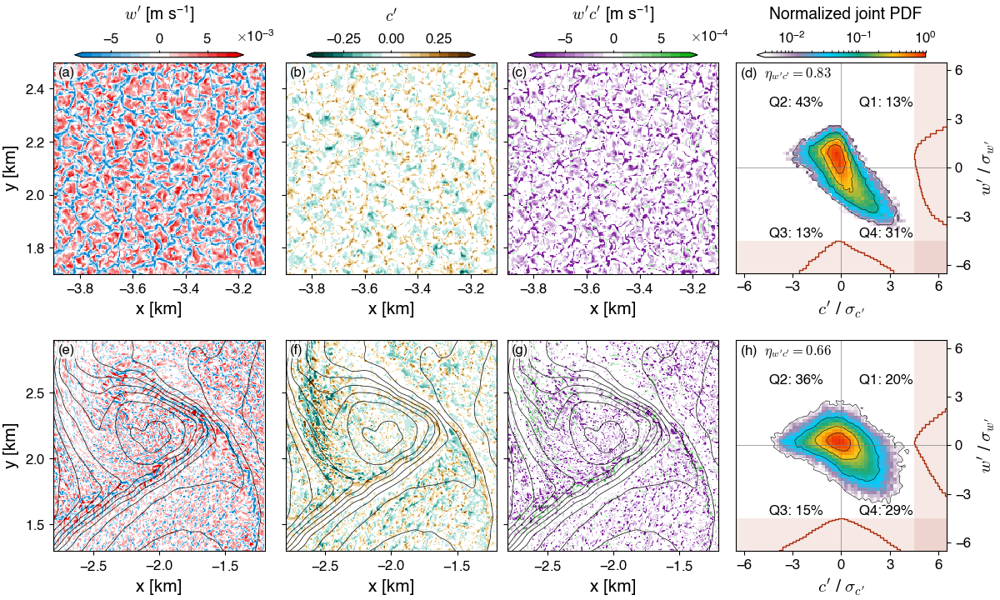

In [19]:
plt.close()
_,ax = plt.subplots(2,4, figsize=(12,7.2), constrained_layout=True)#, height_ratios=[0.9, 4])

pdfax_lim = 6.5
mag1 = 8e-3
mag2 = 0.4
mag3 = 8e-4
eta  = [eta1, eta2]
pQ1  = [pp1_Q1, pp2_Q1]
pQ2  = [pp1_Q2, pp2_Q2]
pQ3  = [pp1_Q3, pp2_Q3]
pQ4  = [pp1_Q4, pp2_Q4]

pcm,_ = pcolor_center(wp1, ax[0,0], cmap=plt.get_cmap('w_ds', 16), smag=mag1)
cbar = config_colorbar(pcm, ax=ax[0,0], sci_notation=True, location='top', shrink=0.8, aspect=35, pad=0.02, nbins=6, extend='both')
cbar.set_label(label=r'$w^{\prime}$ [m s$\mathregular{^{-1}}$]', size=14, labelpad=10)

pcm,_ = pcolor_center(cp1, ax[0,1], cmap=plt.get_cmap('BrBG_r_ds', 16), smag=mag2)
cbar = config_colorbar(pcm, ax=ax[0,1], sci_notation=False, location='top', shrink=0.8, aspect=35, pad=0.02, nbins=6, extend='both')
cbar.set_label(label=r'$c^{\prime}$', size=14, labelpad=10)

pcm,_ = pcolor_center(wp1 * cp1, ax[0,2], cmap=plt.get_cmap('cp_ds', 16), smag=mag3)
cbar = config_colorbar(pcm, ax=ax[0,2], sci_notation=True, location='top', shrink=0.8, aspect=35, pad=0.02, nbins=6, extend='both')
cbar.set_label(label=r'$w^{\prime}c^{\prime}$ [m s$\mathregular{^{-1}}$]', size=14, labelpad=10)

# pcm = ax[0,3].pcolormesh(w_binc/wp1.std().data, c_binc/cp1.std().data, pdf_wc1.T/pdf_wc1.max(), cmap='pdf', norm=mcl.LogNorm(2e-3, 1))
# ax[0,3].contour(w_binc/wp1.std().data, c_binc/cp1.std().data, pdf_wc1.T, levels=ipdf_wc1, colors='k', linewidths=0.4)
pcm = ax[0,3].pcolormesh(c_binc, w_binc, pdf_wc1/pdf_wc1.max(), cmap='pdf', norm=mcl.LogNorm(4e-3, 1))
ax[0,3].contour(c_binc, w_binc, pdf_wc1, levels=ipdf_wc1, colors='k', linewidths=0.4)
cbar = plt.colorbar(pcm, ax=ax[0,3], location='top', shrink=0.8, aspect=35, pad=0.02, extend='min')
cbar.ax.tick_params(labelsize=12, length=2)
cbar.set_label(label='Normalized joint PDF', size=14, labelpad=10)
ax[0,3].plot(c_binc, 2+np.log10(pdf_c1/pdf_c1.max()) - pdfax_lim,  c='xkcd:rust red', ds='steps-mid', lw=1)
ax[0,3].plot(-2-np.log10(pdf_w1/pdf_w1.max()) + pdfax_lim, w_binc, c='xkcd:rust red', ds='steps-mid', lw=1)
# ax[0,3].plot(c_binc, 2*pdf_c1/pdf_c1.max() - pdfax_lim,  c='xkcd:rust red', ds='steps-mid', lw=1)
# ax[0,3].plot(-2*pdf_w1/pdf_w1.max() + pdfax_lim, w_binc, c='xkcd:rust red', ds='steps-mid', lw=1)

pcm,_ = pcolor_center(wp.sel(box2), ax[1,0], cmap=plt.get_cmap('w_ds', 16), smag=mag1)
pcm,_ = pcolor_center(cp.sel(box2), ax[1,1], cmap=plt.get_cmap('BrBG_r_ds', 16), smag=mag2)
pcm,_ = pcolor_center((wp*cp).sel(box2), ax[1,2], cmap=plt.get_cmap('cp_ds', 16), smag=mag3)
# pcm = ax[1,3].pcolormesh(w_binc/wp2.std().data, c_binc/cp2.std().data, pdf_wc2.T/pdf_wc2.max(), cmap='pdf', norm=mcl.LogNorm(2e-3, 1))
# ax[1,3].contour(w_binc/wp2.std().data, c_binc/cp2.std().data, pdf_wc2.T, levels=ipdf_wc2, colors='k', linewidths=0.4)
cm = ax[1,3].pcolormesh(c_binc, w_binc, pdf_wc2/pdf_wc2.max(), cmap='pdf', norm=mcl.LogNorm(4e-3, 1))
ax[1,3].contour(c_binc, w_binc, pdf_wc2, levels=ipdf_wc2, colors='k', linewidths=0.4)
# ax[1,3].set_title('Sharp front only')
ax[1,3].plot(c_binc, 2+np.log10(pdf_c2/pdf_c2.max()) - pdfax_lim,  c='xkcd:rust red', ds='steps-mid', lw=1)
ax[1,3].plot(-2-np.log10(pdf_w2/pdf_w2.max()) + pdfax_lim, w_binc, c='xkcd:rust red', ds='steps-mid', lw=1)
# ax[1,3].plot(c_binc, 2*pdf_c2/pdf_c2.max() - pdfax_lim,  c='xkcd:rust red', ds='steps-mid', lw=1)
# ax[1,3].plot(-2*pdf_w2/pdf_w2.max() + pdfax_lim, w_binc, c='xkcd:rust red', ds='steps-mid', lw=1)

txt_str = 'dh'
count = 0
for i in range(2):
    ax[i,3].axvline(0, c='gray', lw=0.5)
    ax[i,3].axhline(0, c='gray', lw=0.5)
    ax[i,3].ticklabel_format(axis='x', style='sci', scilimits=(0, 0))
    ax[i,3].set_ylabel(r'$w^{\prime}$ / $\sigma_{w^{\prime}}$', fontsize=15)
    ax[i,3].set_xlabel(r'$c^{\prime}$ / $\sigma_{c^{\prime}}$', fontsize=15)
    ax[i,3].set_aspect('equal')
    ax[i,3].yaxis.tick_right()
    ax[i,3].yaxis.set_label_position('right')
    ax[i,3].text(0.02, 0.98, f'({txt_str[count]})' + r'  $\eta_{w^{\prime} c^{\prime}} = $' + rf'${{{eta[i]:.2f}}}$',
                 fontsize=12, ha='left', va='top', transform=ax[i,3].transAxes)
    ax[i,3].text(0.84, 0.84, f'Q1: {pQ1[i]:.0%}', fontsize=12, ha='right', va='top',    transform=ax[i,3].transAxes)
    ax[i,3].text(0.16, 0.84, f'Q2: {pQ2[i]:.0%}', fontsize=12, ha='left',  va='top',    transform=ax[i,3].transAxes)
    ax[i,3].text(0.16, 0.16, f'Q3: {pQ3[i]:.0%}', fontsize=12, ha='left',  va='bottom', transform=ax[i,3].transAxes)
    ax[i,3].text(0.84, 0.16, f'Q4: {pQ4[i]:.0%}', fontsize=12, ha='right', va='bottom', transform=ax[i,3].transAxes)
    ax[i,3].axvspan(pdfax_lim-2, pdfax_lim,   color='xkcd:rust red', alpha=0.1, ec=None)
    ax[i,3].axhspan(-pdfax_lim, -pdfax_lim+2, color='xkcd:rust red', alpha=0.1, ec=None)
    ax[i,3].set_xlim(-pdfax_lim, pdfax_lim)
    ax[i,3].set_ylim(-pdfax_lim, pdfax_lim)
    ax[i,3].set_xticks(np.linspace(-6,6,5))
    ax[i,3].set_yticks(np.linspace(-6,6,5))
    count += 1

txt_str = 'abcefg'
count = 0
for i in range(2):
    for j in range(3):
        if i >= 1:
            # ax[i,j].contour(dsl.xC/1e3, dsl.yC/1e3, dsl['is_fz'].isel(time=itime), [0.5, 1.5], colors='xkcd:magenta', linewidths=1.2)
            # ax[i,j].contour(mask.xC/1e3, mask.yC/1e3, mask, [0.5], colors='k', linewidths=1.2)
            ax[i,j].contour(dsl.xC/1e3, dsl.yC/1e3, dsl.b.isel(time=itime).sel(zC=-depth, method='nearest'),
                            levels=blines_upper, colors='k', linewidths=0.5)
            ax[i,j].set_xlim(-2.8, -1.2)
            ax[i,j].set_ylim(1.3, 2.9)
            ax[i,j].locator_params(axis='y', nbins=4)#set_yticks([2.3, 2.6, 2.9, 3.2])
        else:
            ax[i,j].locator_params(axis='y', nbins=5)#.set_yticks([2.2, 2.4, 2.6])
        if j >= 1:
            ax[i,j].set_yticklabels([])
        ax[i,j].text(0.02, 0.98, f'({txt_str[count]})', fontsize=12, ha='left', va='top', transform=ax[i,j].transAxes,
                     bbox=dict(facecolor='w', edgecolor='none', alpha=0.8, boxstyle='round,pad=0.15'))
        ax[i,j].set_aspect('equal')
        ax[i,j].set_xlabel('x [km]', fontsize=15)
        count += 1
ax[0,0].set_ylabel('y [km]', fontsize=15)
ax[1,0].set_ylabel('y [km]', fontsize=15);

plt.savefig(f'../Figures/{cname3}_finescale_jpdf.png', dpi=300);

### Vertically integrated fine-scale kinetic energy budget terms

In [ ]:
mask_nf = np.abs(dsf.xC) >= 3600
tmp_nf = dsf.Ifske.where(mask_nf).mean(['xC', 'yC'])
tmp = dsf.Ifske.where(dsl.is_fz == 1).mean(['xC', 'yC'])

In [ ]:
plt.close()
_,ax = plt.subplots(1,4, figsize=(12, 5.2), constrained_layout=True, sharex=True, sharey=True)

dsf = dsf1.copy()
dsl = dsl1.copy()
itime = 31 - 1

mag0 = 2.75e-3
mag1 = 2.25e-7
# mTb = dsl['Tb'].isel(time=itime).mean('zC').compute()

pcm0,_ = pcolor_limits(dsf.Ifske.isel(time=itime), ax[0], cmap=plt.get_cmap('Blues',11), clim=[0, mag0])
# pcm0,_ = pcolor_limits(dsf.Iww.isel(time=itime), ax[0], cmap=plt.get_cmap('cmo.tempo',10))#, clim=[0, 1e-3])
# pcm0,_ = pcolor_limits(dsf.Ieps.isel(time=itime), ax[0], cmap=plt.get_cmap('Greys',16), clim=[0, 2e-7])
# pcm0,_ = pcolor_center(dsl['MlOW'].isel(time=itime)/ds.f**2, ax[0], cmap=plt.get_cmap('RdBu_r_ds',20), cupr=2)
# pcm0,_ = pcolor_center(dsl.Tb.isel(time=itime).max('zC'), ax[0], cmap=plt.get_cmap('RdBu_r_ds',18))#, clim=[0, 1e-3])
pcm1,_ = pcolor_center(dsf.IHSP.isel(time=itime), ax[1], cmap=plt.get_cmap('RdBu_r_ds',18), smag=mag1)
pcm2,_ = pcolor_center(dsf.IVSP.isel(time=itime), ax[2], cmap=plt.get_cmap('RdBu_r_ds',18), smag=mag1)
pcm3,_ = pcolor_center(dsf.IVBP.isel(time=itime), ax[3], cmap=plt.get_cmap('RdBu_r_ds',18), smag=mag1)

cbar = config_colorbar(pcm0, ax=ax[0], sci_notation=True, location='top', shrink=0.8, aspect=35, pad=0.02, nbins=6)
cbar.set_label(label=r'Finescale KE [m$\mathregular{^3}$ s$\mathregular{^{-2}}$]', size=14, labelpad=12)

cbar = config_colorbar(pcm1, ax=ax[1], sci_notation=True, location='top', shrink=0.8, aspect=35, pad=0.02, nbins=6, extend='both')
cbar.set_label(label=r'Horizontal shear production [m$\mathregular{^3}$ s$\mathregular{^{-3}}$]', size=14, labelpad=12)

cbar = config_colorbar(pcm2, ax=ax[2], sci_notation=True, location='top', shrink=0.8, aspect=35, pad=0.02, nbins=6, extend='both')
cbar.set_label(label=r'Vertical shear production [m$\mathregular{^3}$ s$\mathregular{^{-3}}$]', size=14, labelpad=12)

cbar = config_colorbar(pcm3, ax=ax[3], sci_notation=True, location='top', shrink=0.8, aspect=35, pad=0.02, nbins=6, extend='both')
cbar.set_label(label=r'Buoyancy production [m$\mathregular{^3}$ s$\mathregular{^{-3}}$]', size=14, labelpad=12)

txt_str = 'abcd'
lgd_str = [r'$\int\,\,\mathcal{E}^{\,\prime} \,dz$', r'$\int\,\,\Pi_h \,dz$', r'$\int\,\,\Pi_v \,dz$', r'$\int\,\,\mathcal{B}^{\,\prime}_v \,dz$']

# Ifske_conv = dsf['Ifske'].isel(time=itime,xC=slice(None,100)).mean().data
# 2.5*Ifske_conv
for j in range(4):
    ax[j].text(0.02, 0.98, f'({txt_str[j]})', fontsize=14, ha='left',  va='top', transform=ax[j].transAxes)
    ax[j].contour(dsl.xC/1e3, dsl.yC/1e3, dsl.b.isel(time=itime).isel(zC=-1), blines_upper, colors='k', linewidths=0.3)
    ax[j].text(0.98, 0.98, lgd_str[j], ha='right', va='top', transform=ax[j].transAxes, fontsize=14,
               bbox=dict(facecolor='w', edgecolor='none', alpha=0.8, boxstyle='round,pad=0.15'))
    # ax[j].contour(dsl.xC/1e3, dsl.yC/1e3, dsl['MmM²'].isel(time=itime)/dsl.attrs['M²'], [2], colors='C4', linewidths=1)
    # ax[j].contour(dsl.xC/1e3, dsl.yC/1e3, dsl['M²'].isel(time=itime).sel(zC=slice(-60, 0)).max('zC'), [10.9e-8], colors='xkcd:purple', linewidths=1)
    # ax[j].contour(dsl.xC/1e3, dsl.yC/1e3, dsl['M²'].isel(time=itime).max('zC'), [2e-7], colors='xkcd:purple', linewidths=1)
    ax[j].contour(dsl.xC/1e3, dsl.yC/1e3, dsf['Ifske'].isel(time=itime), [5e-4], colors='xkcd:purple', linewidths=1)
    # ax[j].contour(dsl.xC/1e3, dsl.yC/1e3, dsf['Ifske'].isel(time=itime), [13e-4], colors='xkcd:purple', linewidths=1)
    # ax[j].contour(dsl.xC/1e3, dsl.yC/1e3, mTb, [5e-20], colors='xkcd:purple', linewidths=1)
    # ax[j].contour(dsl.xC/1e3, dsl.yC/1e3, dsl['σ'].isel(time=itime,zC=-1)/dsl.f, [1], colors='C5', linewidths=1)
    # ax[j].contour(dsl.xC/1e3, dsl.yC/1e3, dsl['Mmσ'].isel(time=itime)/dsl.f, [2], colors='C4', linewidths=1)
    # ax[j].contour(dsl.xC/1e3, dsl.yC/1e3, dsl['Mmδ'].isel(time=itime)/ds.f, [2], colors='C1', linewidths=1)
    # ax[j].contour(dsl.xC/1e3, dsl.yC/1e3, dsl['Mlζ'].isel(time=itime)/ds.f, [0.1], colors='C4', linewidths=1)
    ax[j].set_aspect('equal')
    ax[j].set_xlabel(r'x [km]', fontsize=14)
ax[0].set_yticks(np.linspace(0,4,5))
ax[0].set_xticks(np.linspace(-4,4,9))
ax[0].set_xlim(-3.52, -0.72)
# ax[0].set_xlim(0.72, 3.52)
ax[0].set_ylabel(r'y [km]', fontsize=14);

In [13]:
dsf = dsf1.copy()
dsl = dsl1.copy()
itime = 31 - 1

ww_mld = interp_to_zi(dsl.ww.isel(time=itime), -dsf.mld.isel(time=itime)).compute()
meanTb = dsl.Tb.isel(time=itime).sel(zC=slice(-10,0)).mean('zC').compute()

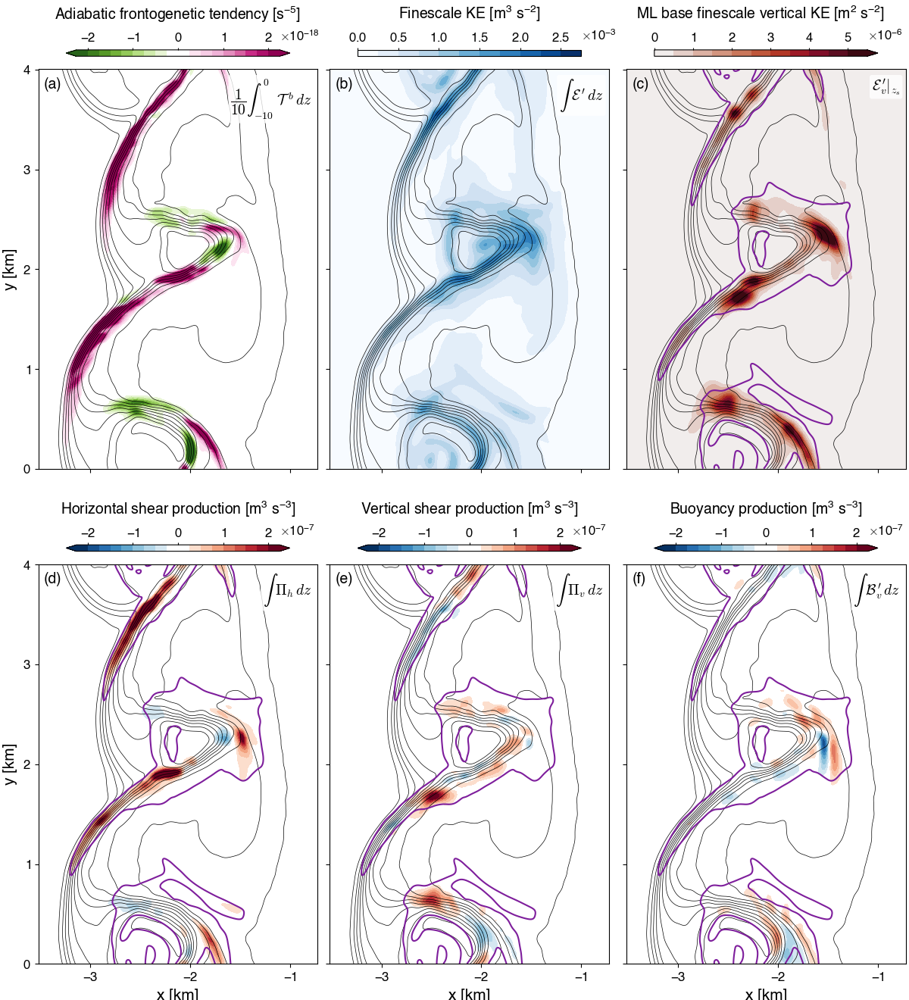

In [14]:
plt.close()
_,ax = plt.subplots(2,3, figsize=(12, 13.2), constrained_layout=True, sharex=True, sharey=True)

mag0 = 2.75e-3
mag1 = 2.25e-7

pcm0,_ = pcolor_center(meanTb,   ax[0,0], cmap=plt.get_cmap('PiYG_r_ds',18), smag=2.25e-18)
pcm1,_ = pcolor_limits(dsf.Ifske.isel(time=itime), ax[0,1], cmap=plt.get_cmap('Blues',11), clim=[0, mag0])
pcm2,_ = pcolor_limits(ww_mld/2, ax[0,2], cmap=plt.get_cmap('cmo.amp',11),   clim=[0, 5.5e-6])
pcm3,_ = pcolor_center(dsf.IHSP.isel(time=itime),  ax[1,0], cmap=plt.get_cmap('RdBu_r_ds',18), smag=mag1)
pcm4,_ = pcolor_center(dsf.IVSP.isel(time=itime),  ax[1,1], cmap=plt.get_cmap('RdBu_r_ds',18), smag=mag1)
pcm5,_ = pcolor_center(dsf.IVBP.isel(time=itime),  ax[1,2], cmap=plt.get_cmap('RdBu_r_ds',18), smag=mag1)

cbar = config_colorbar(pcm0, ax=ax[0,0], sci_notation=True,  location='top', shrink=0.8, aspect=35, pad=0.02, nbins=6, extend='both')
cbar.set_label(label=r'Adiabatic frontogenetic tendency [s$\mathregular{^{-5}}$]', size=14, labelpad=12)

cbar = config_colorbar(pcm1, ax=ax[0,1], sci_notation=True, location='top', shrink=0.8, aspect=35, pad=0.02, nbins=6)
cbar.set_label(label=r'Finescale KE [m$\mathregular{^3}$ s$\mathregular{^{-2}}$]', size=14, labelpad=12)

cbar = config_colorbar(pcm2, ax=ax[0,2], sci_notation=True,  location='top', shrink=0.8, aspect=35, pad=0.02, nbins=6, extend='max')
cbar.set_label(label=r'ML base finescale vertical KE [m$\mathregular{^2}$ s$\mathregular{^{-2}}$]', size=14, labelpad=12)

cbar = config_colorbar(pcm3, ax=ax[1,0], sci_notation=True, location='top', shrink=0.8, aspect=35, pad=0.02, nbins=6, extend='both')
cbar.set_label(label=r'Horizontal shear production [m$\mathregular{^3}$ s$\mathregular{^{-3}}$]', size=14, labelpad=12)

cbar = config_colorbar(pcm4, ax=ax[1,1], sci_notation=True, location='top', shrink=0.8, aspect=35, pad=0.02, nbins=6, extend='both')
cbar.set_label(label=r'Vertical shear production [m$\mathregular{^3}$ s$\mathregular{^{-3}}$]', size=14, labelpad=12)

cbar = config_colorbar(pcm5, ax=ax[1,2], sci_notation=True, location='top', shrink=0.8, aspect=35, pad=0.02, nbins=6, extend='both')
cbar.set_label(label=r'Buoyancy production [m$\mathregular{^3}$ s$\mathregular{^{-3}}$]', size=14, labelpad=12)

txt_str = 'abcdef'
lgd_str = [r'$\dfrac{1}{10} \int_{-10}^0 \,\, \mathcal{T}^{\,\,b} \,dz$',
           r'$\int\,\,\mathcal{E}^{\,\prime} \,dz$',
           r'$\mathcal{E}^{\,\prime}_v|_{z_s}$',
           r'$\int\,\,\Pi_h \,dz$', r'$\int\,\,\Pi_v \,dz$',
           r'$\int\,\,\mathcal{B}^{\,\prime}_v \,dz$']
count = 0
for i in range(2):
    ax[i,0].set_ylabel('y [km]', fontsize=15)
    for j in range(3):
        ax[i,j].set_aspect('equal')
        ax[i,j].text(0.02, 0.98, f'({txt_str[count]})', fontsize=14, ha='left',  va='top', transform=ax[i,j].transAxes)
        ax[i,j].contour(dsl.xC/1e3, dsl.yC/1e3, dsl.b.isel(time=itime).isel(zC=-1), blines_upper, colors='k', linewidths=0.5)
        ax[i,j].text(0.98, 0.98, lgd_str[count], ha='right', va='top', transform=ax[i,j].transAxes, fontsize=14,
                   bbox=dict(facecolor='w', edgecolor='none', alpha=0.8, boxstyle='round,pad=0.15'))
        if count > 1:
            ax[i,j].contour(dsl.xC/1e3, dsl.yC/1e3, dsf['Ifske'].isel(time=itime), [5e-4], colors='xkcd:purple', linewidths=1.5)
        if i == 1:
            ax[i,j].set_xlabel('x [km]', fontsize=15)
        count += 1
ax[0,0].set_yticks(np.linspace(0,4,5))
ax[0,0].set_xticks(np.linspace(-4,4,9))
ax[0,0].set_xlim(-3.52, -0.72);

plt.savefig(f'../Figures/{cname1}_fske_budget_map.png', dpi=300);

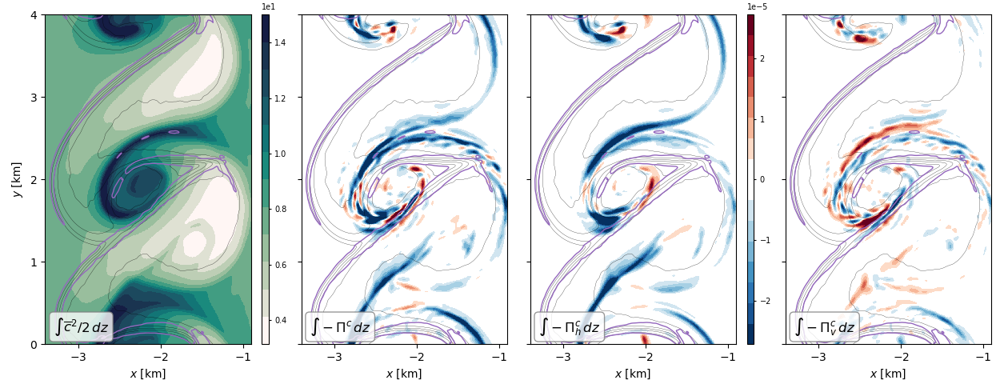

In [126]:
plt.close()
_,ax = plt.subplots(1,4, figsize=(12.5, 4.8), constrained_layout=True, sharex=True, sharey=True)

dsf = dsf1.copy()
dsl = dsl1.copy()
itime = 48 - 1
depth = 0

pcm0,_ = pcolor_limits( dsf.Issnn.isel(time=itime),  ax[0], cmap=plt.get_cmap('cmo.tempo',12))
_,mag1 = pcolor_center(-dsf.InnSP.isel(time=itime),  ax[1], cmap=plt.get_cmap('RdBu_r_ds',16))
pcm2,_ = pcolor_center(-dsf.InnHSP.isel(time=itime), ax[2], cmap=plt.get_cmap('RdBu_r_ds',16), smag=mag1)
_,_    = pcolor_center(-dsf.InnVSP.isel(time=itime), ax[3], cmap=plt.get_cmap('RdBu_r_ds',16), smag=mag1)

config_colorbar(pcm0, ax[0])
config_colorbar(pcm2, ax[2])

txt_strs = [r"$\int\overline{c}^2/2 \,dz$", r"$\int-\Pi^c \,dz$", r'$\int-\Pi^c_h \,dz$', r"$\int-\Pi^c_v \,dz$",]

# Ifske_conv = dsf['Ifske'].isel(time=itime,xC=slice(None,100)).mean().data
for j in range(4):
    # ax[j].contour(dsl.xC/1e3, dsl.yC/1e3, dsl.b.isel(time=itime).where(dsl.zC >= -60).mean('zC'), blines_upper, colors='k', linewidths=0.4)
    ax[j].contour(dsl.xC/1e3, dsl.yC/1e3, dsl.b.isel(time=itime).sel(zC=-depth, method='nearest'), blines_upper, colors='k', linewidths=0.2)
    ax[j].text(0.04, 0.02, txt_strs[j], ha='left', va='bottom', transform=ax[j].transAxes, fontsize=12, fontweight='bold',
           bbox=dict(facecolor='w', edgecolor='gray', alpha=0.8, boxstyle='round,pad=0.3'))
    # ax[j].contour(dsl.xC/1e3, dsl.yC/1e3, dsl['MmM²'].isel(time=itime)/dsl.attrs['M²'], [2], colors='C4', linewidths=1)
    # ax[j].contour(dsl.xC/1e3, dsl.yC/1e3, dsf['Ifske'].isel(time=itime), [2.5*Ifske_conv], colors='C4', linewidths=1)
    ax[j].contour(dsl.xC/1e3, dsl.yC/1e3, dsl['Mmσ'].isel(time=itime)/dsl.f, [2], colors='C4', linewidths=1)
    # ax[j].contour(dsl.xC/1e3, dsl.yC/1e3, dsl['Mmδ'].isel(time=itime)/ds.f, [2], colors='C1', linewidths=1)
    # ax[j].contour(dsl.xC/1e3, dsl.yC/1e3, dsl['Mlζ'].isel(time=itime)/ds.f, [0.1], colors='C4', linewidths=1)
    ax[j].set_aspect('equal')
    ax[j].set_xlabel(r'$x$ [km]')
ax[0].set_yticks(np.linspace(0,4,5))
ax[0].set_xticks(np.linspace(-4,4,9))
ax[0].set_xlim(-3.4, -0.9)
# ax[0].set_xlim(1, 3)
ax[0].set_ylabel(r'$y$ [km]');

In [ ]:
plt.close()
plt.figure(figsize=(2.9,4), constrained_layout=True)

dsl = dsl1.copy()
mask = (dsl['Mmσ']/dsl.f >= 2).compute()
itime = 48 - 1

plt.plot(dsl.fsken.where(mask).isel(time=itime).mean(['xC', 'yC']), dsl.zC)
plt.plot(dsl.fsken.where(np.abs(dsl.xC) >= 3600).isel(time=itime).mean(['xC', 'yC']), dsl.zC)
plt.xlim(0, 0.21)
plt.ylim(-75, 0)
# plt.xlabel(r"$2\mathcal{E}_v\,' / w_{*}^2$");
plt.xlabel(r"$2\mathcal{E}\,' / w_{*}^2$");

In [ ]:
plt.close()
_,ax = plt.subplots(1,2, figsize=(7, 5), constrained_layout=True, sharex=True, sharey=True)

itime = 36 - 1

pcm0,_ = pcolor_center(dsf.IVBP.isel(time=itime), ax[0], cmap=plt.get_cmap('RdBu_r_ds',20))
pcm1,_ = pcolor_center(dsf.Iw_b.isel(time=itime), ax[1], cmap=plt.get_cmap('RdBu_r_ds',20))
config_colorbar(pcm0, ax[0])
config_colorbar(pcm1, ax[1])

depth = 8
txt_strs = [r"$\mathcal{B}\,'$", r"$\overline{\mathcal{B}}$"]
for j in range(2):
    # ax[j].contour(dsl.xC/1e3, dsl.yC/1e3, dsl.b.isel(time=itime).where(dsl.zC >= -60).mean('zC'), blines_upper, colors='k', linewidths=0.4)
    # ax[j].contour(dsl.xC/1e3, dsl.yC/1e3, dsl.b.isel(time=itime).sel(zC=-depth, method='nearest'), blines_upper, colors='k', linewidths=0.4)
    ax[j].contour(dsl.xC/1e3, dsl.yC/1e3, dsl.b.isel(time=itime, zC=-1), blines_upper, colors='k', linewidths=0.4)
    ax[j].text(0.04, 0.02, txt_strs[j], ha='left', va='bottom', transform=ax[j].transAxes, fontsize=12, fontweight='bold',
           bbox=dict(facecolor='w', edgecolor='gray', alpha=0.8, boxstyle='round,pad=0.3'))
    ax[j].set_aspect('equal')
    ax[j].set_xlabel(r'$x$ [km]')
ax[0].set_yticks(np.linspace(0,4,5))
ax[0].set_xticks(np.linspace(-4,4,9))
ax[0].set_xlim(-3.4, -1)
# ax[0].set_xlim(1, 3)
ax[0].set_ylabel(r'$y$ [km]');

#### Time series of vertically integrated budget terms

In [13]:
dsf = dsf1.copy()
dsl = dsl1.copy()

# mask = dsl['MmM²']/dsl.attrs['M²'] >= 1
# mask = dsf['Ifske']/dsf['Ifske'].isel(xC=slice(None,100)).mean(['xC', 'yC']) >= 2.5
mask = dsf['Ifske'] > 5e-4
# mask = (dsl['Mmσ']/dsl.f >= 2).compute()# | (dsl['Mmδ']/ds.f >= 2)).compute()
mask_nf = np.abs(dsf.xC )>= 3600
hsp     = dsf['IHSP'].where(mask).mean(['xC', 'yC'])
hsp_div = dsf['IHSP_δ'].where(mask).mean(['xC', 'yC'])
hsp_str = dsf['IHSP_σ'].where(mask).mean(['xC', 'yC'])
vsp     = dsf['IVSP'].where(mask).mean(['xC', 'yC'])
vbp     = dsf['IVBP'].where(mask).mean(['xC', 'yC'])
vbp_nf  = dsf['IVBP'].where(mask_nf).mean(['xC', 'yC'])
vbp_conv = (0.4*dsf.bld.where(mask)*dsl.attrs['B₀']).mean(['xC', 'yC'])
# eps     = dsf['Ieps'].where(mask).mean(['xC', 'yC'])

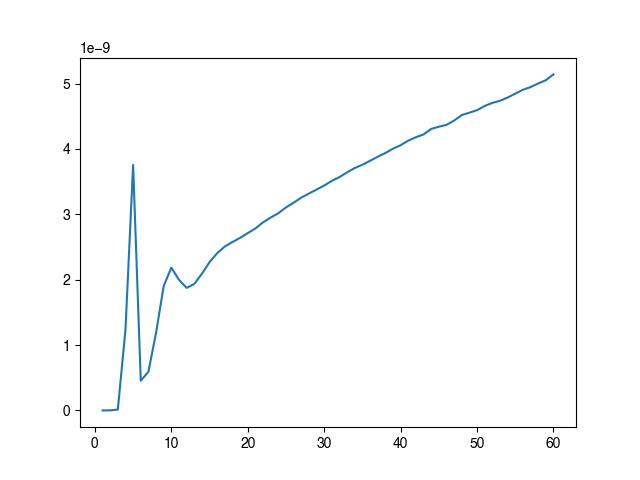

In [40]:
plt.close()
plt.figure()
plt.plot(dsf.hour, vbp_nf)

In [ ]:
plt.close()
plt.figure(figsize=(6,4), constrained_layout=True)

plt.plot(dsf.hour, hsp/vbp_nf[-1], c='xkcd:bluish')
plt.plot(dsf.hour, hsp_div/vbp_nf[-1], c='xkcd:bluish', ls='--')
plt.plot(dsf.hour, hsp_str/vbp_nf[-1], c='xkcd:bluish', ls=':')
plt.plot(dsf.hour, vsp/vbp_nf[-1], c='C2')
plt.plot(dsf.hour, vbp/vbp_nf[-1], c='C1')
# plt.plot(dsf.hour, vbp_conv, c='C1', ls='--')
# plt.plot(dsf.hour, -eps, c='gray')
plt.axhline(0, ls='-', c='k', lw=0.5)
plt.legend([r'$\langle \int\,\,\Pi_{h} \,dz \rangle$',
            r'$\langle \int\,\,\Pi_{h,\text{-}\delta} \,dz\rangle$', r'$\langle \int\,\,\Pi_{h,\sigma} \,dz \rangle$',
            r'$\langle \int\,\,\Pi_v \,dz\rangle$', r'$\langle \int\,\,\mathcal{B}^{\,\prime}_v \,dz \rangle$',
            # r'$\langle {\int 0.5 \mathcal{B}_0 h \,dz \rangle$',
            # r"$\langle \int\,\, -\mathcal{D}\,' \,dz \rangle$",
           ],
           ncols=3, loc='lower left', fontsize=10, handlelength=2, borderaxespad=0, frameon=False)

plt.xlim(0, )
# plt.ylim(-12e-9, 34e-9)
# plt.ylim(-6e-8, 6e-8)
# plt.grid(c='gray', ls='--', lw=0.3)
plt.ticklabel_format(axis='y', useMathText=True)
plt.ylabel(r'Mean finescale KE budget terms', fontsize=12)
plt.xlabel('Hours', fontsize=12);

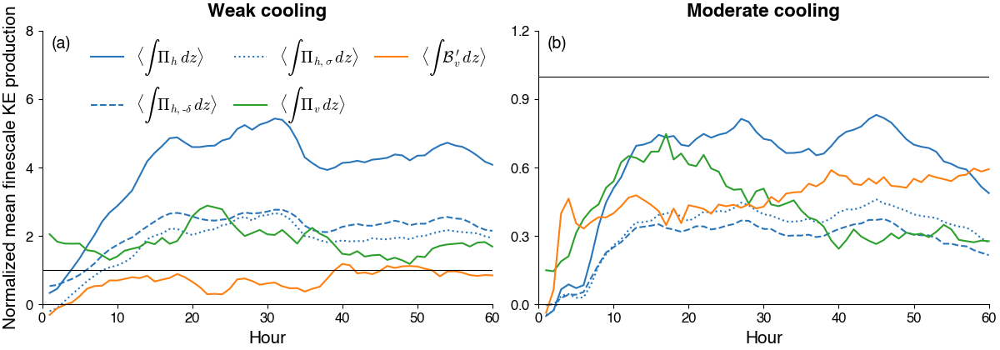

In [14]:
plt.close()
_,ax = plt.subplots(1,2, figsize=(12,4.2), constrained_layout=True, sharex=True)

dsf = [dsf1, dsf3]
dsl = [dsl1, dsl3]
Ifske_threshold = [5e-4, 13e-4]

for j in range(2):
    mask    = dsf[j]['Ifske'] > Ifske_threshold[j]
    mask_nf = np.abs(dsf[j].xC) >= 3600
    hsp     = dsf[j]['IHSP'].where(mask).mean(['xC', 'yC'])
    hsp_div = dsf[j]['IHSP_δ'].where(mask).mean(['xC', 'yC'])
    hsp_str = dsf[j]['IHSP_σ'].where(mask).mean(['xC', 'yC'])
    vsp     = dsf[j]['IVSP'].where(mask).mean(['xC', 'yC'])
    vbp     = dsf[j]['IVBP'].where(mask).mean(['xC', 'yC'])
    vbp_nf  = dsf[j]['IVBP'].where(mask_nf).isel(time=-1).mean(['xC', 'yC']).compute()

    ax[j].plot(dsf[j].hour, hsp/vbp_nf,     c='xkcd:bluish', clip_on=False, zorder=1)
    ax[j].plot(dsf[j].hour, hsp_div/vbp_nf, c='xkcd:bluish', ls='--', clip_on=False, zorder=1)
    ax[j].plot(dsf[j].hour, hsp_str/vbp_nf, c='xkcd:bluish', ls=':',  clip_on=False, zorder=1)
    ax[j].plot(dsf[j].hour, vsp/vbp_nf,     c='C2', clip_on=False, zorder=1)
    ax[j].plot(dsf[j].hour, vbp/vbp_nf,     c='C1', clip_on=False, zorder=1)
    ax[j].axhline(1, ls='-', c='k', lw=0.8)
    ax[j].set_xlabel('Hour', fontsize=15)

    ax[j].tick_params(axis='both', which='major', labelsize=12, length=3.5)
    ax[j].ticklabel_format(axis='y', useMathText=True)
    ax[j].spines['top'].set_visible(False)
    ax[j].spines['right'].set_visible(False)
    ax[j].spines['left'].set_linewidth(0.8)
    ax[j].spines['bottom'].set_linewidth(0.8)

ax[0].legend([r'$\langle \int\,\,\Pi_{h} \,dz \rangle$',
              r'$\langle \int\,\,\Pi_{h,\text{-}\delta} \,dz\rangle$', r'$\langle \int\,\,\Pi_{h,\sigma} \,dz \rangle$',
              r'$\langle \int\,\,\Pi_v \,dz\rangle$', r'$\langle \int\,\,\mathcal{B}^{\,\prime}_v \,dz \rangle$',
             ],
             ncols=3, fontsize=14, handlelength=2, borderaxespad=0, columnspacing=1, frameon=False,
             loc='upper right', bbox_to_anchor=(1, 1))
ax[0].set_title('Weak cooling',   fontsize=16, pad=12, fontweight='bold')
ax[1].set_title('Moderate cooling', fontsize=16, pad=12, fontweight='bold')
ax[0].text(0.02, 0.98, '(a)', ha='left', va='top', transform=ax[0].transAxes, fontsize=14)
ax[1].text(0.02, 0.98, '(b)', ha='left', va='top', transform=ax[1].transAxes, fontsize=14)

ax[0].set_ylabel(r'Normalized mean finescale KE production', fontsize=15)
ax[0].yaxis.set_major_locator(mtick.MultipleLocator(2))
ax[1].yaxis.set_major_locator(mtick.MultipleLocator(0.3))
ax[0].set_ylim(0, 8)
ax[1].set_ylim(0, 1.2)
plt.xlim(0, 60);

plt.savefig(f'../Figures/fske_budget.png', dpi=300);

In [ ]:
plt.close()
fig,ax = plt.subplots(2,2, figsize=(10,6), constrained_layout=True, sharex=True)

dsf = [dsf0, dsf1, dsf3]
dsl = [dsl0, dsl1, dsl3]
ls_list = [':', '--', '-']

for i in reversed(range(3)):
    # mask = (dsf[i].xC >= -3400) & (dsf[i].xC <= -900).compute()
    # mask = (dsl[i]['Mmσ']/dsl[i].f >= 2).compute()
    mask = (dsf[i].Ifske >= 4e-4).compute()
    ax[0,0].plot(dsf[i].hour, dsf[i].Isske.where(mask).mean(['xC', 'yC']), c='xkcd:rich purple', ls=ls_list[i])
    ax[1,0].plot(dsf[i].hour, dsf[i].Ifske.where(mask).mean(['xC', 'yC']), c='xkcd:deep green', ls=ls_list[i])
    ax[0,1].plot(dsf[i].hour, dsl[i]['Mlσ'].where(mask).mean(['xC', 'yC'])/dsl[i].f, c='xkcd:deep lilac', ls=ls_list[i])
    ax[1,1].plot(dsf[i].hour, dsl[i]['Mpδ'].where(mask).mean(['xC', 'yC'])/dsl[i].f, c='xkcd:red', ls=ls_list[i])
    ax[1,1].plot(dsf[i].hour, dsl[i]['Mnδ'].where(mask).mean(['xC', 'yC'])/dsl[i].f, c='xkcd:bluish', ls=ls_list[i])

for i in range(2):
    for j in range(2):
        ax[i,j].grid(c='gray', ls='--', lw=0.3)
        ax[i,j].ticklabel_format(axis='y', style='sci', scilimits=(0, 0))
ax[1,1].axhline(0, ls='--', c='k', lw=0.8)

plt.xlim(0, 48)
# ax[0,0].set_ylim(-4e-1, 4e-1)
ax[1,1].set_ylim(-3.4e-1, 3.4e-1)
ax[0,0].set_ylabel(r'Submesoscale KE')
ax[1,0].set_ylabel(r'Finescale KE')
ax[0,1].set_ylabel(r'Submesoscale strain / $f$')
ax[1,1].set_ylabel(r'Submesoscale divergence / $f$')
fig.supxlabel('Hours');

### Horizontal slices of vertical fluxes

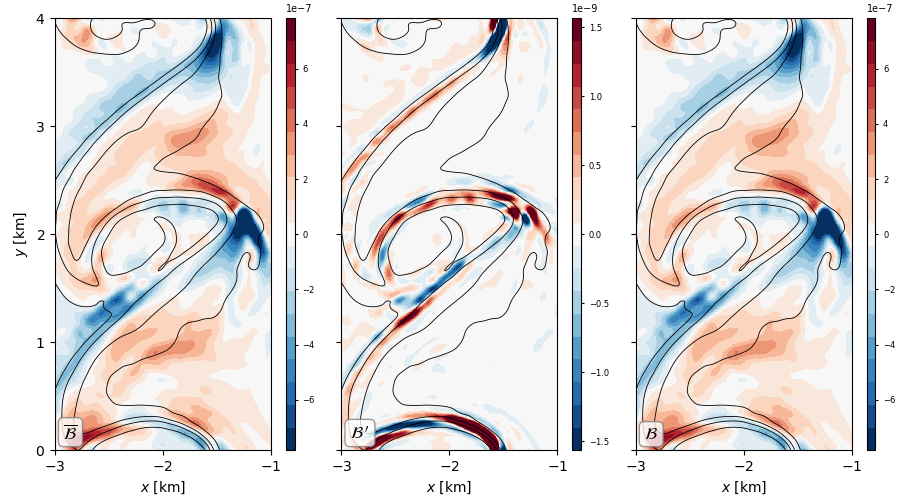

In [35]:
plt.close()
_,ax = plt.subplots(1,3, figsize=(9, 5), constrained_layout=True, sharex=True, sharey=True)

itime = 36
depth = 20

pcm0,mag0 = pcolor_center((dsl.w*dsl.b).isel(time=itime).sel(zC=-depth, method='nearest'), ax[0], cmap=plt.get_cmap('RdBu_r',19), cupr=1.5)
pcm1,_    = pcolor_center(dsl.wb.isel(time=itime).sel(zC=-depth, method='nearest'), ax[1], cmap=plt.get_cmap('RdBu_r',19), smag=mag0/500)
pcm2,_    = pcolor_center(filter_taper.apply((ds.w*ds.b).isel(time=itime).sel(zC=-depth, method='nearest'),  dims=['yC', 'xC']), 
                          ax[2], cmap=plt.get_cmap('RdBu_r',19), smag=mag0)

config_colorbar(pcm0, ax[0])
config_colorbar(pcm1, ax[1])
config_colorbar(pcm2, ax[2])

txt_strs = [r"$\overline{\mathcal{B}}$", r"$\mathcal{B}\,'$", r"$\mathcal{B}$"]
for j in range(3):
    ax[j].contour(dsl.xC/1e3, dsl.yC/1e3, dsl.b.isel(time=itime).sel(zC=-depth, method='nearest'), blines_upper, colors='k', linewidths=0.6)
    ax[j].text(0.04, 0.02, txt_strs[j], ha='left', va='bottom', transform=ax[j].transAxes, fontsize=12, fontweight='bold',
           bbox=dict(facecolor='w', edgecolor='gray', alpha=0.8, boxstyle='round,pad=0.3'))
    ax[j].set_aspect('equal')
    ax[j].set_xlabel(r'$x$ [km]')
ax[0].set_yticks(np.linspace(0,4,5))
ax[0].set_xticks(np.linspace(-4,4,9))
ax[0].set_xlim(-3, -1)
# ax[0].set_xlim(1, 3)
ax[0].set_ylabel(r'$y$ [km]');

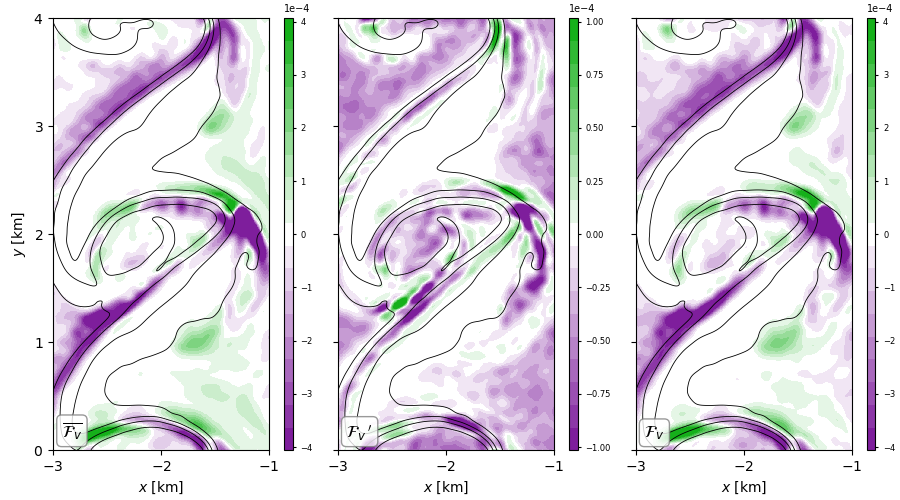

In [36]:
plt.close()
_,ax = plt.subplots(1,3, figsize=(9, 5), constrained_layout=True, sharex=True, sharey=True)

itime = -1
depth = 20

pcm0,mag0 = pcolor_center((dsl.w*dsl.c).isel(time=itime).sel(zC=-depth, method='nearest'), ax[0], cmap=plt.get_cmap('cp',19), cupr=1)
pcm1,_    = pcolor_center(dsl.wc.isel(time=itime).sel(zC=-depth, method='nearest'), ax[1], cmap=plt.get_cmap('cp',19), smag=mag0/4)
pcm2,_    = pcolor_center(filter_taper.apply((ds.w*ds.c).isel(time=itime).sel(zC=-depth, method='nearest'), dims=['yC', 'xC']), 
                          ax[2], cmap=plt.get_cmap('cp',19), smag=mag0)

config_colorbar(pcm0, ax[0])
config_colorbar(pcm1, ax[1])
config_colorbar(pcm2, ax[2])

txt_strs = [r"$\overline{\mathcal{F}_v}$", r"$\mathcal{F}_v\,'$", r"$\mathcal{F}_v$"]
for j in range(3):
    ax[j].contour(dsl.xC/1e3, dsl.yC/1e3, dsl.b.isel(time=itime).sel(zC=-depth, method='nearest'), blines_upper, colors='k', linewidths=0.6)
    ax[j].text(0.04, 0.02, txt_strs[j], ha='left', va='bottom', transform=ax[j].transAxes, fontsize=12, fontweight='bold',
           bbox=dict(facecolor='w', edgecolor='gray', alpha=0.8, boxstyle='round,pad=0.3'))
    ax[j].set_aspect('equal')
    ax[j].set_xlabel(r'$x$ [km]')
ax[0].set_yticks(np.linspace(0,4,5))
ax[0].set_xticks(np.linspace(-4,4,9))
ax[0].set_xlim(-3, -1)
# ax[0].set_xlim(1, 3)
ax[0].set_ylabel(r'$y$ [km]');

### Vertical fluxes decomposed to diapycnal and isopycnal parts

#### 1. Submesoscale flux

In [20]:
use_filtered_ds = True
use_c_gradient  = False

ds_parent = dsl if use_filtered_ds else ds
gtype     = 'c' if use_c_gradient else 'b'
varsg     = ['nG'+gtype+i for i in ['x', 'y', 'z']]
nGx, nGy, nGz = ds_parent[varsg[0]], ds_parent[varsg[1]], ds_parent[varsg[2]]

#### 1a. slicing at constant depth

In [25]:
dsl['SFc_dia'] = dsl.u_c * nGx + dsl.v_c * nGy + dsl.w_c * nGz
dsl['w_c_dia'] = (dsl.SFc_dia * nGz)#.where(dsl.mGb >= 1e-8)
dsl['w_c_iso'] = dsl.w_c - dsl.w_c_dia

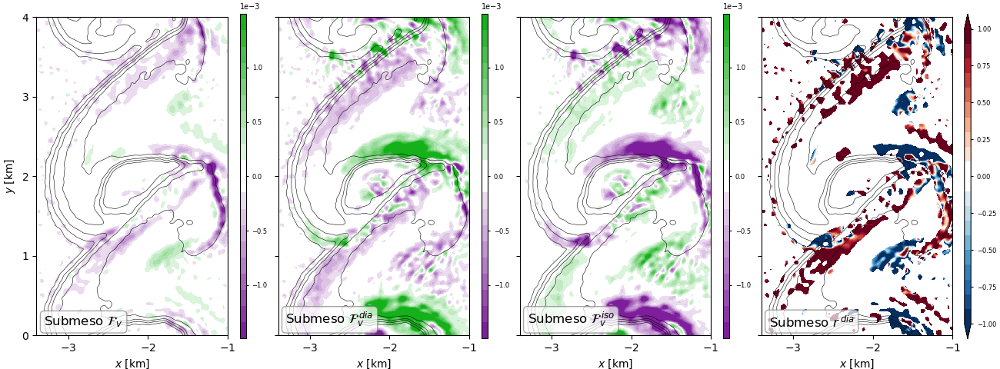

In [26]:
plt.close()
_,ax = plt.subplots(1,4, figsize=(13, 4.8), constrained_layout=True, sharex=True, sharey=True)

itime = 48 - 1
depth = 40

pcm0,mag0 = pcolor_center(dsl.w_c.isel(time=itime).sel(zC=-depth, method='nearest'), ax[0], cmap=plt.get_cmap('cp_ds',20), cupr=2.5)
pcm1,_    = pcolor_center(dsl.w_c_dia.isel(time=itime).sel(zC=-depth, method='nearest'), ax[1], cmap=plt.get_cmap('cp_ds',20), smag=mag0)
pcm2,_    = pcolor_center(dsl.w_c_iso.isel(time=itime).sel(zC=-depth, method='nearest'), ax[2], cmap=plt.get_cmap('cp_ds',20), smag=mag0)
pcm3,_    = pcolor_center((dsl.w_c_dia/dsl.w_c.where(np.abs(dsl.w_c) >= mag0/10)).isel(time=itime).sel(zC=-depth, method='nearest'), 
                          ax[3], cmap=plt.get_cmap('RdBu_r_ds',20), smag=1)

config_colorbar(pcm0, ax[0])
config_colorbar(pcm1, ax[1])
config_colorbar(pcm2, ax[2])
config_colorbar(pcm3, ax[3], extend='both')

txt_strs = [r"Submeso $\mathcal{F}_v$", r"Submeso $\mathcal{F}_v^{\,dia}$", r"Submeso $\mathcal{F}_v^{\,iso}$", r"Submeso $r^{\,dia}$"]
for j in range(4):
    # ax[j].contour(ds_parent.xC/1e3, ds_parent.yC/1e3, ds_parent.b.isel(time=itime).sel(zC=-depth, method='nearest'),
    #               blines_upper, colors='k', linewidths=0.4)
    ax[j].contour(ds_parent.xC/1e3, ds_parent.yC/1e3, ds_parent.b.isel(time=itime, zC=-1),
                  blines_upper, colors='k', linewidths=0.4)
    ax[j].text(0.04, 0.02, txt_strs[j], ha='left', va='bottom', transform=ax[j].transAxes, fontsize=12,# fontweight='bold',
               bbox=dict(facecolor='w', edgecolor='gray', alpha=0.7, boxstyle='round,pad=0.3'))
    ax[j].set_aspect('equal')
    ax[j].set_xlabel(r'$x$ [km]')
ax[0].set_yticks(np.linspace(0,4,5))
ax[0].set_xticks(np.linspace(-4,4,9))
ax[0].set_xlim(-3.4, -1)
# ax[0].set_xlim(1, 3)
ax[0].set_ylabel(r'$y$ [km]');

#### 1b. slicing at mixed layer base

In [21]:
itime = 48 - 1
zi_to_mld = 1

u_c_mld = interp_to_zi((dsl.u_c).isel(time=itime), -dsf.mld.isel(time=itime)*zi_to_mld)
v_c_mld = interp_to_zi((dsl.v_c).isel(time=itime), -dsf.mld.isel(time=itime)*zi_to_mld)
w_c_mld = interp_to_zi((dsl.w_c).isel(time=itime), -dsf.mld.isel(time=itime)*zi_to_mld)

nGx_mld = interp_to_zi(nGx.isel(time=itime), -dsf.mld.isel(time=itime)*zi_to_mld)
nGy_mld = interp_to_zi(nGy.isel(time=itime), -dsf.mld.isel(time=itime)*zi_to_mld)
nGz_mld = interp_to_zi(nGz.isel(time=itime), -dsf.mld.isel(time=itime)*zi_to_mld)

SFc_mld_dia = u_c_mld * nGx_mld + v_c_mld * nGy_mld + w_c_mld * nGz_mld
w_c_mld_dia = SFc_mld_dia * nGz_mld
w_c_mld_iso = w_c_mld - w_c_mld_dia

/glade/work/zhihuaz/conda-envs/trace-seas/lib/python3.12/site-packages/dask/_task_spec.py:759: RuntimeWarning: invalid value encountered in divide
  return self.func(*new_argspec)


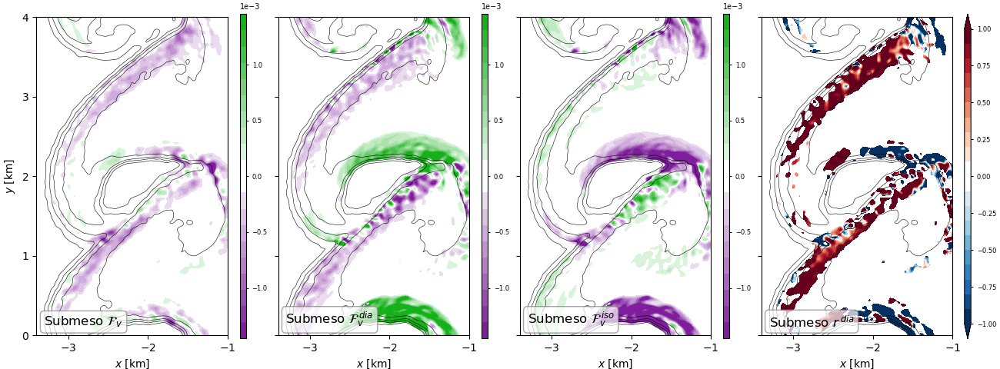

In [22]:
plt.close()
_,ax = plt.subplots(1,4, figsize=(13, 4.8), constrained_layout=True, sharex=True, sharey=True)

pcm0,mag0 = pcolor_center(w_c_mld, ax[0], cmap=plt.get_cmap('cp_ds',20), cupr=2.5)
pcm1,_    = pcolor_center(w_c_mld_dia, ax[1], cmap=plt.get_cmap('cp_ds',20), smag=mag0)
pcm2,_    = pcolor_center(w_c_mld_iso, ax[2], cmap=plt.get_cmap('cp_ds',20), smag=mag0)
pcm3,_    = pcolor_center(w_c_mld_dia/w_c_mld.where(np.abs(w_c_mld) >= mag0/10), 
                          ax[3], cmap=plt.get_cmap('RdBu_r_ds',20), smag=1)

config_colorbar(pcm0, ax[0])
config_colorbar(pcm1, ax[1])
config_colorbar(pcm2, ax[2])
config_colorbar(pcm3, ax[3], extend='both')

txt_strs = [r"Submeso $\mathcal{F}_v$", r"Submeso $\mathcal{F}_v^{\,dia}$", r"Submeso $\mathcal{F}_v^{\,iso}$", r"Submeso $r^{\,dia}$"]
for j in range(4):
    # ax[j].contour(ds_parent.xC/1e3, ds_parent.yC/1e3, ds_parent.b.isel(time=itime).where(dsl.zC >= -60).mean('zC'),
    #               blines_upper, colors='k', linewidths=0.4)
    ax[j].contour(ds_parent.xC/1e3, ds_parent.yC/1e3, ds_parent.b.isel(time=itime, zC=-1),
                  blines_upper, colors='k', linewidths=0.4)
    # ax[j].contour(ds.xC/1e3, ds.yC/1e3, ds.b.isel(time=itime, zC=-1),
    #               blines_upper, colors='k', linewidths=0.4)
    ax[j].text(0.04, 0.02, txt_strs[j], ha='left', va='bottom', transform=ax[j].transAxes, fontsize=12,# fontweight='bold',
               bbox=dict(facecolor='w', edgecolor='gray', alpha=0.7, boxstyle='round,pad=0.3'))
    ax[j].set_aspect('equal')
    ax[j].set_xlabel(r'$x$ [km]')
ax[0].set_yticks(np.linspace(0,4,5))
ax[0].set_xticks(np.linspace(-4,4,9))
ax[0].set_xlim(-3.4, -1)
# ax[0].set_xlim(1, 3)
ax[0].set_ylabel(r'$y$ [km]');

#### 2. Finescale flux

In [15]:
dsf = dsf1.copy()
dsl = dsl1.copy()
ds  = ds1.copy()

use_filtered_ds = True
use_c_gradient  = False

ds_parent = dsl if use_filtered_ds else ds
gtype     = 'c' if use_c_gradient else 'b'
varsg     = ['nG'+gtype+i for i in ['x', 'y', 'z']]
nGx, nGy, nGz = ds_parent[varsg[0]], ds_parent[varsg[1]], ds_parent[varsg[2]]

#### 2a. slicing at constant depth

In [16]:
dsl['FFc_dia'] = dsl.uc * nGx + dsl.vc * nGy + dsl.wc * nGz
dsl['wc_dia']  = (dsl.FFc_dia * nGz)#.where(dsl.mGb >= 1e-8)
dsl['wc_iso']  = dsl.wc - dsl.wc_dia

/glade/work/zhihuaz/conda-envs/trace-seas/lib/python3.12/site-packages/dask/_task_spec.py:759: RuntimeWarning: invalid value encountered in divide
  return self.func(*new_argspec)
2026-03-20 07:40:08,679 - distributed.worker.memory - WARNING - Worker is at 82% memory usage. Pausing worker.  Process memory: 11.13 GiB -- Worker memory limit: 13.50 GiB
2026-03-20 07:40:08,681 - distributed.worker.memory - WARNING - Unmanaged memory use is high. This may indicate a memory leak or the memory may not be released to the OS; see https://distributed.dask.org/en/latest/worker-memory.html#memory-not-released-back-to-the-os for more information. -- Unmanaged memory: 11.13 GiB -- Worker memory limit: 13.50 GiB
2026-03-20 07:40:08,777 - distributed.worker.memory - WARNING - Worker is at 43% memory usage. Resuming worker. Process memory: 5.92 GiB -- Worker memory limit: 13.50 GiB


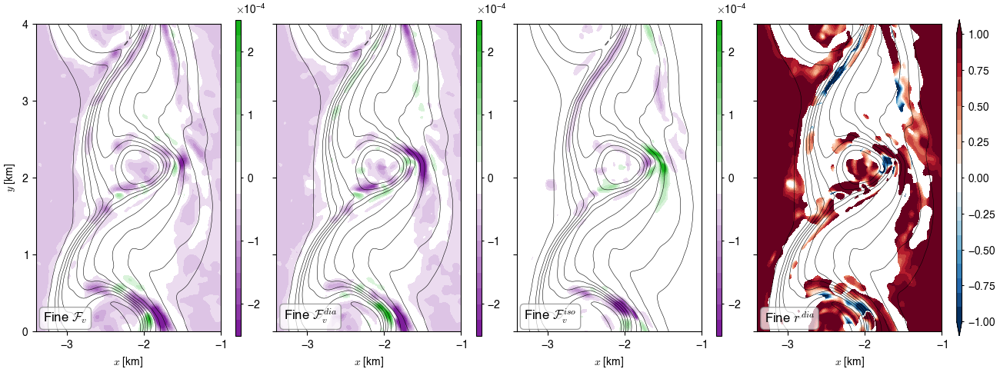

In [17]:
plt.close()
_,ax = plt.subplots(1,4, figsize=(13, 4.8), constrained_layout=True, sharex=True, sharey=True)

itime = 30 - 1
depth = 12

pcm0,mag0 = pcolor_center(dsl.wc.isel(time=itime).sel(zC=-depth, method='nearest'), ax[0], cmap=plt.get_cmap('cp_ds',20), cupr=2)
pcm1,_    = pcolor_center(dsl.wc_dia.isel(time=itime).sel(zC=-depth, method='nearest'), ax[1], cmap=plt.get_cmap('cp_ds',20), smag=mag0)
pcm2,_    = pcolor_center(dsl.wc_iso.isel(time=itime).sel(zC=-depth, method='nearest'), ax[2], cmap=plt.get_cmap('cp_ds',20), smag=mag0)
pcm3,_    = pcolor_center((dsl.wc_dia/dsl.wc.where(np.abs(dsl.wc) >= mag0/10)).isel(time=itime).sel(zC=-depth, method='nearest'), 
                          ax[3], cmap=plt.get_cmap('RdBu_r_ds',20), smag=1)

config_colorbar(pcm0, ax[0])
config_colorbar(pcm1, ax[1])
config_colorbar(pcm2, ax[2])
config_colorbar(pcm3, ax[3], extend='both')

txt_strs = [r"Fine $\mathcal{F}_v$", r"Fine $\mathcal{F}_v^{\,dia}$", r"Fine $\mathcal{F}_v^{\,iso}$", r"Fine $r^{\,dia}$"]
for j in range(4):
    ax[j].contour(ds_parent.xC/1e3, ds_parent.yC/1e3, ds_parent.b.isel(time=itime).sel(zC=-depth, method='nearest'),
                  blines_upper, colors='k', linewidths=0.4)
    ax[j].text(0.04, 0.02, txt_strs[j], ha='left', va='bottom', transform=ax[j].transAxes, fontsize=12,# fontweight='bold',
               bbox=dict(facecolor='w', edgecolor='gray', alpha=0.7, boxstyle='round,pad=0.3'))
    ax[j].set_aspect('equal')
    ax[j].set_xlabel(r'$x$ [km]')
ax[0].set_yticks(np.linspace(0,4,5))
ax[0].set_xticks(np.linspace(-4,4,9))
ax[0].set_xlim(-3.4, -1)
# ax[0].set_xlim(1, 3)
ax[0].set_ylabel(r'$y$ [km]');

#### 2b. slicing at mixed layer depth

In [22]:
itime = 40 - 1
zi_to_mld = 1

uc_mld = interp_to_zi(dsl.uc.isel(time=itime), -dsf.mld.isel(time=itime)*zi_to_mld)
vc_mld = interp_to_zi(dsl.vc.isel(time=itime), -dsf.mld.isel(time=itime)*zi_to_mld)
wc_mld = interp_to_zi(dsl.wc.isel(time=itime), -dsf.mld.isel(time=itime)*zi_to_mld)

nGx_mld = interp_to_zi(nGx.isel(time=itime), -dsf.mld.isel(time=itime)*zi_to_mld)
nGy_mld = interp_to_zi(nGy.isel(time=itime), -dsf.mld.isel(time=itime)*zi_to_mld)
nGz_mld = interp_to_zi(nGz.isel(time=itime), -dsf.mld.isel(time=itime)*zi_to_mld)

FFc_mld_dia = uc_mld * nGx_mld + vc_mld * nGy_mld + wc_mld * nGz_mld
wc_mld_dia  = FFc_mld_dia * nGz_mld
wc_mld_iso  = wc_mld - wc_mld_dia

/glade/work/zhihuaz/conda-envs/trace-seas/lib/python3.12/site-packages/dask/_task_spec.py:759: RuntimeWarning: invalid value encountered in divide
  return self.func(*new_argspec)


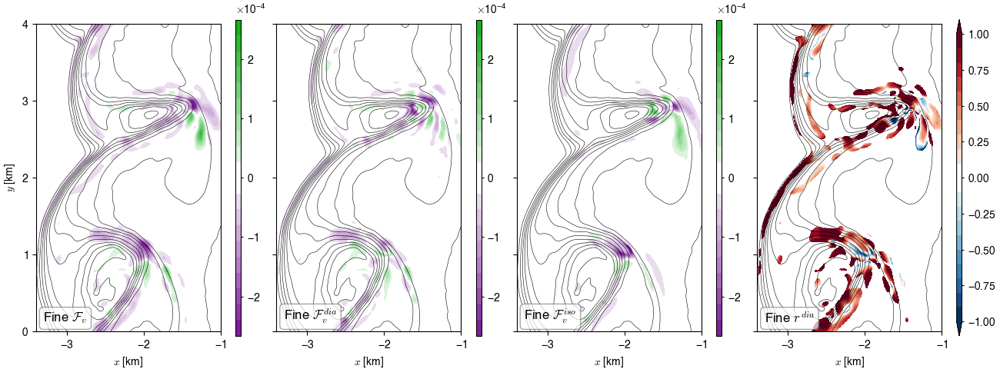

In [23]:
plt.close()
_,ax = plt.subplots(1,4, figsize=(13, 4.8), constrained_layout=True, sharex=True, sharey=True)

pcm0,mag0 = pcolor_center(wc_mld, ax[0], cmap=plt.get_cmap('cp_ds',20), cupr=2.5)
pcm1,_    = pcolor_center(wc_mld_dia, ax[1], cmap=plt.get_cmap('cp_ds',20), smag=mag0)
pcm2,_    = pcolor_center(wc_mld_iso, ax[2], cmap=plt.get_cmap('cp_ds',20), smag=mag0)
pcm3,_    = pcolor_center(wc_mld_dia/wc_mld.where(np.abs(wc_mld) >= mag0/10), 
                          ax[3], cmap=plt.get_cmap('RdBu_r_ds',20), smag=1)

config_colorbar(pcm0, ax[0])
config_colorbar(pcm1, ax[1])
config_colorbar(pcm2, ax[2])
config_colorbar(pcm3, ax[3], extend='both')

txt_strs = [r"Fine $\mathcal{F}_v$", r"Fine $\mathcal{F}_v^{\,dia}$", r"Fine $\mathcal{F}_v^{\,iso}$", r"Fine $r^{\,dia}$"]
for j in range(4):
    ax[j].contour(ds_parent.xC/1e3, ds_parent.yC/1e3, ds_parent.b.isel(time=itime, zC=-1),
                  blines_upper, colors='k', linewidths=0.4)
    ax[j].text(0.04, 0.02, txt_strs[j], ha='left', va='bottom', transform=ax[j].transAxes, fontsize=12,# fontweight='bold',
               bbox=dict(facecolor='w', edgecolor='gray', alpha=0.7, boxstyle='round,pad=0.3'))
    ax[j].set_aspect('equal')
    ax[j].set_xlabel(r'$x$ [km]')
ax[0].set_yticks(np.linspace(0,4,5))
ax[0].set_xticks(np.linspace(-4,4,9))
ax[0].set_xlim(-3.4, -1)
# ax[0].set_xlim(1, 3)
ax[0].set_ylabel(r'$y$ [km]');

In [79]:
# use_filtered_ds = True
# use_c_gradient  = True

# ds_parent = dsl if use_filtered_ds else ds
# gtype     = 'c' if use_c_gradient else 'b'
# varsg     = ['nG'+gtype+i for i in ['x', 'y', 'z']]
# nGx, nGy, nGz = ds_parent[varsg[0]], ds_parent[varsg[1]], ds_parent[varsg[2]]

# nGx_mld = interp_to_zi(nGx.isel(time=itime), -dsf.mld.isel(time=itime)*zi_to_mld)
# nGy_mld = interp_to_zi(nGy.isel(time=itime), -dsf.mld.isel(time=itime)*zi_to_mld)
# nGz_mld = interp_to_zi(nGz.isel(time=itime), -dsf.mld.isel(time=itime)*zi_to_mld)
# FFc_mld_dia = uc_mld * nGx_mld + vc_mld * nGy_mld + wc_mld * nGz_mld

ww_mld   = interp_to_zi(dsl.ww.isel(time=itime), -dsf.mld.isel(time=itime)*zi_to_mld)
# dcdx_mld = interp_to_zi(ds_parent['dcdx'].isel(time=itime), -dsf.mld.isel(time=itime)*zi_to_mld)
# dcdy_mld = interp_to_zi(ds_parent['dcdy'].isel(time=itime), -dsf.mld.isel(time=itime)*zi_to_mld)
dcdz_mld = interp_to_zi(ds_parent['dcdz'].isel(time=itime), -dsf.mld.isel(time=itime)*zi_to_mld)
# mGc_mld  = np.sqrt(dcdx_mld**2 + dcdy_mld**2 + dcdz_mld**2)

In [ ]:
plt.close()
_,ax = plt.subplots(1,4, figsize=(13, 4.8), constrained_layout=True, sharex=True, sharey=True)

pcm0,_    = pcolor_center(dcdz_mld, ax[0], cmap=plt.get_cmap('RdBu_r',20))
pcm1,mag1 = pcolor_center(-wc_mld/dcdz_mld, ax[1], cmap=plt.get_cmap('flux',20), cupr=2)
pcm2,_    = pcolor_center(-wc_mld_dia/dcdz_mld, ax[2], cmap=plt.get_cmap('flux',20), smag=mag1)
pcm3,_    = pcolor_limits(ww_mld, ax[3], cmap=plt.get_cmap('cmo.tempo',20), cupr=2)

config_colorbar(pcm0, ax[0])
config_colorbar(pcm1, ax[1], extend='both')
config_colorbar(pcm2, ax[2], extend='both')
config_colorbar(pcm3, ax[3])

txt_strs = [r"Submeso $\partial \bar{c} / \partial z$", r"Fine $\mathcal{K}_v$", r"Fine $\mathcal{K}_v^{\,dia}$", r"$\mathcal{E}_v\,'$"]
for j in range(4):
    ax[j].contour(ds_parent.xC/1e3, ds_parent.yC/1e3, ds_parent.b.isel(time=itime, zC=-1),
                  blines_upper, colors='k', linewidths=0.4)
    ax[j].text(0.04, 0.02, txt_strs[j], ha='left', va='bottom', transform=ax[j].transAxes, fontsize=12,# fontweight='bold',
               bbox=dict(facecolor='w', edgecolor='gray', alpha=0.7, boxstyle='round,pad=0.3'))
    ax[j].set_aspect('equal')
    ax[j].set_xlabel(r'$x$ [km]')
ax[0].set_yticks(np.linspace(0,4,5))
ax[0].set_xticks(np.linspace(-4,4,9))
ax[0].set_xlim(-3.4, -1)
# ax[0].set_xlim(1, 3)
ax[0].set_ylabel(r'$y$ [km]');

#### 3. Time series of vertical fluxes across the mixed layer depth

In [ ]:
plt.close()
plt.figure(figsize=(7,3.5), constrained_layout=True)

dxy = 3.64*3.64
zi_to_mld = 1
# dsl = [dsl0, dsl1, dsl3]
# dsf = [dsf0, dsf1, dsf3]
# ls_list = [':', '--', '-']
# for i in reversed(range(3)):

dsl = [dsl1, dsl3]
dsf = [dsf1, dsf3]
ls_list = ['--', '-']
for i in reversed(range(2)):
    Iwc_mld  = interp_to_zi(dsl[i].wc,  -dsf[i].mld*zi_to_mld).sum(['xC', 'yC'])*dxy
    Iw_c_mld = interp_to_zi(dsl[i].w_c, -dsf[i].mld*zi_to_mld).sum(['xC', 'yC'])*dxy

    plt.plot(dsf[i].hour, Iw_c_mld, ls=ls_list[i], c='C0')
    plt.plot(dsf[i].hour, Iwc_mld,  ls=ls_list[i], c='C1')

plt.axhline(0, ls='--', c='k')
plt.legend(['Submesoscale', 'Finescale'])
# plt.yscale('symlog', linthresh=1)
# plt.ylim(-1e3, 0.2)
plt.ylim(-720, 20)
plt.xlim(0, 48)
plt.grid(c='gray', ls='--', lw=0.3)
plt.ylabel(r'Transport across MLD')
plt.xlabel('Hours');

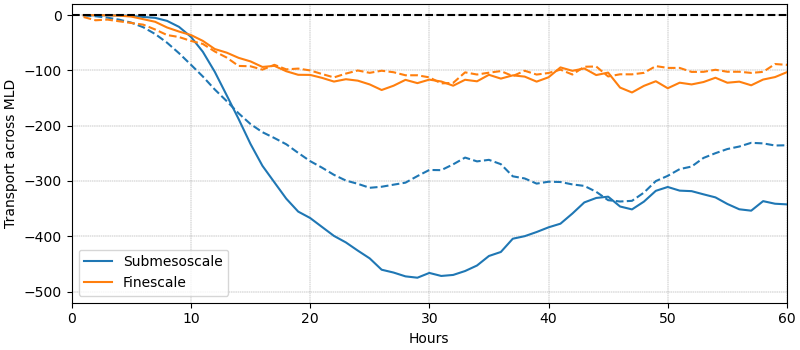

In [15]:
ax = plt.gca()
ax.set_xlim(0, 60)
ax.set_ylim(-520, 20)

fig = plt.gcf()
fig.set_size_inches(8,3.5)
plt.show()

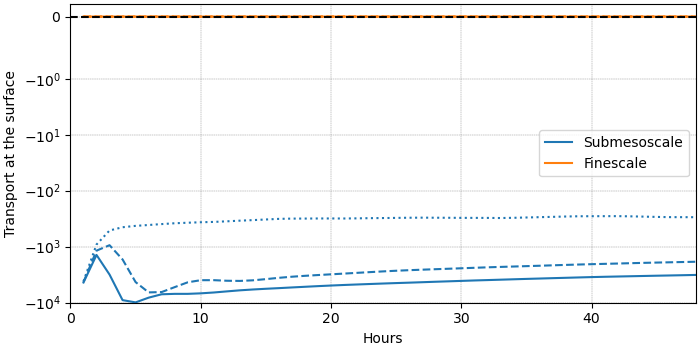

In [34]:
plt.close()
plt.figure(figsize=(7,3.5), constrained_layout=True)

dxy = 4*4
depth = 3
dsl = [dsl0, dsl1, dsl3]
dsf = [dsf0, dsf1, dsf3]
ls_list = [':', '--', '-']

for i in reversed(range(3)):
    Iwc_surf  = dsl[i].Fc.sum(['xC', 'yC'])*dxy
    Iw_c_surf = dsl[i].F_c.sum(['xC', 'yC'])*dxy

    # Iwc_surf  = dsl[i].wc.sel(zC=-depth, method='nearest').sum(['xC', 'yC'])*dxy
    # Iw_c_surf = dsl[i].w_c.sel(zC=-depth, method='nearest').sum(['xC', 'yC'])*dxy

    plt.plot(dsf[i].hour, Iw_c_surf, ls=ls_list[i], c='C0')
    plt.plot(dsf[i].hour, Iwc_surf,  ls=ls_list[i], c='C1')

plt.axhline(0, ls='--', c='k')
plt.legend(['Submesoscale', 'Finescale'])
plt.yscale('symlog', linthresh=1)
plt.ylim(-1e4, 0.2)
# plt.ylim(-720, 20)
plt.xlim(0, 48)
plt.grid(c='gray', ls='--', lw=0.3)
plt.ylabel(r'Transport at the surface')
plt.xlabel('Hours');

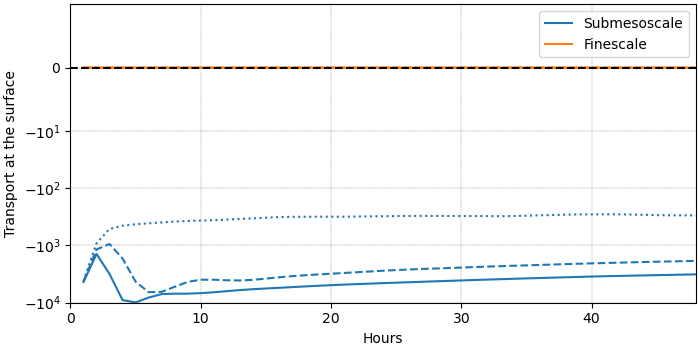

In [35]:
ax= plt.gca()
ax.set_yscale('symlog', linthresh=10)
ax.set_ylim(-1e4, 10)
plt.show()

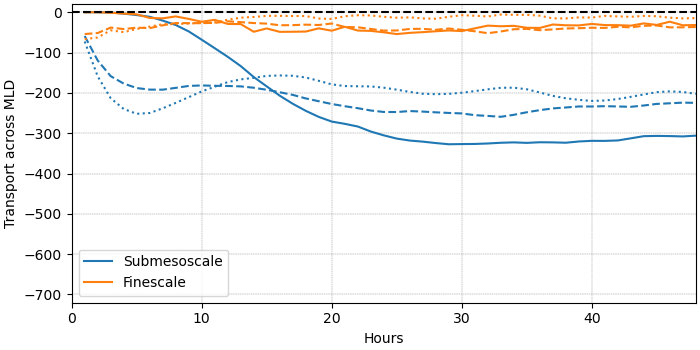

In [18]:
plt.close()
plt.figure(figsize=(7,3.5), constrained_layout=True)

dxy = 4*4
zi_to_mld = 1
dsl = [dsl0, dsl1, dsl3]
dsf = [dsf0, dsf1, dsf3]
ls_list = [':', '--', '-']

for i in reversed(range(3)):
    Iwn_mld  = interp_to_zi(dsl[i].wn,  -dsf[i].mld*zi_to_mld).sum(['xC', 'yC'])*dxy
    Iw_n_mld = interp_to_zi(dsl[i].w_n, -dsf[i].mld*zi_to_mld).sum(['xC', 'yC'])*dxy

    plt.plot(dsf[i].hour, Iw_n_mld, ls=ls_list[i], c='C0')
    plt.plot(dsf[i].hour, Iwn_mld,  ls=ls_list[i], c='C1')

plt.axhline(0, ls='--', c='k')
plt.legend(['Submesoscale', 'Finescale'])
# plt.yscale('symlog', linthresh=1)
# plt.ylim(-1e3, 0.2)
plt.ylim(-350, 20)
plt.xlim(0, 48)
plt.grid(c='gray', ls='--', lw=0.3)
plt.ylabel(r'Transport across MLD')
plt.xlabel('Hours');

### 3D subset

In [16]:
from streamjoy import stream, wrap_matplotlib
from viztool import plot_box_frame, plot_box_cut_frame
import streamjoy
import shutil

plt.rcParams['xtick.major.size'] = 1.5
plt.rcParams['ytick.major.size'] = 1.5

# streamjoy.config['fps'] = 3
# streamjoy.config['codec'] = 'h264' #'libx264'
# streamjoy.config['display'] = False
# streamjoy.config['max_frames'] = -1
# streamjoy.config['batch_size'] = 10
# streamjoy.config['processes'] = True #False
# streamjoy.config['ending_pause'] = 0
# streamjoy.config['threads_per_worker'] = 1
# streamjoy.config['scratch_dir'] = '/glade/u/home/zhihuaz/Projects/TRACE-SEAS/TracerInversion/Animations/streamjoy_scratch'

In [17]:
def nearest_value(array, value):
    # array = np.asarray(array)
    idx = (np.abs(array - value)).argmin()
    return array[idx]

In [97]:
def set_ax3d_ticks(ax, labelsize=12, add_axlabel=True):
    if add_axlabel:
        labelcolor = 'k'
        # ax.set_xlabel('x [m]', fontsize=10)
        # ax.set_ylabel('y [m]', fontsize=10, labelpad=12, va='top', ha='left')
        # ax.set_zlabel('z [m]', fontsize=10)
    else:
        labelcolor = 'none'
        # ax.axis('off')
    # ax.locator_params(axis='x', nbins=4)
    # ax.locator_params(axis='y', nbins=4)
    # ax.locator_params(axis='z', nbins=4)
    ax.set_xticks([-3400, -2400, -1400])
    ax.set_yticks(np.arange(5)*1e3)
    ax.set_zticks([-60, -40, -20, -5])
    ax.tick_params(axis='x', labelsize=labelsize, labelcolor=labelcolor)
    ax.tick_params(axis='y', labelsize=labelsize, labelcolor=labelcolor)
    ax.tick_params(axis='z', labelsize=labelsize, labelcolor=labelcolor)
    plt.setp(ax.get_xticklabels(), rotation=-27, rotation_mode='anchor', ha='center', va='top')
    plt.setp(ax.get_yticklabels(), rotation=35,  rotation_mode='anchor', ha='center', va='top')

def plot_xyz3d(ax, xyplane, xzplane, yzplane, mld, **kwargs):
    aspect_xy = kwargs.pop('aspect_xy')
    xlim      = kwargs.pop('xlim')
    ylim      = kwargs.pop('ylim')
    zlim      = kwargs.pop('zlim')
    azim      = kwargs.pop('azim')
    elev      = kwargs.pop('elev')
    blines    = kwargs.pop('blines')
    var       = kwargs.pop('var')
    add_cbar   = kwargs.pop('add_cbar', False)
    sci_cbar   = kwargs.pop('sci_cbar', False)
    nbins_cbar = kwargs.pop('nbins_cbar', None)

    xvar, yvar, zvar = sorted(xyplane[var].dims)
    xb, yb, zb = sorted(xyplane.b.dims)

    xyplane = xyplane.isel(zC=0).transpose('yC', 'xC')
    xzplane = xzplane.isel(yC=0).transpose('zC', 'xC')
    yzplane = yzplane.isel(xC=0).transpose('zC', 'yC')

    bkw_thin  = dict(levels=blines, linewidths=0.2, colors='xkcd:almost black')
    bkw_thick = dict(levels=blines, linewidths=0.3, colors='xkcd:almost black')
    edges_kw  = dict(color='xkcd:midnight', linewidth=0.5, zorder=2)

    ax.contourf(xyplane[xvar], xyplane[yvar], xyplane[var], zdir='z', offset=xyplane[zvar], **kwargs)
    ax.contour(xyplane[xb], xyplane[yb], xyplane.b, zdir='z', offset=xyplane[zb], **bkw_thin)
    
    X, Z = np.meshgrid(xzplane[xvar], xzplane[zvar])
    im = ax.contourf(X, xzplane[var], Z, zdir='y', offset=xzplane[yvar], **kwargs)
    X, Z = np.meshgrid(xzplane[xb], xzplane[zb])
    ax.contour(X, xzplane.b, Z, zdir='y', offset=xzplane[yb], **bkw_thick)
    mld_xz = mld.isel(yC=0)
    ax.plot(xzplane[xb], np.ones_like(xzplane[xb])*xzplane[yb].data, -mld_xz.where(-mld_xz < zlim[-1]), c='xkcd:aqua blue', lw=2)
    
    Y, Z = np.meshgrid(yzplane[yvar], yzplane[zvar])
    ax.contourf(yzplane[var], Y, Z, zdir='x', offset=yzplane[xvar], **kwargs)
    Y, Z = np.meshgrid(yzplane[yb], yzplane[zb])
    ax.contour(yzplane.b, Y, Z, zdir='x', offset=yzplane[xb], **bkw_thick)
    mld_yz = mld.isel(xC=-1)
    ax.plot(np.ones_like(yzplane[yb])*yzplane[xb].data, yzplane[yb], -mld_yz.where(-mld_yz < zlim[-1]), c='xkcd:aqua blue', lw=2)


    ax.set_xticks([-3400, -3000, -2600, -2200])
    ax.set_yticks([2200, 2600, 3000, 3400])
    ax.set_zticks([-60, -40, -20, -2])
    ax.tick_params(axis='both', labelsize=12, labelcolor='none')
    ax.tick_params(axis='z',    labelsize=12, labelcolor='none')
    plt.setp(ax.get_xticklabels(), rotation=-27, rotation_mode='anchor', ha='center', va='top')
    plt.setp(ax.get_yticklabels(), rotation=35,  rotation_mode='anchor', ha='center', va='top')
    ax.set(xlim=xlim, ylim=ylim, zlim=zlim)
    ax.view_init(elev=elev, azim=azim)
    plot_box_frame(ax, xlim, ylim, zlim, azim=azim, **edges_kw)
    ax.set_box_aspect((aspect_xy[0], aspect_xy[1], 1), zoom=0.95)

    if add_cbar:
        cbar = config_colorbar(im, ax, location='top', sci_notation=sci_cbar, shrink=0.45, nbins=nbins_cbar, aspect=45, pad=-0.15)
        return cbar


@wrap_matplotlib()
def anim3d_group(ds):
    xy_plane, xz_plane, yz_plane = ds
    plt.close()
    fig = plt.figure(figsize=(9, 8.2), dpi=600, constrained_layout=True)
    ax  = fig.add_subplot(111, projection='3d', computed_zorder=False)
    
    xyz3d_kwargs = dict(var=var_to_plot,
                        blines=blines_upper,
                        add_cbar=False,
                        sci_cbar=True,
                        nbins_cbar=5,
                        # cmap=plt.get_cmap('cp_ds', 40),
                        # levels=np.linspace(-var_mag, var_mag, 21),
    
                        cmap=plt.get_cmap('Spectral_r', 40),
                        levels=np.linspace(0, 1, 21),
                        
                        # cmap=plt.get_cmap('w_ds', 40),
                        # levels=np.linspace(-var_mag, var_mag, 21),
                        
                        # cmap=plt.get_cmap('RdYlBu_r', 40),
                        # levels=np.linspace(var_min, var_max, 21),
                        
                        # cmap=plt.get_cmap('RdBu_r_ds', 40),
                        # levels=np.linspace(-var_mag, var_mag, 21),
    
                        # cmap=plt.get_cmap('cmo.rain',40),
                        # levels=np.linspace(0, var_mag, 21),
                        
                        # extend='both',
                        aspect_xy=[3.5, 3.5*Ly_to_Lx],
                        xlim=subset_xlim, ylim=subset_ylim, zlim=subset_zlim,
                        azim=-45,
                        elev=35)
    
    plot_xyz3d(ax, xy_plane, xz_plane, yz_plane, **xyz3d_kwargs)
    ax.text2D(0.8, 0.8, f'Hour {int(xy_plane.hour.data):02d}', fontsize=12, transform=ax.transAxes, ha='left', va='top')
    return fig

def plot_xyz3d_cut(ax, xyplane, xzplane, yzplane, xycut, xzcut, yzcut, mld, **kwargs):
    aspect_xy = kwargs.pop('aspect_xy')
    xlim      = kwargs.pop('xlim')
    ylim      = kwargs.pop('ylim')
    zlim      = kwargs.pop('zlim')
    azim      = kwargs.pop('azim')
    elev      = kwargs.pop('elev')
    blines    = kwargs.pop('blines')
    var       = kwargs.pop('var')
    add_cbar   = kwargs.pop('add_cbar', False)
    sci_cbar   = kwargs.pop('sci_cbar', False)
    nbins_cbar = kwargs.pop('nbins_cbar', None)
    add_axlabel = kwargs.pop('add_axlabel', False)

    xvar, yvar, zvar = sorted(xyplane[var].dims)
    xb, yb, zb = sorted(xyplane.b.dims)

    xyplane = xyplane.isel(zC=0).transpose('yC', 'xC')
    xzplane = xzplane.isel(yC=0).transpose('zC', 'xC')
    yzplane = yzplane.isel(xC=0).transpose('zC', 'yC')

    zcut, ycut, xcut = xycut.zC.item(), xzcut.yC.item(), yzcut.xC.item()
    xycut = xycut.isel(zC=0).transpose('yC', 'xC')
    xzcut = xzcut.isel(yC=0).transpose('zC', 'xC')
    yzcut = yzcut.isel(xC=0).transpose('zC', 'yC')

    bkw_thin  = dict(levels=blines, linewidths=0.2, colors='xkcd:almost black')
    bkw_thick = dict(levels=blines, linewidths=0.3, colors='xkcd:almost black')
    edges_kw  = dict(color='xkcd:midnight', linewidth=0.5, zorder=2)

    ax.contourf(xyplane[xvar], xyplane[yvar], xyplane[var], zdir='z', offset=xyplane[zvar], **kwargs)
    ax.contour(xyplane[xb], xyplane[yb], xyplane.b, zdir='z', offset=xyplane[zb], **bkw_thin)
    ax.contourf(xycut[xvar], xycut[yvar], xycut[var], zdir='z', offset=xycut[zvar], **kwargs)
    ax.contour(xycut[xb], xycut[yb], xycut.b, zdir='z', offset=xycut[zb], **bkw_thin)
    # X, Y = np.meshgrid(mld[xvar], mld[yvar])
    # ax.plot_surface(X, Y, -mld, color='xkcd:aqua blue', rstride=1, cstride=1, lw=0, alpha=0.5)
    
    X, Z = np.meshgrid(xzplane[xvar], xzplane[zvar])
    im = ax.contourf(X, xzplane[var], Z, zdir='y', offset=xzplane[yvar], **kwargs)
    X, Z = np.meshgrid(xzplane[xb], xzplane[zb])
    ax.contour(X, xzplane.b, Z, zdir='y', offset=xzplane[yb], **bkw_thick)
    mld_xz = mld.isel(yC=0)
    ax.plot(xzplane[xb], np.ones_like(xzplane[xb])*xzplane[yb].data, -mld_xz.where(-mld_xz < zlim[-1]), c='xkcd:aqua blue', lw=2)

    # for the cutout
    X, Z = np.meshgrid(xzcut[xvar], xzcut[zvar])
    ax.contourf(X, xzcut[var], Z, zdir='y', offset=xzcut[yvar], **kwargs)
    X, Z = np.meshgrid(xzcut[xb], xzcut[zb])
    ax.contour(X, xzcut.b, Z, zdir='y', offset=xzcut[yb], **bkw_thick)

    Y, Z = np.meshgrid(yzplane[yvar], yzplane[zvar])
    ax.contourf(yzplane[var], Y, Z, zdir='x', offset=yzplane[xvar], **kwargs)
    Y, Z = np.meshgrid(yzplane[yb], yzplane[zb])
    ax.contour(yzplane.b, Y, Z, zdir='x', offset=yzplane[xb], **bkw_thick)
    mld_yz = mld.isel(xC=-1)
    ax.plot(np.ones_like(yzplane[yb])*yzplane[xb].data, yzplane[yb], -mld_yz.where(-mld_yz < zlim[-1]), c='xkcd:aqua blue', lw=2)

    # for the cutout
    Y, Z = np.meshgrid(yzcut[yvar], yzcut[zvar])
    ax.contourf(yzcut[var], Y, Z, zdir='x', offset=yzcut[xvar], **kwargs)
    Y, Z = np.meshgrid(yzcut[yb], yzcut[zb])
    ax.contour(yzcut.b, Y, Z, zdir='x', offset=yzcut[xb], **bkw_thick)
    
    set_ax3d_ticks(ax, labelsize=12, add_axlabel=add_axlabel)
    ax.set(xlim=xlim, ylim=ylim, zlim=zlim)
    ax.view_init(elev=elev, azim=azim)
    plot_box_cut_frame(ax, xlim, ylim, zlim, xcut, ycut, zcut, azim=azim, **edges_kw)
    ax.set_box_aspect((aspect_xy[0], aspect_xy[1], 1), zoom=0.95)

    if add_cbar:
        cbar = config_colorbar(im, ax, location='top', sci_notation=sci_cbar, shrink=0.45, nbins=nbins_cbar, aspect=45, pad=-0.19, anchor=(0.7, 1))
        return cbar

In [15]:
ds  = ds1.copy()
dsl = dsl1.copy()

# use_filtered_ds = True
# use_c_gradient  = False

# ds_parent = dsl if use_filtered_ds else ds
# gtype     = 'c' if use_c_gradient else 'b'
# varsg     = ['nG'+gtype+i for i in ['x', 'y', 'z']]
# nGx, nGy, nGz = ds_parent[varsg[0]], ds_parent[varsg[1]], ds_parent[varsg[2]]

# dsl['FFc_dia'] = dsl.uc * nGx + dsl.vc * nGy + dsl.wc * nGz
# dsl['wc_dia']  = (dsl.FFc_dia * nGz)#.where(dsl.mGb >= 1e-8)
# dsl['wc_iso']  = dsl.wc - dsl.wc_dia

# dsl['Kz'] =  dsl.mFFc / dsl.mGc

In [37]:
ds  = ds3.copy()
dsl = dsl3.copy()
dsf = dsf3.copy()

itime  = 45 - 1
# cupr   = 2
# x1, x2 = -3500, -1250
# y1, y2 =  0,  4004

cupr   = 1
x1, x2 = -3650, -1250
y1, y2 =  0,  4004
z1, z2 = -75, -5
box3d  = dict(xC=slice(x1, x2), yC=slice(y1, y2), zC=slice(z1, z2))

# var_to_plot = 'ζ'
var_to_plot = 'c'
subset   = xr.merge([ds.b, dsf.mld, ds[var_to_plot].clip(min=0, max=1)]).isel(time=itime).sel(box3d)
# subset   = xr.merge([ds.b, dsf.mld, 1-ds[var_to_plot].clip(min=0, max=1)]).isel(time=itime).sel(box3d)
# subset   = xr.merge([ds.b, dsf.mld, ds[var_to_plot]]).isel(time=itime).sel(box3d)
# subset   = xr.merge([ds.b, dsf.mld, dsl[var_to_plot]]).isel(time=itime).sel(box3d)

xy_plane = subset.isel(zC=[-1])
xz_plane = subset.isel(yC=[0])
yz_plane = subset.isel(xC=[-1])

subset_xlim = xz_plane.xC.min().item(), xz_plane.xC.max().item()
subset_ylim = yz_plane.yC.min().item(), yz_plane.yC.max().item()
subset_zlim = yz_plane.zC.min().item(), z2#yz_plane.zC.max().item()

Ly_to_Lx = (subset_ylim[1] - subset_ylim[0]) / (subset_xlim[1] - subset_xlim[0])
# var_mag = np.max([np.abs(xy_plane[var_to_plot]).quantile(0.99),
#                   np.abs(xz_plane[var_to_plot]).quantile(0.99),
#                   np.abs(yz_plane[var_to_plot]).quantile(0.99)]).item()*cupr

# var_mag = 4e-4
# var_mag = 1
# var_mag = 5.82e-9


# var_max = np.max([xy_plane[var_to_plot].quantile(0.98),
#                   xz_plane[var_to_plot].quantile(0.98),
#                   yz_plane[var_to_plot].quantile(0.98)]).item()

# var_min = np.min([xy_plane[var_to_plot].quantile(0.01),
#                   xz_plane[var_to_plot].quantile(0.01),
#                   yz_plane[var_to_plot].quantile(0.01)]).item()*1.14

In [19]:
nlev = 15
delb0 = np.floor((bsrf - bmin)/nlev * 1e2) / 1e2
blines_upper = np.arange(bmin, bsrf, delb0)*1e-4

In [93]:
ds  = ds1.copy()
dsl = dsl1.copy()
dsf = dsf1.copy()

itime  = 41 - 1
cupr   = 1
x1, x2 = -3550, -1350
y1, y2 =  0,  4004
z1, z2 = -70, -5
box2d  = dict(xC=slice(x1, x2), yC=slice(y1, y2))
box3d  = dict(xC=slice(x1, x2), yC=slice(y1, y2), zC=slice(z1, z2))

z0 = nearest_value(ds.zC.data, -15)
x0 = nearest_value(ds.xC.data, -2250)
y0 = nearest_value(ds.yC.data,  900)

# var_to_plot = 'c'
# subset = xr.merge([ds.b, ds[var_to_plot].clip(min=0, max=1)]).isel(time=itime).sel(box3d)
var_to_plot = 'w'
wstar_mean = dsf['wstar'].isel(time=itime).mean(['xC', 'yC']).compute().data
subset = xr.merge([ds.b, ds[var_to_plot]/wstar_mean]).isel(time=itime).sel(box3d)

mld    = dsf.mld.isel(time=itime).sel(box2d)

xy_cut = subset.sel(zC=[z0], method='nearest').where((ds.xC >= x0) & (ds.yC <= y0))
xz_cut = subset.sel(yC=[y0], method='nearest').where((ds.xC >= x0) & (ds.zC >= z0))
yz_cut = subset.sel(xC=[x0], method='nearest').where((ds.yC <= y0) & (ds.zC >= z0))

xy_plane = subset.isel(zC=[-1]).where((ds.xC <= x0) | (ds.yC >= y0))
xz_plane = subset.isel(yC=[0]).where((ds.xC <= x0) | (ds.zC <= z0))
yz_plane = subset.isel(xC=[-1]).where((ds.yC >= y0) | (ds.zC <= z0))

subset_xlim = xz_plane.xC.min().item(), xz_plane.xC.max().item()
subset_ylim = 0, 4004
subset_zlim = yz_plane.zC.min().item(), z2

Ly_to_Lx = (subset_ylim[1] - subset_ylim[0]) / (subset_xlim[1] - subset_xlim[0])

var_mag = 2

/glade/derecho/scratch/zhihuaz/tmp/ipykernel_199294/700850174.py:52: UserWarning: constrained_layout not applied because axes sizes collapsed to zero.  Try making figure larger or Axes decorations smaller.
  plt.savefig(f'../Figures/{cname1}_snapshot_3D_wn.png', dpi=600, transparent=True);


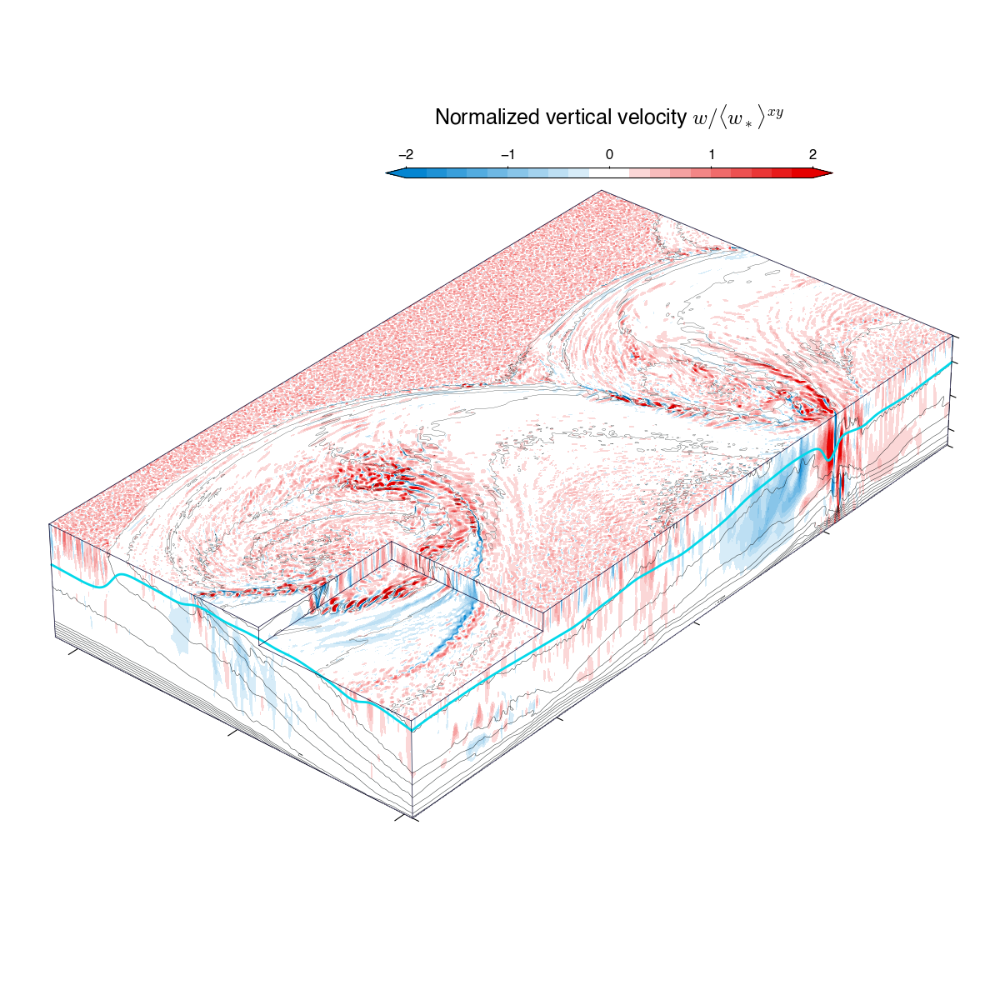

In [94]:
plt.close()
fig = plt.figure(figsize=(12, 12), constrained_layout=True)
ax  = fig.add_subplot(111, projection='3d', computed_zorder=False)

xyz3d_kwargs = dict(var=var_to_plot,
                    blines=blines_upper,
                    add_cbar=True,
                    sci_cbar=True,
                    
                    # add_axlabel=True,
                    # nbins_cbar=6,
                    # cmap=plt.get_cmap('Spectral_r', 40),
                    # levels=np.linspace(0, 1, 21),
                    
                    # cmap=plt.get_cmap('cp_ds', 40),
                    # levels=np.linspace(-var_mag, var_mag, 21),

                    # cmap=plt.get_cmap('Greens', 40),
                    # levels=np.linspace(0, 1, 21),

                    nbins_cbar=5,
                    extend='both',
                    cmap=plt.get_cmap('w_ds', 20),
                    levels=np.linspace(-var_mag, var_mag, 21),
                    
                    # cmap=plt.get_cmap('RdYlBu_r', 40),
                    # levels=np.linspace(var_min, var_max, 41),
                    
                    # cmap=plt.get_cmap('RdBu_r', 40),
                    # levels=np.linspace(-var_mag, var_mag, 21),

                    # cmap=plt.get_cmap('cmo.rain',40),
                    # levels=np.linspace(0, var_mag, 21),

                    # cmap=plt.get_cmap('cmo.curl',40),
                    # levels=np.linspace(-var_mag, var_mag, 21),
                    
                    aspect_xy=[3.5, 3.5*Ly_to_Lx],
                    xlim=subset_xlim, ylim=subset_ylim, zlim=subset_zlim,
                    azim=-50,
                    elev=33)

cbar = plot_xyz3d_cut(ax, xy_plane, xz_plane, yz_plane, xy_cut, xz_cut, yz_cut, mld, **xyz3d_kwargs)
cbar.ax.tick_params(labelsize=12)

# cbar.ax.set_xlabel(r'Tracer concentration $c$', fontsize=18, labelpad=20);
cbar.ax.set_xlabel(r'Normalized vertical velocity $w / \langle w_* \rangle^{xy}$', fontsize=18, labelpad=20);
# cbar.ax.set_xlabel(r'Ertel potential vorticity $q$ [m s$^{-1}$]', fontsize=18, labelpad=20);
# cbar.ax.set_xlabel(r'subsurface tracer concentration $c$', fontsize=10, labelpad=8);

# plt.savefig(f'../Figures/{cname1}_snapshot_3D_c.png', dpi=600, transparent=True);
plt.savefig(f'../Figures/{cname1}_snapshot_3D_wn.png', dpi=600, transparent=True);

# plt.savefig(f'../Figures/{cname3}_snapshot_3D_c.png', dpi=600, transparent=True);
# plt.savefig(f'../Figures/{cname3}_snapshot_3D_wn.png', dpi=600, transparent=True);

/glade/derecho/scratch/zhihuaz/tmp/ipykernel_199294/2312698274.py:83: UserWarning: constrained_layout not applied because axes sizes collapsed to zero.  Try making figure larger or Axes decorations smaller.
  plt.savefig(f'../Figures/{cname1}_snapshot_3Dsub_wn.png', dpi=600, transparent=True);


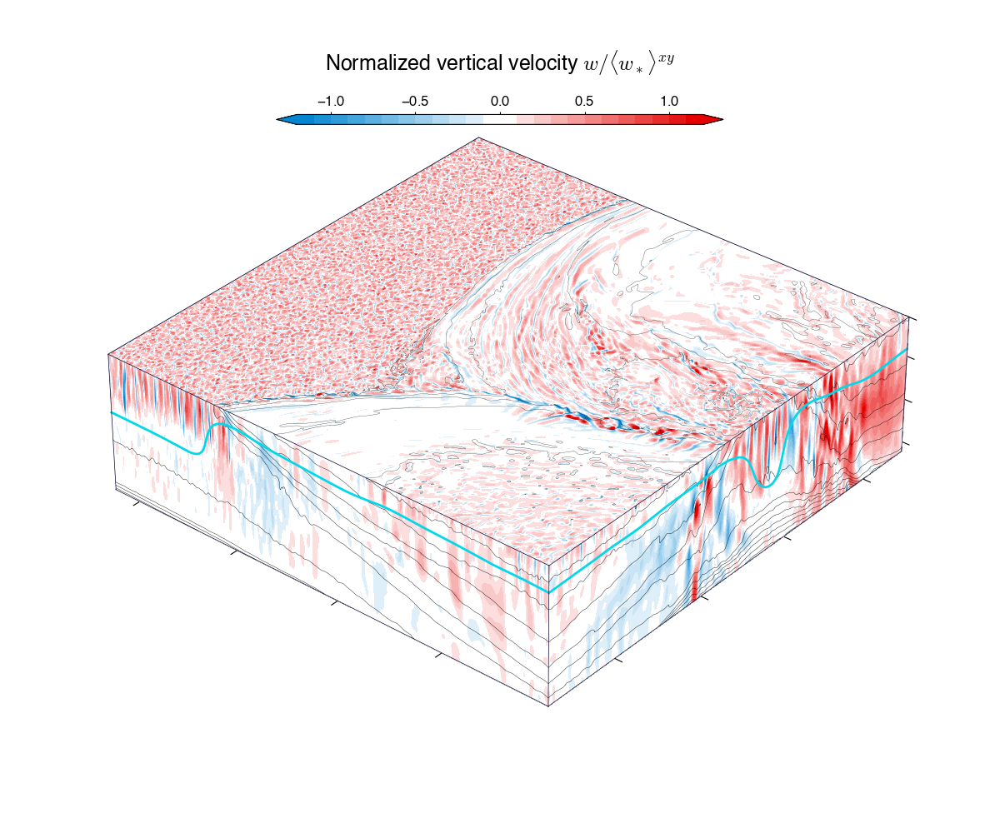

In [98]:
ds  = ds1.copy()
dsl = dsl1.copy()
dsf = dsf1.copy()

itime  = 41 - 1
x1, x2 = -3500, -1800
y1, y2 =  1900,  3600
z1, z2 = -65, -2
box2d  = dict(xC=slice(x1, x2), yC=slice(y1, y2))
box3d  = dict(xC=slice(x1, x2), yC=slice(y1, y2), zC=slice(z1, z2))

# var_to_plot = 'c'
# subset = xr.merge([ds.b, ds[var_to_plot].clip(min=0, max=1)]).isel(time=itime).sel(box3d)
var_to_plot = 'w'
wstar_mean = dsf['wstar'].isel(time=itime).mean(['xC', 'yC']).compute().data
subset = xr.merge([ds.b, ds[var_to_plot]/wstar_mean]).isel(time=itime).sel(box3d)

mld    = dsf.mld.isel(time=itime).sel(box2d)

xy_plane = subset.isel(zC=[-1])
xz_plane = subset.isel(yC=[0])
yz_plane = subset.isel(xC=[-1])

subset_xlim = xz_plane.xC.min().item(), xz_plane.xC.max().item()
subset_ylim = yz_plane.yC.min().item(), yz_plane.yC.max().item()
subset_zlim = yz_plane.zC.min().item(), z2

Ly_to_Lx = (subset_ylim[1] - subset_ylim[0]) / (subset_xlim[1] - subset_xlim[0])

var_mag = 1.2

plt.close()
fig = plt.figure(figsize=(12, 10), constrained_layout=True)
ax  = fig.add_subplot(111, projection='3d', computed_zorder=False)

xyz3d_kwargs = dict(var=var_to_plot,
                    blines=blines_upper,
                    add_cbar=True,
                    sci_cbar=True,
                    
                    # nbins_cbar=6,
                    # cmap=plt.get_cmap('Spectral_r', 40),
                    # levels=np.linspace(0, 1, 21),
                    
                    # cmap=plt.get_cmap('cp_ds', 40),
                    # levels=np.linspace(-var_mag, var_mag, 21),

                    # cmap=plt.get_cmap('Greens', 40),
                    # levels=np.linspace(0, 1, 21),

                    nbins_cbar=6,
                    extend='both',
                    cmap=plt.get_cmap('w_ds', 24),
                    levels=np.linspace(-var_mag, var_mag, 25),
                    
                    # cmap=plt.get_cmap('RdYlBu_r', 40),
                    # levels=np.linspace(var_min, var_max, 41),
                    
                    # cmap=plt.get_cmap('RdBu_r', 40),
                    # levels=np.linspace(-var_mag, var_mag, 21),

                    # cmap=plt.get_cmap('cmo.rain',40),
                    # levels=np.linspace(0, var_mag, 21),

                    # cmap=plt.get_cmap('cmo.curl',40),
                    # levels=np.linspace(-var_mag, var_mag, 21),
                    
                    aspect_xy=[3.5, 3.5*Ly_to_Lx],
                    xlim=subset_xlim, ylim=subset_ylim, zlim=subset_zlim,
                    azim=-50,
                    elev=33)

cbar = plot_xyz3d(ax, xy_plane, xz_plane, yz_plane, mld, **xyz3d_kwargs)
cbar.ax.tick_params(labelsize=12)

# cbar.ax.set_xlabel(r'Tracer concentration $c$', fontsize=18, labelpad=20);
cbar.ax.set_xlabel(r'Normalized vertical velocity $w / \langle w_* \rangle^{xy}$', fontsize=18, labelpad=20);
# cbar.ax.set_xlabel(r'Vertical velocity $w$ [m s$\mathregular{^{-1}}$]', fontsize=18, labelpad=20);
# cbar.ax.set_xlabel(r'Ertel potential vorticity $q$ [m s$^{-1}$]', fontsize=18, labelpad=20);
# cbar.ax.set_xlabel(r'subsurface tracer concentration $c$', fontsize=10, labelpad=8);

# plt.savefig(f'../Figures/{cname1}_snapshot_3Dsub_c.png', dpi=600, transparent=True);
plt.savefig(f'../Figures/{cname1}_snapshot_3Dsub_wn.png', dpi=600, transparent=True);

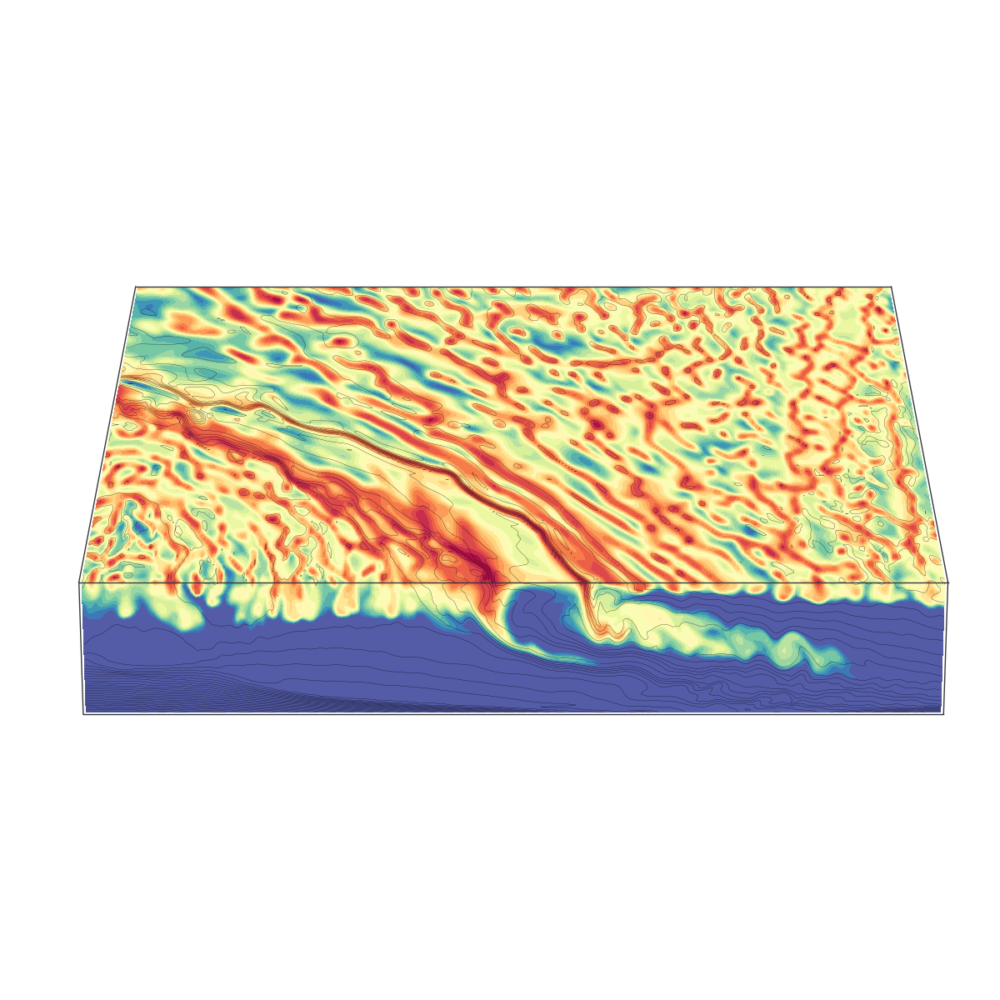

In [51]:
itime = 20 - 1
x1, x2 = -2400, -1400
y1, y2 = 3440, 4004
z1, z2 = -65, -2
top = ds.isel(time=itime).sel(zC=z2, method='nearest').sel(dict(xC=slice(x1, x2), yC=slice(y1, y2)))
sou = ds.isel(time=itime).sel(yC=y1, method='nearest').sel(dict(xC=slice(x1, x2), zC=slice(z1, z2)))
X, Z = np.meshgrid(sou.xC.data, sou.zC.data)
nlev = 40
delb0 = np.floor((bsrf - bmin)/nlev * 1e2) / 1e2
blines_upper = np.arange(bmin, bsrf, delb0)*1e-4

plt.close()
fig = plt.figure(figsize=(12, 12), constrained_layout=True)
ax  = fig.add_subplot(111, projection='3d', computed_zorder=False)

ax.contourf(top.xC, top.yC, top.c.clip(min=0, max=1), zdir='z', offset=top.zC.data, levels=np.linspace(0, 1, 21), cmap='Spectral_r', vmin=0, vmax=1)
ax.contour(top.xC, top.yC, top.b, zdir='z', offset=top.zC.data, colors='k', levels=blines_upper, linewidths=0.2)

im = ax.contourf(X, sou.c.clip(min=0, max=1), Z, zdir='y', offset=sou.yC.data, levels=np.linspace(0, 1, 21), cmap='Spectral_r', vmin=0, vmax=1)
ax.contour(X, sou.b, Z, zdir='y', offset=sou.yC.data, colors='k', levels=blines_upper, linewidths=0.2)

ax.axis('off')
ax.set(xlim=(x1, x2), ylim=(y1, y2), zlim=(z1, z2))
ax.view_init(elev=22, azim=-90)
plot_box_frame(ax, (x1, x2), (y1, y2), (z1, z2), azim=-90, color='xkcd:dark grey', linewidth=1, zorder=2)
ax.set_box_aspect((6, 6, 1), zoom=1.12)
# cbar = config_colorbar(im, ax, location='top', sci_notation=True, shrink=0.4, pad=-0.33, nbins=8)
# cbar.ax.set_xlabel(r'Meridional velocity $\upsilon$ [m s$\mathregular{^{-1}}$]', fontsize=12, labelpad=10);

# plt.savefig('../Figures/.pdf', dpi=600);

In [ ]:
ds  = ds1.copy()
dsl = dsl1.copy()
dsf = dsf1.copy()

x1, x2 = -3500, -1250
y1, y2 =  0,  4004
z1, z2 = -70, -4
box3d  = dict(xC=slice(x1, x2), yC=slice(y1, y2), zC=slice(z1, z2))

var_to_plot = 'c'
subset   = xr.merge([ds.b, dsf.mld, dsf.hour, ds[var_to_plot].clip(min=0, max=1)]).sel(box3d)
# subset   = xr.merge([ds.b, dsf.mld, ds[var_to_plot]]).isel(time=itime).sel(box3d)

xy_plane = subset.isel(zC=[-1])
xz_plane = subset.isel(yC=[0])
yz_plane = subset.isel(xC=[-1])

subset_xlim = xz_plane.xC.min().item(), xz_plane.xC.max().item()
subset_ylim = yz_plane.yC.min().item(), yz_plane.yC.max().item()
subset_zlim = yz_plane.zC.min().item(), yz_plane.zC.max().item()
Ly_to_Lx    = (subset_ylim[1] - subset_ylim[0]) / (subset_xlim[1] - subset_xlim[0])

# i = 59
# anim3d_group(xy_plane.isel(time=i), xz_plane.isel(time=i), yz_plane.isel(time=i))

In [83]:
%%time
if os.path.isdir(streamjoy.config['scratch_dir']):
    shutil.rmtree(streamjoy.config['scratch_dir'])

stream([(xy_plane.isel(time=i), xz_plane.isel(time=i), yz_plane.isel(time=i)) for i in range(ds.sizes['time'])],
       renderer=anim3d_group,
       write_kwargs=dict(crf='18'),
       client=client,
       uri='../Animations/' + cname1 + f'_c3d.mp4');

[SUCCESS] 11:06PM: Saved stream to /glade/u/home/zhihuaz/Projects/TRACE-SEAS/TracerInversion/Analysis/../Animations/d11_M006_Ri020_em01_Q001_W000_D000_St0_surf-tracer_c3d.mp4.


CPU times: user 1min 51s, sys: 10.3 s, total: 2min 2s
Wall time: 52.7 s


In [45]:
def plot_surf3d(ax, xyplane, xzplane, yzplane, **kwargs):
    aspect_xy = kwargs.pop('aspect_xy')
    xlim      = kwargs.pop('xlim')
    ylim      = kwargs.pop('ylim')
    zlim      = kwargs.pop('zlim')
    clim      = kwargs.pop('clim')
    azim      = kwargs.pop('azim')
    elev      = kwargs.pop('elev')
    blines    = kwargs.pop('blines')
    var       = kwargs.pop('var')
    cmap      = kwargs.pop('cmap')
    add_cbar   = kwargs.pop('add_cbar')
    sci_cbar   = kwargs.pop('sci_cbar')
    nbins_cbar = kwargs.pop('nbins_cbar', None)

    xvar, yvar, zvar = sorted(xyplane[var].dims)
    xb, yb, zb = sorted(xyplane.b.dims)
    hvar = 'mld' if 'mld' in list(xyplane.data_vars.keys()) else 'bld'

    xyplane = xyplane.isel(zC=0).transpose('yC', 'xC')
    xzplane = xzplane.isel(yC=0).transpose('zC', 'xC')
    yzplane = yzplane.isel(xC=0).transpose('zC', 'yC')

    bkw_light = dict(levels=blines, linewidths=0.35, colors='xkcd:almost black')
    edges_kw  = dict(color='xkcd:navy', linewidth=1, zorder=2)

    X, Y = np.meshgrid(xyplane[xvar], xyplane[yvar])
    norm = Normalize(clim[0], clim[1])
    m = plt.cm.ScalarMappable(norm=norm, cmap=cmap)
    m.set_array([])
    fcolors = m.to_rgba(xyplane[var])
    ax.plot_surface(X, Y, -xyplane[hvar], facecolors=fcolors, rstride=1, cstride=1, cmap=cmap)

    X, Z = np.meshgrid(xzplane[xvar], xzplane[zvar])
    im = ax.contourf(X, xzplane[var].where(xzplane[zvar] < -xzplane[hvar]), Z, zdir='y', offset=xzplane[yvar], cmap=cmap, **kwargs)
    X, Z = np.meshgrid(xzplane[xb], xzplane[zb])
    ax.plot(xzplane[xb], np.ones_like(xzplane[xb])*xzplane[yb].data, -xzplane[hvar], c='xkcd:aqua blue')
    ax.contour(X, xzplane.b.where(xzplane[zb] < -xzplane[hvar]), Z, zdir='y', offset=xzplane[yb], **bkw_light)
    
    Y, Z = np.meshgrid(yzplane[yvar], yzplane[zvar])
    ax.contourf(yzplane[var].where(yzplane[zvar] < -yzplane[hvar]), Y, Z, zdir='x', offset=yzplane[xvar], cmap=cmap, **kwargs)
    Y, Z = np.meshgrid(yzplane[yb], yzplane[zb])
    ax.contour(yzplane.b.where(yzplane[zb] < -yzplane[hvar]), Y, Z, zdir='x', offset=yzplane[xb], **bkw_light)
    ax.plot(np.ones_like(yzplane[yb])*yzplane[xb].data, yzplane[yb], -yzplane[hvar], c='xkcd:aqua blue')

    # ax.axis('off')
    set_ax3d_ticks(ax, length=1, labelsize=6)
    ax.set(xlim=xlim, ylim=ylim, zlim=zlim)
    ax.view_init(elev=elev, azim=azim)
    # plot_box_frame(ax, xlim, ylim, zlim, azim=azim, **edges_kw)
    ax.set_box_aspect((aspect_xy[0], aspect_xy[1], 1), zoom=0.95)

    # if add_cbar:
    #     config_colorbar(im, ax, sci_notation=sci_cbar, shrink=0.5, nbins=nbins_cbar)
    # return im

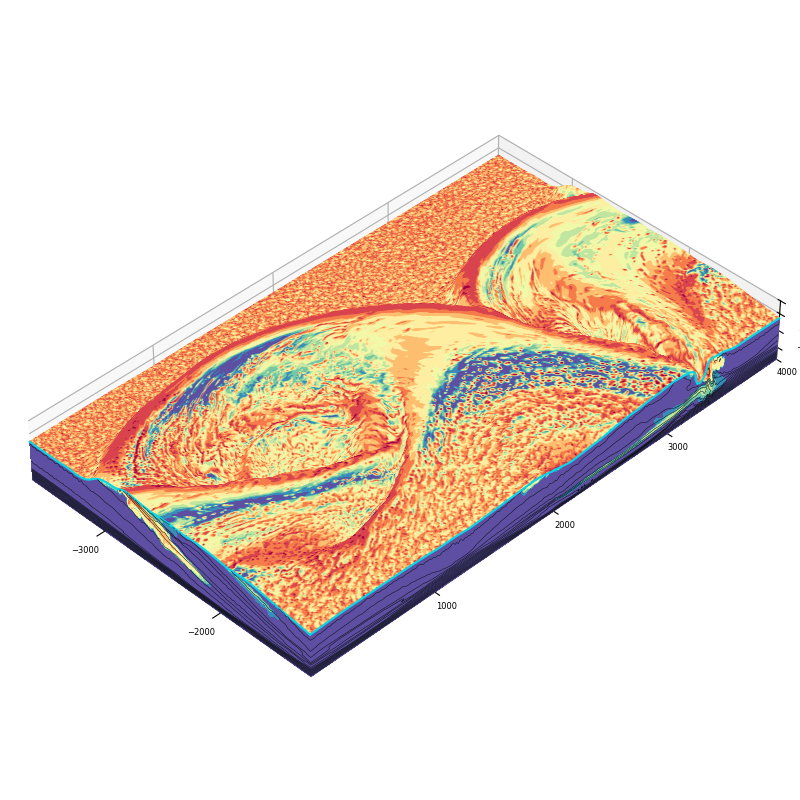

In [48]:
plt.close()
fig = plt.figure(figsize=(8, 8), constrained_layout=True)
ax  = fig.add_subplot(111, projection='3d', computed_zorder=False)

surf3d_kwargs = dict(var=var_to_plot,
                    blines=blines_upper,
                    # add_cbar=False,
                    # nbins_cbar=8,
                    # cmap='cp',#plt.get_cmap('cp_ds', 29),
                    # clim=[-var_mag, var_mag],
                    # levels=np.linspace(-var_mag, var_mag, 29),
                    # sci_cbar=True,

                    add_cbar=False,
                    cmap=plt.get_cmap('Spectral_r', 10),
                    clim=[0,1],
                    levels=np.linspace(0, 1, 11),
                    sci_cbar=False,
                    
                    # extend='both',
                    aspect_xy=[5.2, 5.2*Ly_to_Lx],
                    xlim=subset_xlim, ylim=subset_ylim, zlim=subset_zlim,
                    azim=-45,
                    elev=40)

plot_surf3d(ax, xy_plane, xz_plane, yz_plane, **surf3d_kwargs);

### Volume integrated fine-scale kinetic energy budget

$\frac{\partial }{\partial t} \int\mathcal{E}'dV = \int \Pi dV + \int\mathcal{B}'dV - \int \mathcal{D}'dV$

In [22]:
dxy   = 4*4
dt    = dsl.save_out_interval*3
cbgt0 = dsf.Ifske.where(dsl.mask_fz).sum(['xC', 'yC'])*dxy
cbgt0 = cbgt0 - cbgt0.isel(time=0)
cbgt1 = integrate.cumulative_trapezoid(dsf.ISP.where(dsl.mask_fz).sum(['xC', 'yC'])*dxy,  dx=dt, initial=0)
cbgt2 = integrate.cumulative_trapezoid(dsf.IVBP.where(dsl.mask_fz).sum(['xC', 'yC'])*dxy, dx=dt, initial=0)

cbdgt = np.stack([cbgt1, cbgt2])

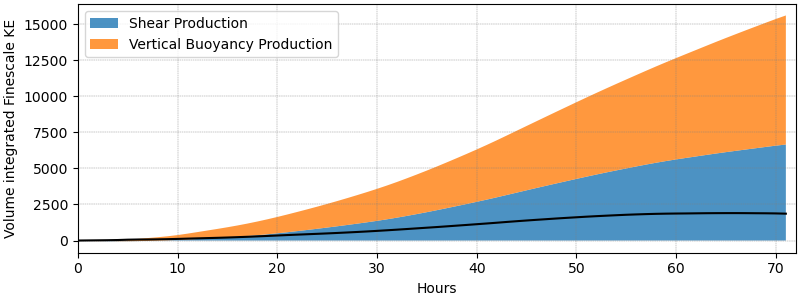

In [23]:
plt.close()
plt.figure(figsize=(8,3), constrained_layout=True)


# plt.stackplot(dsf.day, cbdgt, 
#               labels=['Submesoscale transport', 'Residual transport'], alpha=0.8)

# plt.stackplot(dsf.day, cbdgt, 
#               labels=['Transport outside front',
#                       'Transport inside front: Submesoscale',
#                       'Transport inside front: Residual'], alpha=0.8)

# plt.stackplot(dsf.day, cbdgt, 
#               labels=['Transport outside front',
#                       'Transport inside front: Submesoscale',
#                       'Transport inside front: Residual from Reynolds term',
#                       r"Transport inside front: Residual from Clark term $\overline{\bar{w}c'}$",
#                       r"Transport inside front: Residual from Clark term $\overline{w'\bar{c}}$",
#                       'Transport inside front: Residual from Leonard term'], alpha=0.8)

plt.stackplot(dsf.hour, cbdgt, 
              labels=['Shear Production',
                      'Vertical Buoyancy Production',
                     ], alpha=0.8)

plt.plot(dsf.hour, cbgt0, 'k')
plt.legend()

plt.xlim(0, 72)
# plt.ylim(-1e7, 4.6e8)
plt.grid(c='gray', ls='--', lw=0.3)
plt.ylabel(r'Volume integrated Finescale KE')
plt.xlabel('Hours');